# Proyecto de Aprendizaje Supervisado
- Con este proyecto aprenderemos como construir, entrenar y evaluar un modelo que resuelva una tarea de clasificación.
- Utilizaremos diversas librerías para la manipulación, análisis, visualización, modelado y evaluación de los datos.

### 1. Librerías a básicas utilizar

In [1]:
# Importar librerías

# Manejo de analísis de datos a través de dataframes (data tabular)
import pandas as pd
# Manipulación de arreglos y análisis numérico
import numpy as np
# Visualización de datos
import seaborn as sns
# Visualización de datos
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")


### 2. Diccionario de datos

1. symboling: -3, -2, -1, 0, 1, 2, 3.
2. normalized-losses: continuous from 65 to 256. 
3. make: alfa_romero, audi, bmw, chevrolet, dodge, honda, isuzu, jaguar, mazda, mercedes-benz, mercury, mitsubishi, nissan, peugot, plymouth, porsche, renault, saab, subaru, toyota, volkswagen, volvo
4. fuel_type: diesel, gas.
5. aspiration: std, turbo.
6. num_of_doors: four, two.
7. body_style: hardtop, wagon, sedan, hatchback, convertible. 
8. drive_wheels: 4wd, fwd, rwd.
9. engine_location: front, rear.
10. wheel_base: continuous from 86.6 120.9.
11. length: continuous from 141.1 to 208.1.
12. width: continuous from 60.3 to 72.3.
13. height: continuous from 47.8 to 59.8.
14. curb_weight: continuous from 1488 to 4066.
15. engine_type: dohc, dohcv, l, ohc, ohcf, ohcv, rotor.
16. num_of_cylinders: eight, five, four, six, three, twelve, two. 
17. engine_size: continuous from 61 to 326.
18. fuel_system: 1bbl, 2bbl, 4bbl, idi, mfi, mpfi, spdi, spfi.
19. bore: continuous from 2.54 to 3.94.
20. stroke: continuous from 2.07 to 4.17.
21. compression_ratio: continuous from 7 to 23.
22. horse_power: continuous from 48 to 288.
23. peak_rpm: continuous from 4150 to 6600. 
24. city_mpg: continuous from 13 to 49.
25. highway_mpg: continuous from 16 to 54. 
26. price: continuous from 5118 to 45400.



### 3. Lectura de los datos

Capturamos los datos a partir de un archivo csv. Al no tener los nombres de las columnas pero sí un diccionario de datos, renombramos al momento de obtener el dataframe.

In [2]:
df = pd.read_csv('imports-85.csv',names=['symboling','normalized_losses','make','fuel_type','aspiration',
                                            'num_of_doors','body_style','drive_wheels','engine_location',
                                            'wheel_base','length','width','height','curb_weight',
                                            'engine_type','num_of_cylinders','engine_size','fuel_system',
                                            'bore','stroke','compression_ratio','horse_power','peak_rpm',
                                            'city_mpg','highway_mpg','price'],index_col=False)
df

,symboling,normalized_losses,make,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,engine_location,wheel_base,...,engine_size,fuel_system,bore,stroke,compression_ratio,horse_power,peak_rpm,city_mpg,highway_mpg,price
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845
201,-1,95,volvo,gas,turbo,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045
202,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,...,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485
203,-1,95,volvo,diesel,turbo,four,sedan,rwd,front,109.1,...,145,idi,3.01,3.40,23.0,106,4800,26,27,22470


### 4. Análisis Exploratorio de Datos

- Limpieza de datos
- Exploración de datos
- Ingeniería de datos

In [3]:
df.columns

Index(['symboling', 'normalized_losses', 'make', 'fuel_type', 'aspiration',
       'num_of_doors', 'body_style', 'drive_wheels', 'engine_location',
       'wheel_base', 'length', 'width', 'height', 'curb_weight', 'engine_type',
       'num_of_cylinders', 'engine_size', 'fuel_system', 'bore', 'stroke',
       'compression_ratio', 'horse_power', 'peak_rpm', 'city_mpg',
       'highway_mpg', 'price'],
      dtype='object')

### 4.1 Limpieza de datos

### Valores faltantes y tipos de datos

Vamos a revisar los datos faltantes (explícitos e implícitos)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          205 non-null    int64  
 1   normalized_losses  205 non-null    object 
 2   make               205 non-null    object 
 3   fuel_type          205 non-null    object 
 4   aspiration         205 non-null    object 
 5   num_of_doors       205 non-null    object 
 6   body_style         205 non-null    object 
 7   drive_wheels       205 non-null    object 
 8   engine_location    205 non-null    object 
 9   wheel_base         205 non-null    float64
 10  length             205 non-null    float64
 11  width              205 non-null    float64
 12  height             205 non-null    float64
 13  curb_weight        205 non-null    int64  
 14  engine_type        205 non-null    object 
 15  num_of_cylinders   205 non-null    object 
 16  engine_size        205 non

In [5]:
df.isnull().sum()

symboling            0
normalized_losses    0
make                 0
fuel_type            0
aspiration           0
num_of_doors         0
body_style           0
drive_wheels         0
engine_location      0
wheel_base           0
length               0
width                0
height               0
curb_weight          0
engine_type          0
num_of_cylinders     0
engine_size          0
fuel_system          0
bore                 0
stroke               0
compression_ratio    0
horse_power          0
peak_rpm             0
city_mpg             0
highway_mpg          0
price                0
dtype: int64

Al revisar los datos básicos observamos que a primera vista no existen datos faltantes. 

In [6]:
df.head()

,symboling,normalized_losses,make,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,engine_location,wheel_base,...,engine_size,fuel_system,bore,stroke,compression_ratio,horse_power,peak_rpm,city_mpg,highway_mpg,price
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450


Pero, tan sólo al analizar los primeros registros del dataset (e.g. normalized_losses), nos damos cuenta de datos con valores = ?. Esto, claramente, puede indicar datos faltantes. Para ratificar esta sospecha, tenemos que mirar en que columnas pueden estar apareciendo estos valores.

In [7]:
for var in df.select_dtypes(include=['object']).columns:
    cantidad = df[df[var] == '?'][var].count()
    print(f"Existen {cantidad} valores en {var} con el valor ?")

Existen 41 valores en normalized_losses con el valor ?
Existen 0 valores en make con el valor ?
Existen 0 valores en fuel_type con el valor ?
Existen 0 valores en aspiration con el valor ?
Existen 2 valores en num_of_doors con el valor ?
Existen 0 valores en body_style con el valor ?
Existen 0 valores en drive_wheels con el valor ?
Existen 0 valores en engine_location con el valor ?
Existen 0 valores en engine_type con el valor ?
Existen 0 valores en num_of_cylinders con el valor ?
Existen 0 valores en fuel_system con el valor ?
Existen 4 valores en bore con el valor ?
Existen 4 valores en stroke con el valor ?
Existen 2 valores en horse_power con el valor ?
Existen 2 valores en peak_rpm con el valor ?
Existen 4 valores en price con el valor ?


- Contamos, de todas las variables de tipo objeto (pues son las únicas que pueden contener un valor ?), contamos los valores en los que un valor ? aparece.

- A partir de los resutados podemos observar que existen 7 variables con valores de este tipo.

- Al tener tan pocos registros, no es bueno eliminar, así sean tan pocos, pero si queremos imputarlos debemos cambiarlos a nan

- De igual manera no podemos cambiar el valor de una variable categórica a numérica si existen datos con ?

- Cambiaremos los valores ? por nan, pero primero revisaremos tipos de datos inadecuados para todas las variables del dataset.

- Revisando detalladamente encontramos incongruencias ya que algunas variables tienen datos de distinto tipo al manifestado en el diccionario de datos
    - symboling debería ser categórico
    - normalized-losses debería ser númerico y no categórico
    - bore (diámetro del motor) debería ser numérico
    - stroke debe ser numérico
    - horse-power debe ser numérico
    - peak-rpm debe ser numérico
    - price debe ser numérico

In [8]:
df.dtypes

symboling              int64
normalized_losses     object
make                  object
fuel_type             object
aspiration            object
num_of_doors          object
body_style            object
drive_wheels          object
engine_location       object
wheel_base           float64
length               float64
width                float64
height               float64
curb_weight            int64
engine_type           object
num_of_cylinders      object
engine_size            int64
fuel_system           object
bore                  object
stroke                object
compression_ratio    float64
horse_power           object
peak_rpm              object
city_mpg               int64
highway_mpg            int64
price                 object
dtype: object

Antes de meternos la limpieza de datos debemos ver como están distribuidas las categorías de la clase objetivo symboling. Es importante conocer si nuestro conjunto de datos se encuentra balanceado o no.

<AxesSubplot: xlabel='symboling', ylabel='count'>

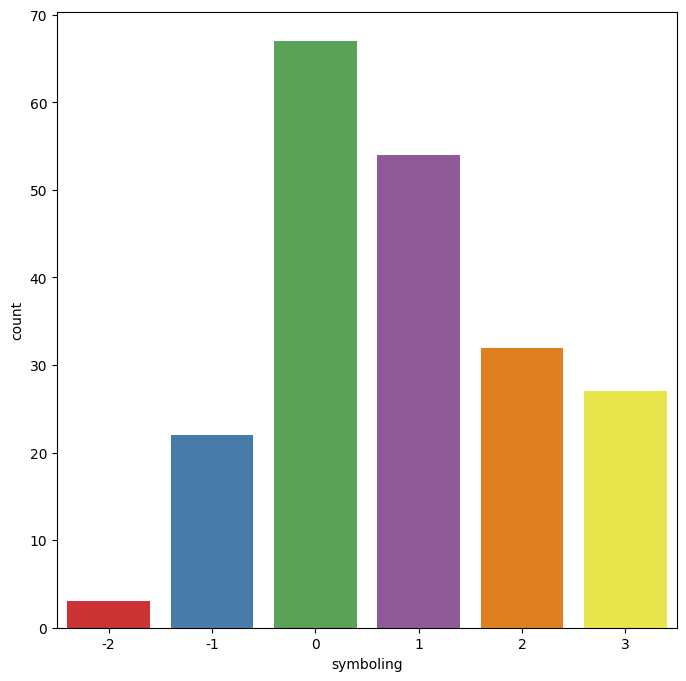

In [9]:
plt.figure(figsize=(8,8))
sns.countplot(x="symboling", data=df, palette = "Set1")

Construímos una tabla para ver las cantidades para cada categoría

In [10]:
pd.crosstab(index=df["symboling"], columns="count")

col_0,count
symboling,
-2,3
-1,22
0,67
1,54
2,32
3,27


Pocos valores para riesgo -2. Tiene sentido agrupar aquellos carros con riesgo negativo.

Teniendo en cuenta lo observado sobre la variable objetivo, creemas un transformer personalizado para realizar los cambios.

Creamos una función para cambiar los tipos de las variables independientes. Igualmente hacemos uso de un diccionario para transformar nuestros valores categóricos ordinales a numéricos.

In [11]:
# Creamos un Transformer personalizado formatea la variable objetivo
# Agrupamos valores con riesgo negativo
# Convertimos el tipo de la variable objetivo a categórica

from sklearn.base import BaseEstimator, TransformerMixin

class Format_target(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        result.loc[(result.symboling < 0), "symboling"] = -1
        result['symboling'] = result['symboling'].astype(int).astype(str)
        return result

In [12]:
df_modified = Format_target().fit_transform(df)

<AxesSubplot: xlabel='symboling', ylabel='count'>

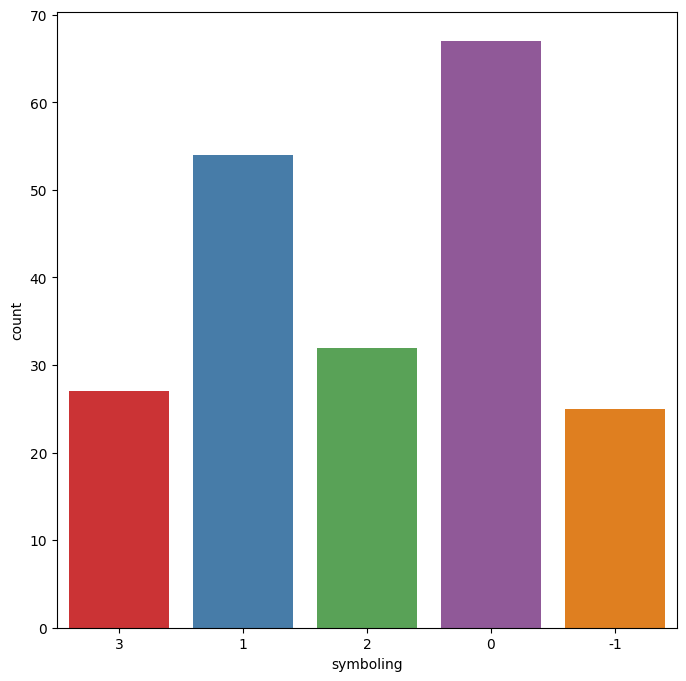

In [13]:
plt.figure(figsize=(8,8))
sns.countplot(x='symboling',data=df_modified, palette='Set1')

In [14]:
# Vemos la tabla luego del cambio

pd.crosstab(index=df_modified["symboling"], columns="count")

col_0,count
symboling,
-1,25
0,67
1,54
2,32
3,27


Nuestro conjunto de datos parece más balanceado con respecto a la variable objetivo. Incluso, antes de realizar más cambios podemos observar la línea base que servirá como punto de partida  para los modelos que vamos a implementar. Al estar trabajando con una tarea de clasificación, utilizamos la clase mayoritaria, en este caso es el riesgo neutro.

In [15]:
df_modified['symboling'][df_modified['symboling'] == '0'].count()/df.shape[0]*100

32.6829268292683

Ahora trabajaremos con los problemas encontrados en las variables independientes con respecto a valores que podrían ser faltantes y tipos de datos distintos a los indicados en el diccionario de datos.

In [16]:
def convert(df,columns,val):
    result = df.copy()
    for col in columns:
        result[col] = result[col].astype(val)
    return result


In [17]:
# Creamos un Transformer personalizado que nos cambia los valores ? por nulos
# Igualmente nos modifica los tipos de variables errados
class Format_variables(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        result = result.replace('?',np.nan)
        result = convert(result,['normalized_losses','compression_ratio','peak_rpm',
            'bore','stroke','price','horse_power'],'float64')
        return result

In [18]:
df_modified = Format_variables().fit_transform(df_modified)

In [19]:
# Verificamos que los tipos de datos son los correctos
# Asimismo nos damos cuenta que ahora sí tenemos datos faltantes
df_modified.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          205 non-null    object 
 1   normalized_losses  164 non-null    float64
 2   make               205 non-null    object 
 3   fuel_type          205 non-null    object 
 4   aspiration         205 non-null    object 
 5   num_of_doors       203 non-null    object 
 6   body_style         205 non-null    object 
 7   drive_wheels       205 non-null    object 
 8   engine_location    205 non-null    object 
 9   wheel_base         205 non-null    float64
 10  length             205 non-null    float64
 11  width              205 non-null    float64
 12  height             205 non-null    float64
 13  curb_weight        205 non-null    int64  
 14  engine_type        205 non-null    object 
 15  num_of_cylinders   205 non-null    object 
 16  engine_size        205 non

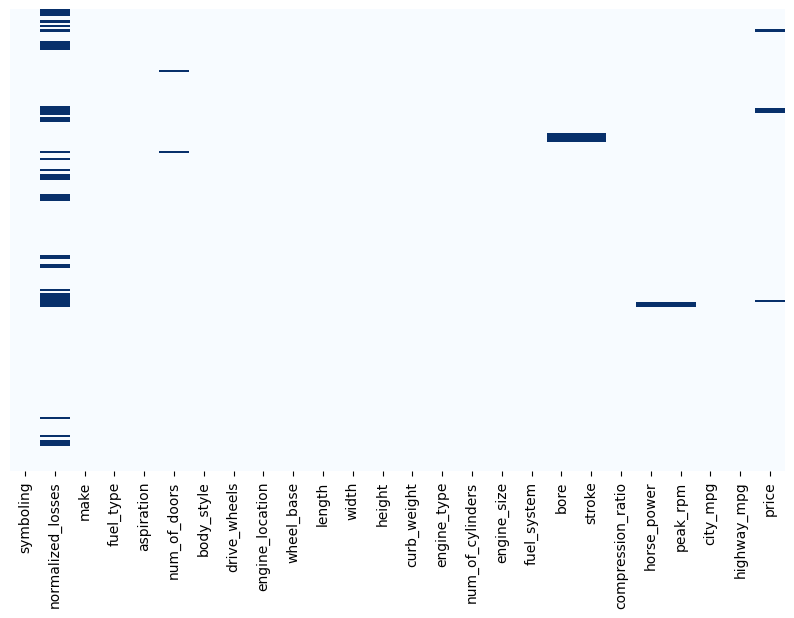

In [20]:
# Dibujamos un mapa de calor para vislumbrar la ubicación de los valores faltantes

plt.figure(figsize=(10,6))
sns.heatmap(df_modified.isnull(), yticklabels = False, cbar = False, cmap="Blues")
plt.show()

In [21]:
df_modified.isnull().sum()

symboling             0
normalized_losses    41
make                  0
fuel_type             0
aspiration            0
num_of_doors          2
body_style            0
drive_wheels          0
engine_location       0
wheel_base            0
length                0
width                 0
height                0
curb_weight           0
engine_type           0
num_of_cylinders      0
engine_size           0
fuel_system           0
bore                  4
stroke                4
compression_ratio     0
horse_power           2
peak_rpm              2
city_mpg              0
highway_mpg           0
price                 4
dtype: int64

Cada columna tiene 205 registros y de las 26 (25 independientes y 1 dependiente) tenemos 7 con datos faltantes.

- normalized_losses: 41 faltantes
- num_of_doors: 2 faltantes
- bore: 4 faltantes
- stroke: 4 faltantes
- horsepower: 2 faltantes
- peak-rpm: 2 faltantes
- price: 4 faltantes

¿Cómo manejar estos valores faltantes?
- Eliminar columnas o registros.
- Imputar con la media, frecuencia o con base en alguna función

En este caso trabajaremos de la siguiente manera:
- Imputación con la media (numéricas):
    - normalized_losses
    - stroke
    - bore
    - horse_power
    - peak_rpm
    - price
- Imputación con la moda:
    - num_of_doors

In [22]:
df_modified

,symboling,normalized_losses,make,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,engine_location,wheel_base,...,engine_size,fuel_system,bore,stroke,compression_ratio,horse_power,peak_rpm,city_mpg,highway_mpg,price
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111.0,5000.0,21,27,13495.0
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111.0,5000.0,21,27,16500.0
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154.0,5000.0,19,26,16500.0
3,2,164.0,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102.0,5500.0,24,30,13950.0
4,2,164.0,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115.0,5500.0,18,22,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,-1,95.0,volvo,gas,std,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,9.5,114.0,5400.0,23,28,16845.0
201,-1,95.0,volvo,gas,turbo,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,8.7,160.0,5300.0,19,25,19045.0
202,-1,95.0,volvo,gas,std,four,sedan,rwd,front,109.1,...,173,mpfi,3.58,2.87,8.8,134.0,5500.0,18,23,21485.0
203,-1,95.0,volvo,diesel,turbo,four,sedan,rwd,front,109.1,...,145,idi,3.01,3.40,23.0,106.0,4800.0,26,27,22470.0


In [23]:
# Creamos un Transformer personalizado que nos imputa los valores faltantes
# Utiliza la media para columnas numéricas y la moda para las categóricas
class Imputer(BaseEstimator, TransformerMixin):
    def __init__(self, cont, cat):
        self.cont = cont
        self.cat = cat

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        for c in self.cont:
            avg = result[c].mean(axis=0)
            result[c].replace(np.nan,avg,inplace=True)
        for c in self.cat:
            mode = result[c].value_counts().idxmax()
            result[c].replace(np.nan,mode,inplace=True)
        return result

In [24]:
cont = ['normalized_losses', 'stroke', 'bore', 'horse_power', 'peak_rpm', 'price']
cat = ['num_of_doors']

df_modified = Imputer(cont,cat).fit_transform(df_modified)

In [25]:
df_modified.info(all)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          205 non-null    object 
 1   normalized_losses  205 non-null    float64
 2   make               205 non-null    object 
 3   fuel_type          205 non-null    object 
 4   aspiration         205 non-null    object 
 5   num_of_doors       205 non-null    object 
 6   body_style         205 non-null    object 
 7   drive_wheels       205 non-null    object 
 8   engine_location    205 non-null    object 
 9   wheel_base         205 non-null    float64
 10  length             205 non-null    float64
 11  width              205 non-null    float64
 12  height             205 non-null    float64
 13  curb_weight        205 non-null    int64  
 14  engine_type        205 non-null    object 
 15  num_of_cylinders   205 non-null    object 
 16  engine_size        205 non

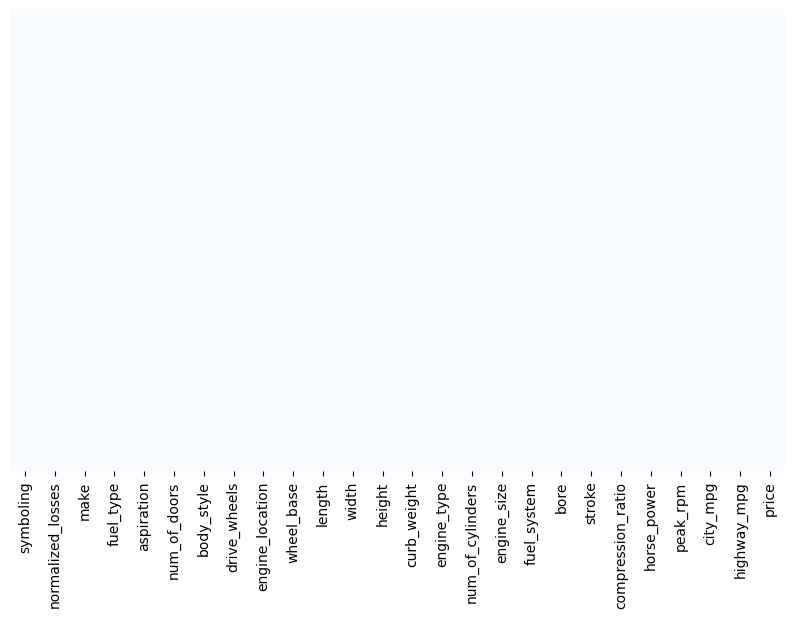

In [26]:
# Dibujamos un mapa de calor para vislumbrar la ubicación de los valores faltantes

plt.figure(figsize=(10,6))
sns.heatmap(df_modified.isnull(), yticklabels = False, cbar = False, cmap="Blues")
plt.show()

Observamos que ya no contamos con valores faltantes.

### Valores atípicos
Visualizamos utilizando
- Diagramas de cajas y bigotes
- Histogramas

In [27]:
# Función para graficar los valores continuos del dataframe
def outliers_visual(data):
    cont_vars = list(data.select_dtypes('number').columns)
    plt.figure(figsize=(15, 40))
    i = 0
    val = int(len(cont_vars)/2) + 1
    for col in cont_vars:
        i += 1
        plt.subplot(val, 4, i)
        plt.boxplot(data[col])
        plt.title('{} boxplot'.format(col))
        i += 1
        plt.subplot(val, 4, i)
        plt.hist(data[col])
        plt.title('{} histogram'.format(col))
        
    plt.show()

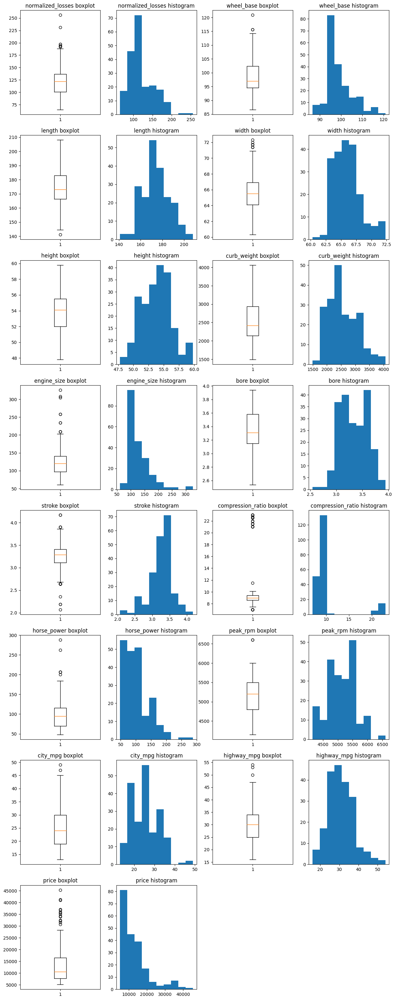

In [28]:
outliers_visual(df_modified)

Utilizando los gráficos anteriores podemos observar las distribuciones para cada variable continua.

Visualmente resulta claro que existen outliers para algunas de las variables dentro del dataset:
- normalized_losses
- wheel_base
- width
- engine_size
- stroke
- compression_ratio
- horse_power
- city_mpg
- highway_mpg
- price

Podemos corroborar lo anterior de manera estadística haciendo uso del método de Tukey (se consideran como datos atípicos aquellos que están 1.5 veces por fuera del rango intercuartil)

In [29]:
# Función para calcular los datos atípicos utilizando el método de Tukey
def outlier_count(col, data):
    print(15*'-' + col + 15*'-')
    q75, q25 = np.percentile(data[col], [75, 25])
    iqr = q75 - q25
    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    outlier_count = len(np.where((data[col] > max_val) | (data[col] < min_val))[0])
    outlier_percent = round(outlier_count/len(data[col])*100, 2)
    print('Number of outliers: {}'.format(outlier_count))
    print('Percent of data that is outlier: {}%'.format(outlier_percent))
    return outlier_count

In [30]:
# Guardar las columnas de tipo continuas con datos atípicos
cont_vars = []
for col in list(df_modified.select_dtypes('number').columns):
    if outlier_count(col, df_modified) > 0:
        cont_vars.append(col)

---------------normalized_losses---------------
Number of outliers: 8
Percent of data that is outlier: 3.9%
---------------wheel_base---------------
Number of outliers: 3
Percent of data that is outlier: 1.46%
---------------length---------------
Number of outliers: 1
Percent of data that is outlier: 0.49%
---------------width---------------
Number of outliers: 8
Percent of data that is outlier: 3.9%
---------------height---------------
Number of outliers: 0
Percent of data that is outlier: 0.0%
---------------curb_weight---------------
Number of outliers: 0
Percent of data that is outlier: 0.0%
---------------engine_size---------------
Number of outliers: 10
Percent of data that is outlier: 4.88%
---------------bore---------------
Number of outliers: 0
Percent of data that is outlier: 0.0%
---------------stroke---------------
Number of outliers: 20
Percent of data that is outlier: 9.76%
---------------compression_ratio---------------
Number of outliers: 28
Percent of data that is outl

Teniendo en cuenta los gráficos previos y los estadísticos, se puede ver que existen cantidades diferentes de outliers para cada variable y hacia diferentes direcciones. Limitaremos a través de winsorizing

In [31]:
from scipy.stats.mstats import winsorize

wins_dict = {}

def test_wins(col, df, wins_dict, lower_limit=0, upper_limit=0, show_plot=True):
    wins_data = winsorize(df[col], limits=(lower_limit, upper_limit))
    wins_dict[col] = wins_data
    if show_plot == True:
        plt.figure(figsize=(15,5))
        plt.subplot(121)
        plt.boxplot(df[col])
        plt.title('original {}'.format(col))
        plt.subplot(122)
        plt.boxplot(wins_data)
        plt.title('wins=({},{}) {}'.format(lower_limit, upper_limit, col))
        plt.show()
    return wins_dict

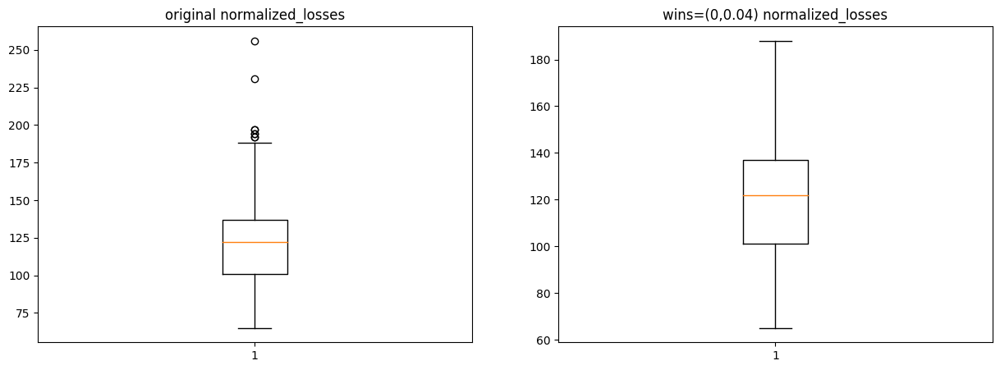

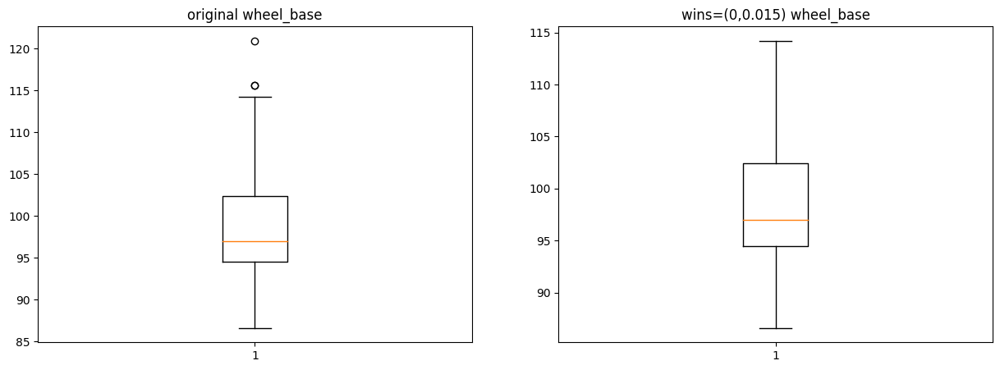

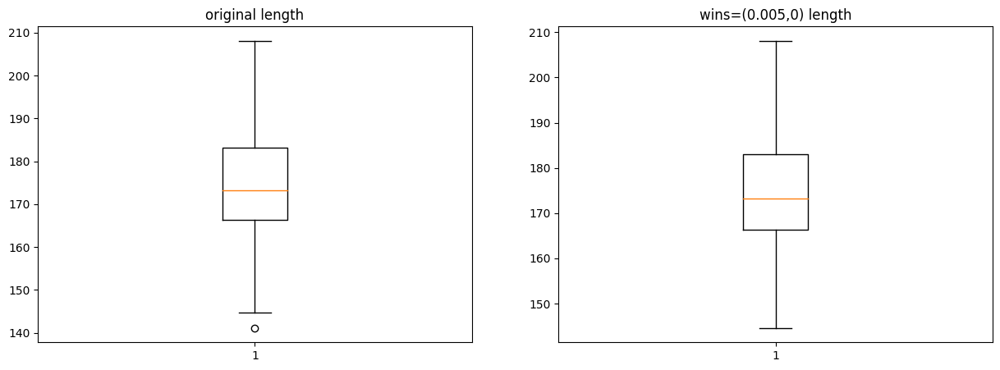

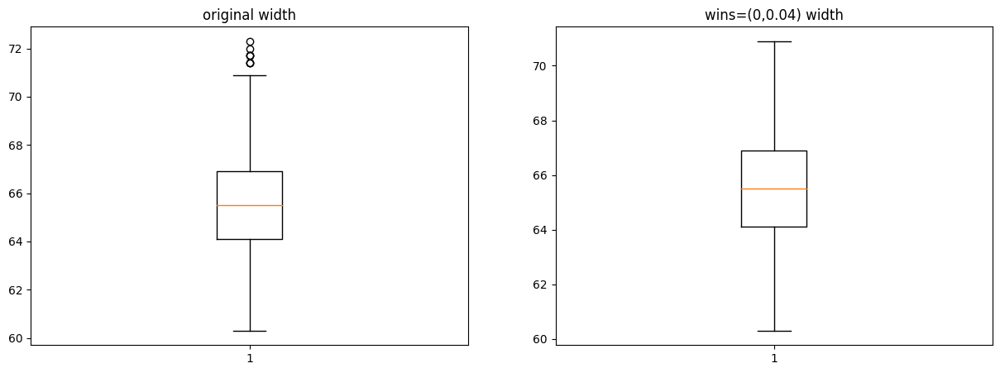

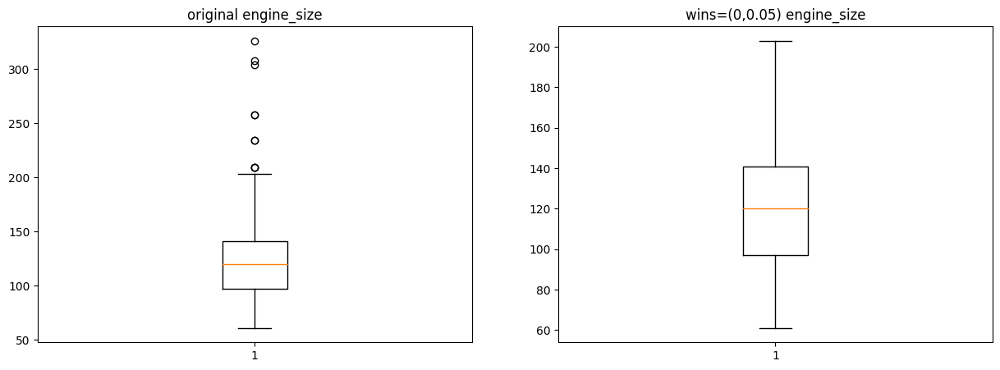

...

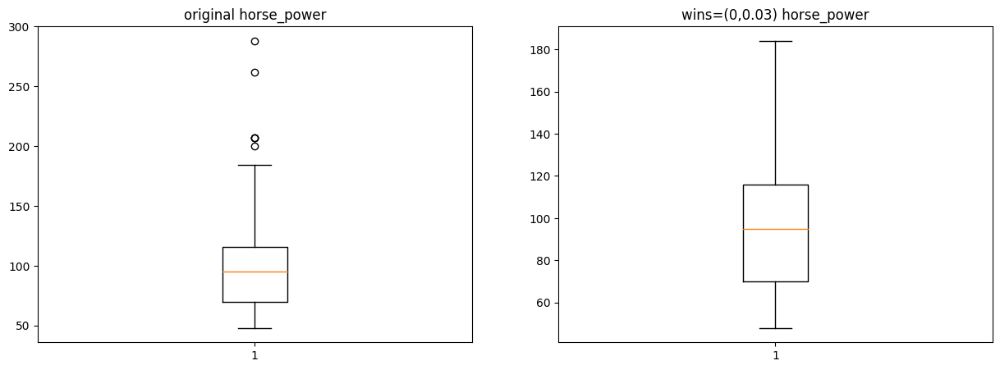

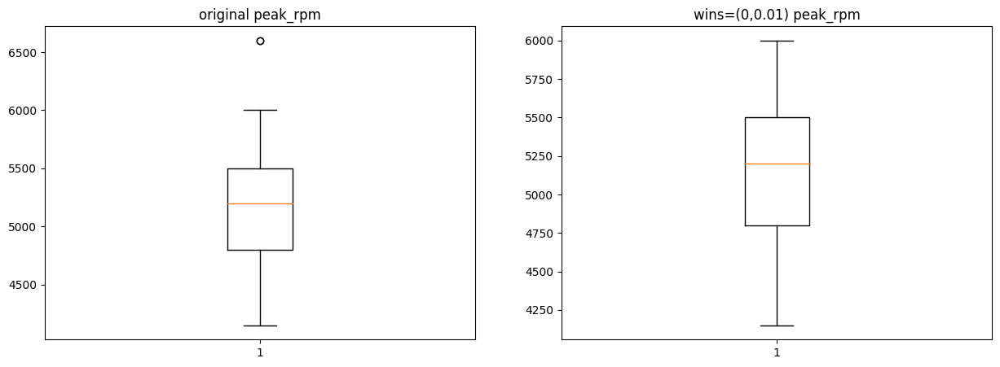

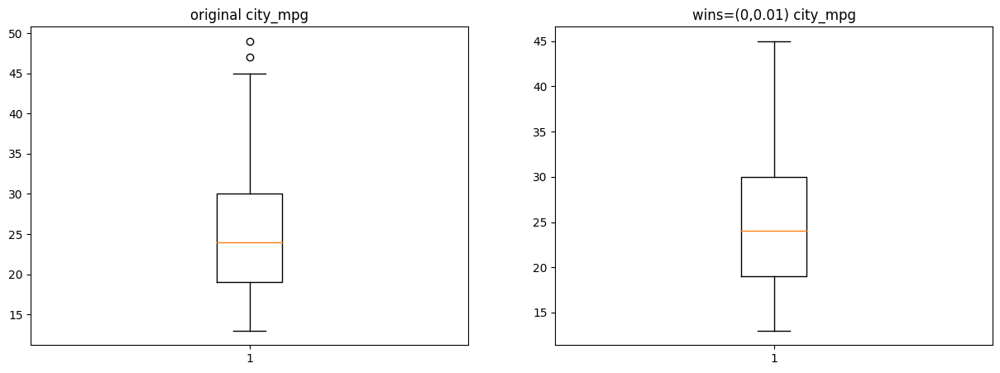

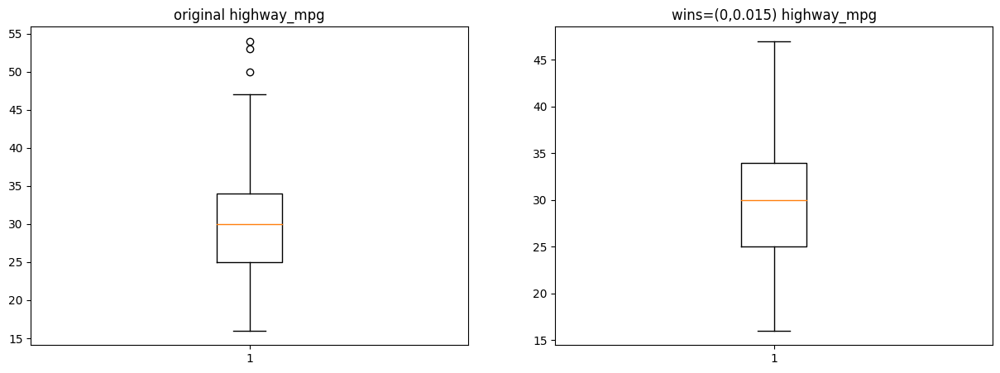

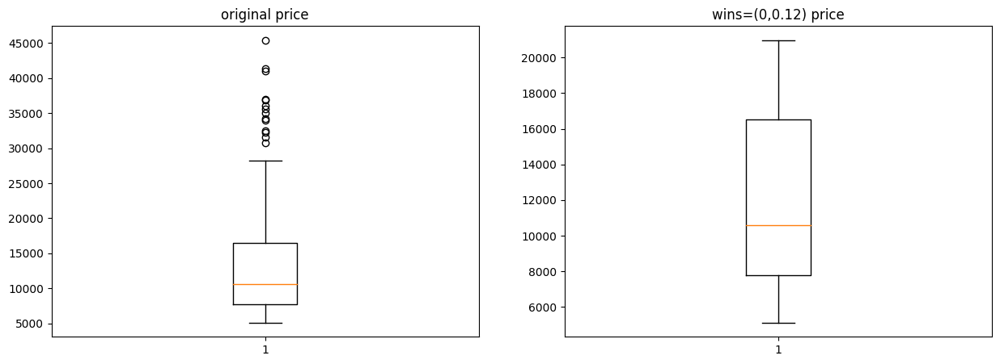

In [32]:
# Verificación de la winsorizing
wins_dict = {}
wins_dict = test_wins(cont_vars[0], df_modified, wins_dict, upper_limit=.04, show_plot=True)
wins_dict = test_wins(cont_vars[1], df_modified, wins_dict, upper_limit=.015, show_plot=True)
wins_dict = test_wins(cont_vars[2], df_modified, wins_dict, lower_limit=.005, show_plot=True)
wins_dict = test_wins(cont_vars[3], df_modified, wins_dict, upper_limit=.04, show_plot=True)
wins_dict = test_wins(cont_vars[4], df_modified, wins_dict, upper_limit=.05, show_plot=True)
wins_dict = test_wins(cont_vars[5], df_modified, wins_dict, lower_limit=.09, upper_limit=.04, show_plot=True)
wins_dict = test_wins(cont_vars[6], df_modified, wins_dict, lower_limit=.09, upper_limit=.11, show_plot=True)
wins_dict = test_wins(cont_vars[7], df_modified, wins_dict, upper_limit=.03, show_plot=True)
wins_dict = test_wins(cont_vars[8], df_modified, wins_dict, upper_limit=.01, show_plot=True)
wins_dict = test_wins(cont_vars[9], df_modified, wins_dict, upper_limit=.01, show_plot=True)
wins_dict = test_wins(cont_vars[10], df_modified, wins_dict, upper_limit=.015, show_plot=True)
wins_dict = test_wins(cont_vars[11], df_modified, wins_dict, upper_limit=.12, show_plot=True)

In [33]:
# Creamos un Transformer personalizado para limitar los outliers con el winsorizing
class Winsorizer(BaseEstimator, TransformerMixin):
    def __init__(self, wins, cont_vars):
        self.wins = wins
        self.cont_vars = cont_vars
        
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        for col in cont_vars:
            result[col] = self.wins[col]     
        return result

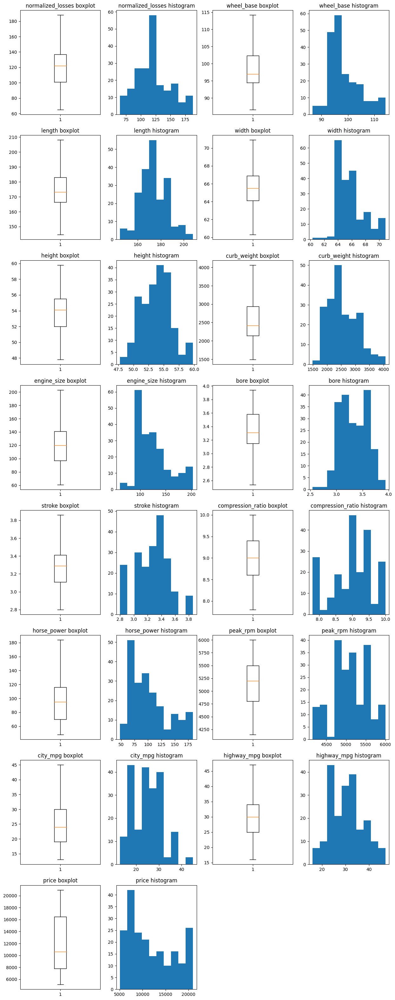

In [34]:
df_wins = Winsorizer(wins_dict,cont_vars).fit_transform(df_modified)
outliers_visual(df_wins)

### 4.2 Exploración de datos

#### Análisis univariado

In [35]:
# Descriptores estadísticos para valores continuos
df_wins.describe()

,normalized_losses,wheel_base,length,width,height,curb_weight,engine_size,bore,stroke,compression_ratio,horse_power,peak_rpm,city_mpg,highway_mpg,price
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.00000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,121.273171,98.710244,174.066341,65.876585,53.724878,2555.565854,124.37561,3.329751,3.273423,9.003024,102.953719,5119.515800,25.190244,30.673171,12034.553743
std,29.558574,5.880646,12.293813,2.063748,2.443522,520.680204,33.50637,0.270844,0.253273,0.631184,35.488656,462.228774,6.444933,6.663885,4995.403910
min,65.000000,86.600000,144.600000,60.300000,47.800000,1488.000000,61.00000,2.540000,2.800000,7.800000,48.000000,4150.000000,13.000000,16.000000,5118.000000
25%,101.000000,94.500000,166.300000,64.100000,52.000000,2145.000000,97.00000,3.150000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,7788.000000
50%,122.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.00000,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,10595.000000
75%,137.000000,102.400000,183.100000,66.900000,55.500000,2935.000000,141.00000,3.580000,3.410000,9.400000,116.000000,5500.000000,30.000000,34.000000,16500.000000
max,188.000000,114.200000,208.100000,70.900000,59.800000,4066.000000,203.00000,3.940000,3.860000,10.000000,184.000000,6000.000000,45.000000,47.000000,20970.000000


In [36]:
# Descriptores estadísticos para valores categóricos
df_wins.describe(include='O')

,symboling,make,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,engine_location,engine_type,num_of_cylinders,fuel_system
count,205,205,205,205,205,205,205,205,205,205,205
unique,5,22,2,2,2,5,3,2,7,7,8
top,0,toyota,gas,std,four,sedan,fwd,front,ohc,four,mpfi
freq,67,32,185,168,116,96,120,202,148,159,94


In [37]:
# Función para visualizar las distribuciones de las variables continuas
def visualize_distributions(df):
    cols = df.select_dtypes('number').columns
    val = int(len(cols)/2)+1
    plt.figure(figsize=(15, 40))
    for i, col in enumerate(cols, 1):
        plt.subplot(val, 4, i)
        plt.hist(df[col])
        plt.title(col)

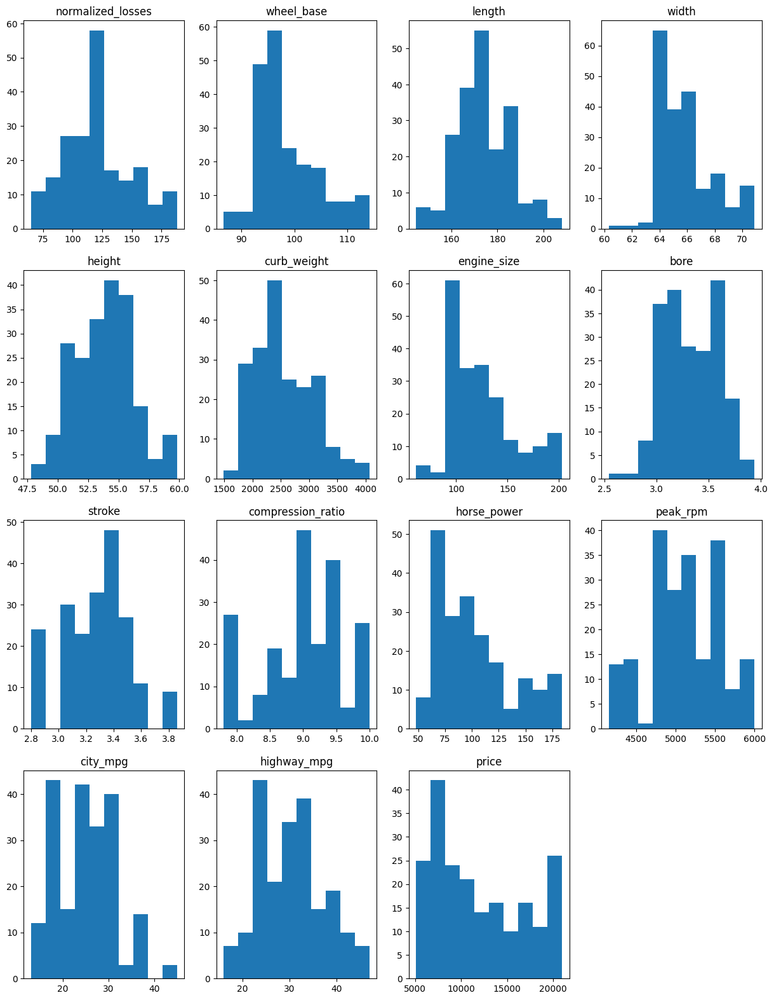

In [38]:
# Visualizamos la distribución de las variables continuas
visualize_distributions(df_wins)

Luego de realizar la limpieza de datos, imputando datos y winsorizing, logramos percibir distribuciones menos segadas.

Text(0.5, 0, 'Make')

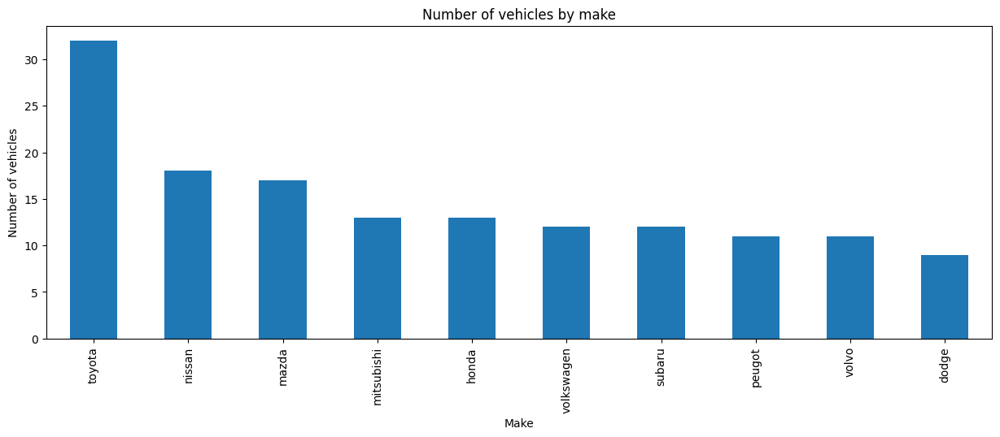

In [39]:
df_wins.make.value_counts().nlargest(10).plot(kind='bar', figsize=(15,5))
plt.title("Number of vehicles by make")
plt.ylabel('Number of vehicles')
plt.xlabel('Make')

Text(0.5, 0, 'Fuel type')

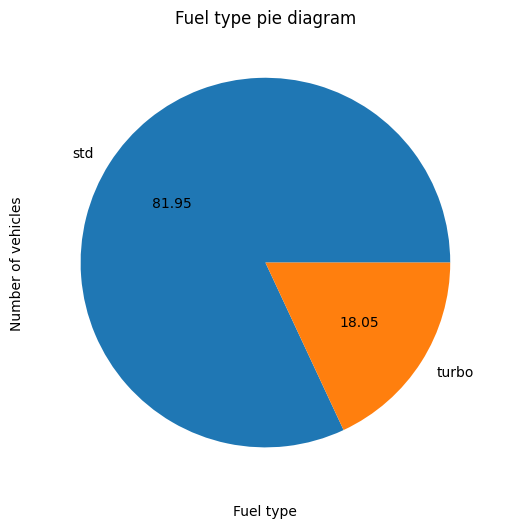

In [40]:
df_wins['aspiration'].value_counts().plot.pie(figsize=(6, 6), autopct='%.2f')
plt.title("Fuel type pie diagram")
plt.ylabel('Number of vehicles')
plt.xlabel('Fuel type')

Text(0.5, 0, 'Horse power')

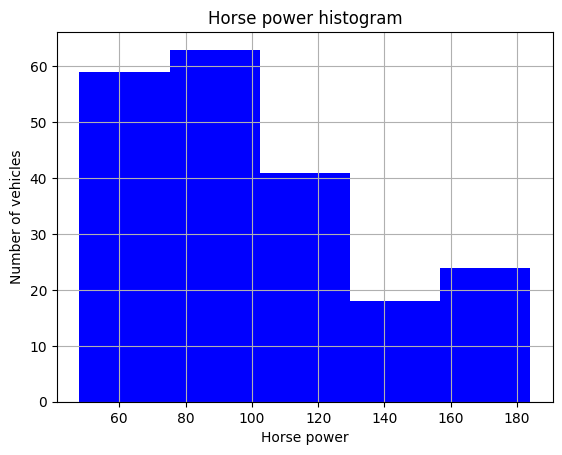

In [41]:
df_wins.horse_power[np.abs(df_wins.horse_power-df_wins.horse_power.mean())<=(3*df_wins.horse_power.std())].hist(bins=5,color='blue');
plt.title("Horse power histogram")
plt.ylabel('Number of vehicles')
plt.xlabel('Horse power')

Text(0.5, 0, 'Curb weight')

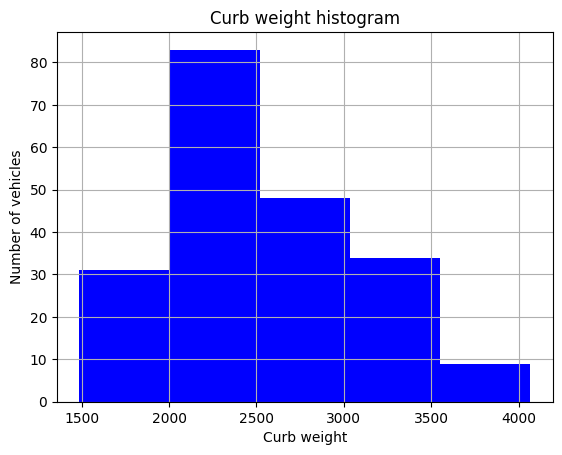

In [42]:
df_wins['curb_weight'].hist(bins=5,color='blue')
plt.title("Curb weight histogram")
plt.ylabel('Number of vehicles')
plt.xlabel('Curb weight')

Text(0.5, 0, 'Drive wheels')

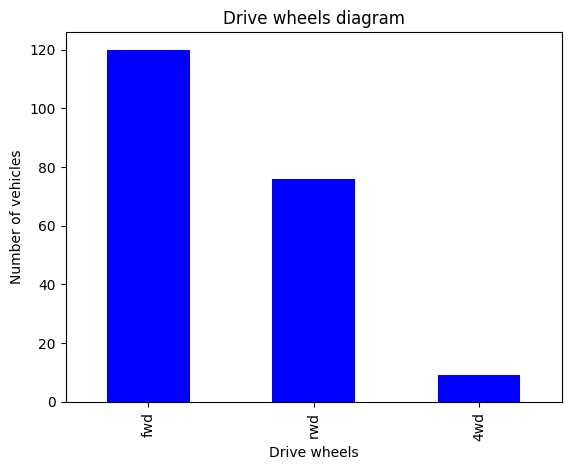

In [43]:
df_wins['drive_wheels'].value_counts().plot(kind='bar',color='blue')
plt.title("Drive wheels diagram")
plt.ylabel('Number of vehicles')
plt.xlabel('Drive wheels')

Text(0.5, 0, 'Number of doors')

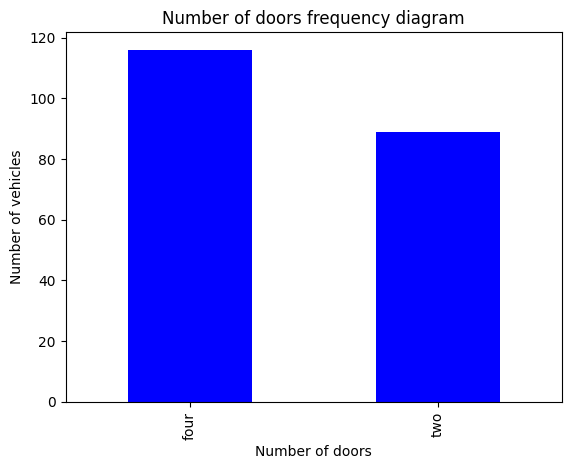

In [44]:
df_wins['num_of_doors'].value_counts().plot(kind='bar',color='blue')
plt.title("Number of doors frequency diagram")
plt.ylabel('Number of vehicles')
plt.xlabel('Number of doors')

Text(0.5, 0, 'Normalized losses')

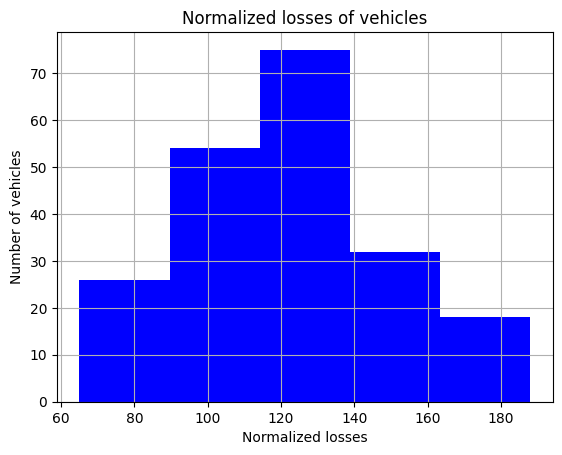

In [45]:
df_wins['normalized_losses'].hist(bins=5,color='blue')
plt.title("Normalized losses of vehicles")
plt.ylabel('Number of vehicles')
plt.xlabel('Normalized losses')

A partir del anterior del anterior análisis obtenemos los siguientes hallazgos:

- Toyate es la comàñía que tiene más vehículos, más del 40% más que Nissan 
- El tipo de combustible más popular es el estándar con más del 80%.
- Front wheel drive es la primera elección en vehículos, siguidos de rear wheel y four wheel (muy pocos de estos últimos). 
- Curb weight está distribuida entre 1500 y 4000 aproximadamente
- Normalized losses, que no es más que el promedio de pérdidas por vehículo asegurado al año, tiene más número de carros en el rango de 90 a 140

#### Análisis Bivariado

Haciendo uso del diagrama de cajas y bigotes obtendremos un resumen visual de la distribución de cada una de las variables independientes con respecto a la dependiente, observando así la distribución de los distintos grupos.

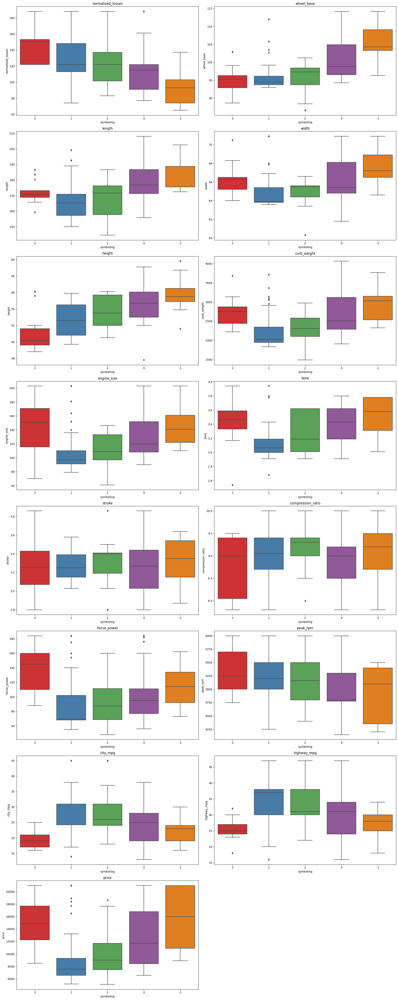

In [46]:
fig = plt.figure(figsize=(20,50))
i=1

for var_num in df_wins.select_dtypes(include=['int64','float64']):
    ax = fig.add_subplot(8, 2, i)
    sns.boxplot(x=df_wins.columns[0], y=var_num, data=df_wins, palette='Set1')
    plt.title(var_num)
    i+=1
fig.tight_layout()

Conociendo un poco acerca de las distribuciones de las variables con respecto a la variable objetivo, nos podemos dar una primera idea sobre cuáles características podrían resultar siendo más importantes al momento de influir en la variable objetivo. Esto resulta útil pues al incluirlas, nuestro modelo puede brindarnos mejores resultados en cuanto a correctitud de la predicción.

Observando las medianas de cada grupo (características) nos puede mostrar si verdaderamente existe una relación entre dicha variable independiente y la objetivo.

El tamaño de la caja nos puede mostrar la variabilidad dentro de esa característica.

Por ejemplo podemos notar que:

- normalized_losses evidentemente indica una relación directamente proporcional con el riesgo. Es decir, mayores pérdidas claramente indica mayor riesgo.
- wheel_base más alto, al igual que largo y ancho del vehículo parece asociarse con riesgo negativo o neutro
- mayor tamaño del motor asociado a mayor riesgo

Para ratificar algunos de estos descubrimientos utilizamos un diagrama de violín. Al ser estos unos diagramas que combinan los boxplots y los diagramas de densidad, nos pueden dar una noción de qué variables independientes pueden sernos de mayor untilidad para distinguir entre las distintas categorías de la variable objetivo.


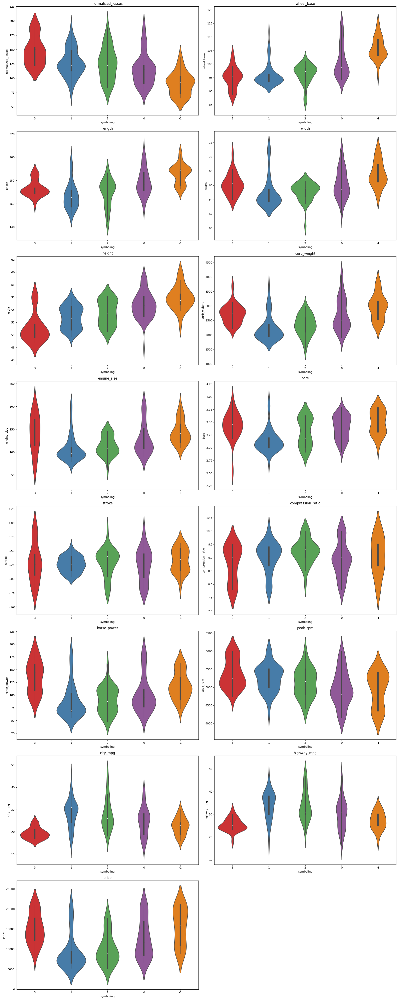

In [47]:
fig = plt.figure(figsize=(20,50))
i=1

for var_num in df_wins.select_dtypes(include=['int64','float64']):
    ax = fig.add_subplot(8, 2, i)
    sns.violinplot(x=df_wins.columns[0], y=var_num, data=df_wins, palette='Set1')
    plt.title(var_num)
    i+=1
fig.tight_layout()

Vamos a ubicar los registros de acuerdo a su categoría, de manera que podamos dibujar nuestro diagrama de densidad.

In [48]:
def categories(df):
    risks = {}
    risks['neg'] = df.loc[df.symboling == "-1"]
    risks['neutral'] = df.loc[df.symboling == "0"]
    risks['1'] = df.loc[df.symboling == "1"]
    risks['2'] = df.loc[df.symboling == "2"]
    risks['3'] = df.loc[df.symboling == "3"]
    return risks 

Con el diagrama de densidad se puede observar aquellas variables independientes que mejor 
discriminan las clases de la variable objetivo.

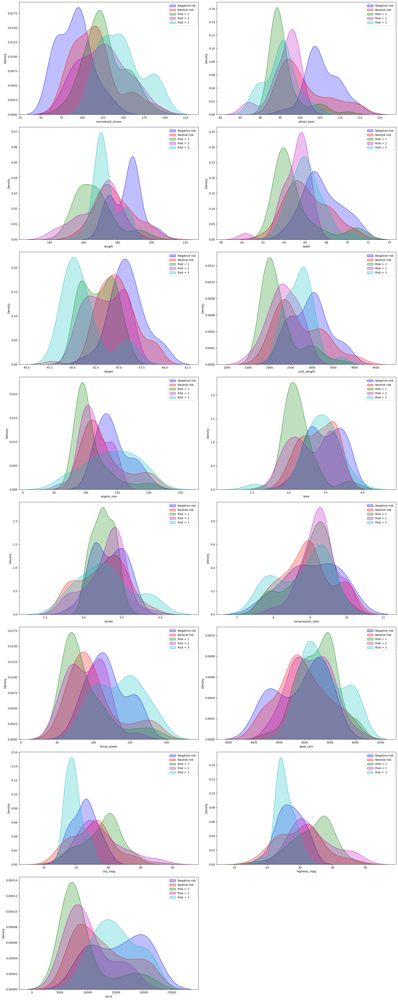

In [49]:
risks = categories(df_wins)

i=1
fig = plt.figure(figsize=[20, 50])
for var_num in df_wins.select_dtypes('number').columns:
    ax = fig.add_subplot(8, 2, i)
    sns.kdeplot(risks['neg'][[var_num]].iloc[:,0], shade=True, color="b", label="Negative risk",palette='Set1')
    sns.kdeplot(risks['neutral'][[var_num]].iloc[:,0], shade=True, color="r", label="Neutral risk",palette='Set1')
    sns.kdeplot(risks['1'][[var_num]].iloc[:,0], shade=True, color="g", label="Risk = 1",palette='Set1')
    sns.kdeplot(risks['2'][[var_num]].iloc[:,0], shade=True, color="m", label="Risk = 2",palette='Set1')
    sns.kdeplot(risks['3'][[var_num]].iloc[:,0], shade=True, color="c", label="Risk = 3",palette='Set1')
    plt.legend()
    i+=1
fig.tight_layout()

Utilizando los gráficos de densidad logramos percibir que algunas features nos permiten distinguir la variable objetivo, mientras otras no nos brindan mayor información.

Dentro de las candidatas podríamos tener:
- normalized_losses
- wheel_base
- length
- city_mpg
- highway_mpg
- price


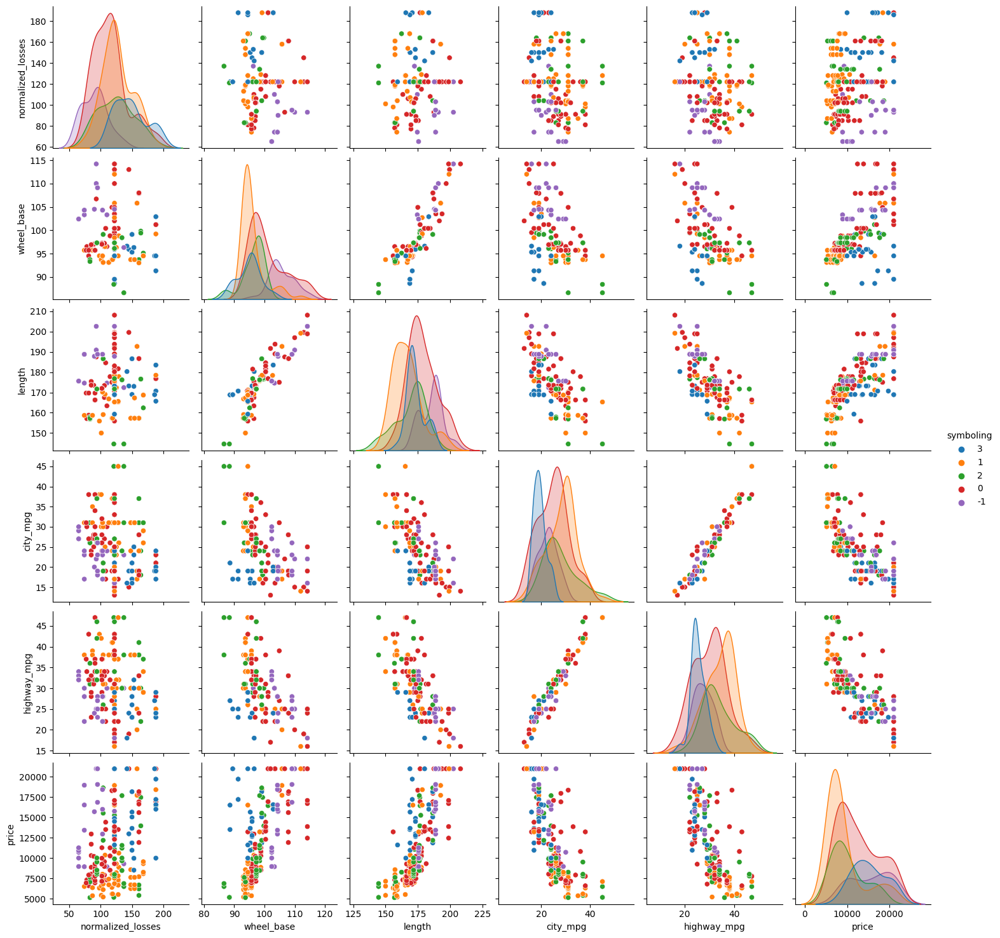

In [50]:

ax = sns.pairplot(df_wins, vars=['normalized_losses','wheel_base', 'length', 
                                 'city_mpg', 'highway_mpg', 'price'], hue="symboling")

Haciendo uso de los pairplots de aquellas variables que mejor discriminaban la variable objetivo, intentamos encontrar combinaciones que nos ayuden a distinguir mejor los 5 grupos de riesgo que tenemos en nuestra variable objetivo symboling.

Definitivamente no resulta claro un par de variables que nos discrimene la variable objetivo

### Matriz de correlación

Vamos a utilizar la matriz de correlación para corroborar los indicios sobre las relaciones presentes entre algunas de las características y la variable objetivo.

El uso de la matriz de correlación es importante para conocer la correlación entre cada par de variables
- Las variables independientes a utilizar deberían estar altamente correlacionadas con la objetivo
- Se deben evitar problemas de multicolinealidad
- Las variables independientes no deben estar correlacionadas entre sí
- Si las variables independientes se encuentran altamente correlacionadas, el modelo puede presentar problemas al momento de entrenarlo e interpretarlo. No se podría aislar la relación entre cada variable independiente y la dependiente. Si no se pueden aislar los efectos, se pueden confundir dichos efectos
- Cuando las variables independientes están muy correlacionadas entre sí los cambios en una variable están asociados con cambios en otra variable y, por tanto, los coeficientes de regresión del modelo ya no van a medir el efecto de una variable independiente sobre la respuesta manteniendo constante, o sin variar, el resto de predictores. 
- Al contar con variables categóricas (la dependiente y varias dependientes) no podemos utilizar la matriz de correlación clásica que utiliza el coeficiente de correlación de Pearson ya que este tan sólo nos sirve para relación entre variables continuas.
- Al haber varias características categóricas utilizamos la función associations de dython que utiliza el coeficiente de Pearson para continuas vs continuas, la razón de correlación para continuas vs categóricas y Cramer's V o Theil's U para categóricas vs categóricas

In [51]:

# Utilizamos la librería dython para identificar las variables categóricas y numéricas
from dython.nominal import identify_nominal_columns, identify_numeric_columns, correlation_ratio
categorical_features=identify_nominal_columns(df_wins)
continuous_features=identify_numeric_columns(df_wins)
categorical_features

['symboling',
 'make',
 'fuel_type',
 'aspiration',
 'num_of_doors',
 'body_style',
 'drive_wheels',
 'engine_location',
 'engine_type',
 'num_of_cylinders',
 'fuel_system']

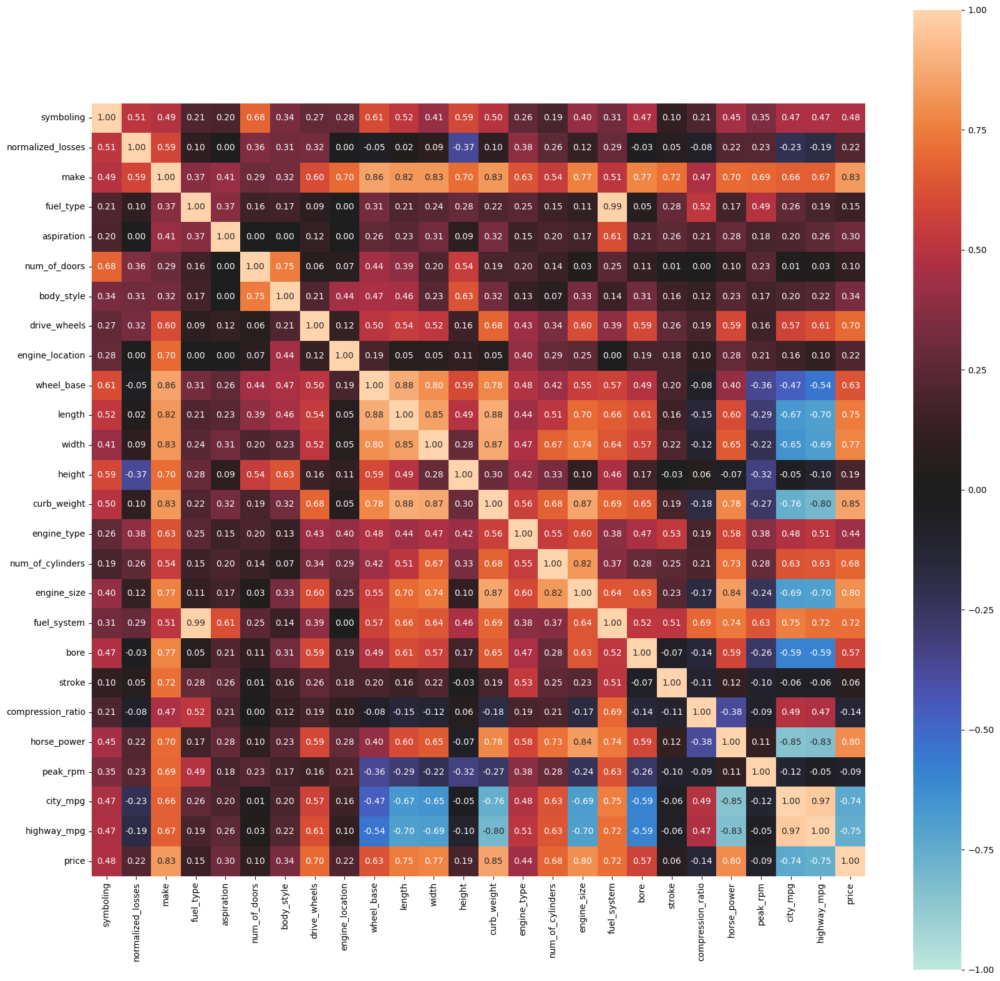

In [52]:

from dython.nominal import associations
complete_correlation= associations(df_wins, filename= 'complete_correlation.png', figsize=(20,20))


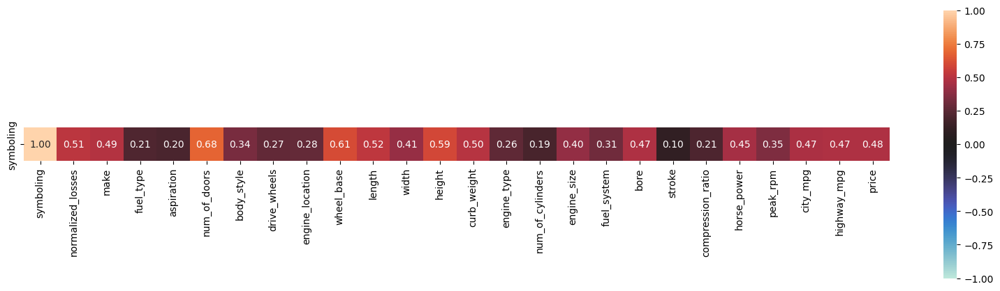

In [53]:
target_correlation= associations(df_wins, display_rows=['symboling'], filename= 'target_correlation.png', figsize=(20,5))

Detallamos primero las variables independientes que más influencian a la objetivo (aunque ninguna tiene una alta correlación >= 0.7 o <= -0.7):
- num_of_doors
- normalized_losses
- wheel_base
- length
- height
- curb_weight

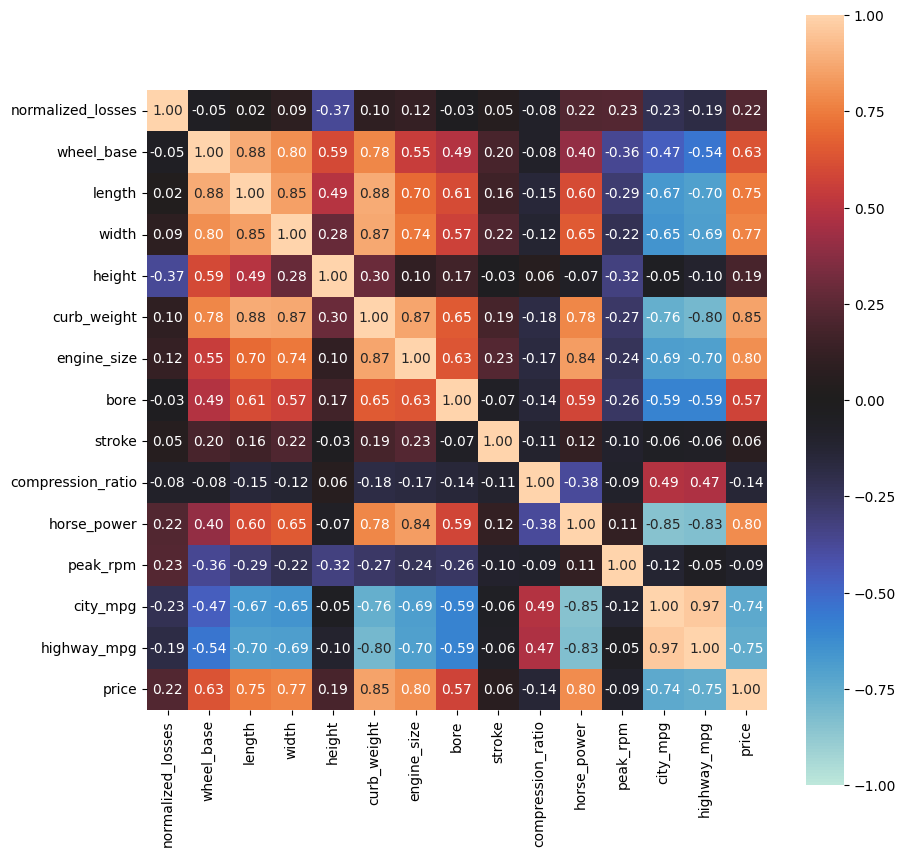

In [54]:
# Obtenemos la matriz de correlación entre las variables continuas

selected_column= df_wins[continuous_features]
continuous_df = selected_column.copy()

continuous_correlation= associations(continuous_df, filename= 'continuous_correlation.png', figsize=(10,10))

Revisamos aquellas variables independientes continuas que pueden llegar a generar problemas al encontrarse altamente correlacionadas entre sí (problemas de multicolinealidad, redundancia, complejitud innecesaria del modelo):
- wheel_base y length 0.88
- wheel_base y width 0.8
- wheel_base y curb_weight 0.78
- lenght y width 0.85
- length y curb_weight 0.88
- length y engine_size 0.7
- length y highway_mpg -0.7
- length y price 0.7
- width y curb_weight 0.87
- width y engine_size 0.74
- width y price 0.77
- curb_weight y engine_size 0.87
- curb_weight y horse_power 0.78
- curb_weight y city_mpg -0.76
- curb_weight y highway_mpg -0.8
- curb_weight y price 0.85
- engine_size y horse_power 0.84
- engine_size y highway_mpg -0.7
- engine_size y price 0.8
- horse_power y city_mpg -0.85
- horse_power y highway_mpg -0.83
- horse_power y price 0.8
- city_mpg y highway_mpg 0.97
- city_mpg y price -0.74
- highway_mpg y price -0.75

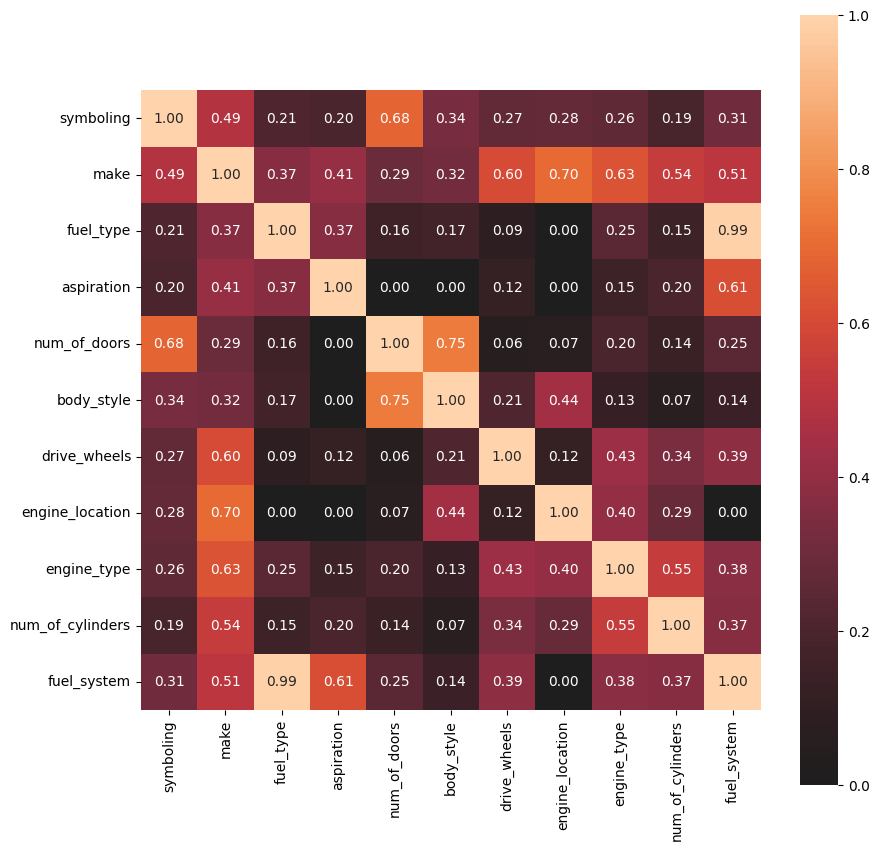

In [55]:
# Obtenemos la matriz de correlación entre las variables categoricas

selected_column= df_wins[categorical_features]
categorical_df = selected_column.copy()

categorical_correlation= associations(categorical_df, filename= 'categorical_correlation.png', figsize=(10,10))

Revisamos aquellas variables independientes categóricas que pueden llegar a generar problemas al encontrarse altamente correlacionadas entre sí (redundacia y complejidad innecesaria del modelo):
- make y engine_location 0.7
- fuel_type y fuel_system 0.99
- num_of_doors y body_style 0.75

### 4.3. Ingeniería de características

Vamos a eliminar y/o crear nuevas características que nos resulten útiles para la futura implementación de nuestros modelos

Las siguientes variables podemos considerarlas como altamente correlacionadas entre sí (correlación >= .7 o correlación <= -.7):

- city_mpg y highway_mpg: 0.97 (eliminamos city_mpg pues highway_mpg tiene una correlación ligeramente más alta con symboling)
- length y curb_weight: 0.88 (eliminamos curb_weight pues length tiene una correlación más alta con symboling)
- wheel_base y length: 0.88 (eliminamos length pues wheel_base tiene una correlación más alta con symboling)
- engine_size y horse_power: 0.84 (eliminamos engine_size pues horse_power tiene una correlación más alta con symboling)
- horse_power y highway_mpg: -0.83 (eliminamos horse_power pues highway_mpg tiene una correlación más alta con symboling)
- wheel_base y width: 0.8 (eliminamos width pues wheel_base tiene una correlación más alta con symboling)
- highway_mpg y price: -0.75 (eliminamos highway_mpg pues price tiene una correlación más alta con symboling)
- fuel_type y fuel_system 0.99 (eliminamos fuel_type pues fuel_system tiene una correlación más alta con symboling)
- num_of_doors y body_style: 0.75 (eliminamos body_style pues num_of_doors tiene una correlación más alta con symboling)
- make y engine_location: 0.7 (eliminamos engine_location pues make tiene una correlación más alta con symboling)


Puede resultar útil eliminar las variables que no se encuentren muy correlacionadas con symboling.
- stroke
- fuel_type
- aspiration
- drive_wheels
- num_of_cylinders
- compression_ratio

In [56]:
print(correlation_ratio(categories=df_wins['symboling'],measurements=df_wins['city_mpg']))
print(correlation_ratio(categories=df_wins['symboling'],measurements=df_wins['highway_mpg']))

0.46538645039461946
0.4699342904579409


In [57]:
# Creamos un Transformer personalizado para realizar la eliminación de variables
# a partir de sus correlaciones
class Remove_highly_correlated_features(BaseEstimator, TransformerMixin):
    def __init__(self,elims):
        self.elims = elims
        
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        result = result.drop(columns=self.elims)
        return result

In [58]:
cols = ['city_mpg', 'curb_weight', 'length', 'engine_size', 'horse_power', 'wheel_base',
        'highway_mpg', 'fuel_type', 'body_style', 'engine_location', 'stroke', 'fuel_type',
        'aspiration', 'drive_wheels', 'num_of_cylinders', 'compression_ratio']

df_elims = Remove_highly_correlated_features(cols).fit_transform(df_wins)
df_elims

,symboling,normalized_losses,make,num_of_doors,width,height,engine_type,fuel_system,bore,peak_rpm,price
0,3,122.0,alfa-romero,two,64.1,48.8,dohc,mpfi,3.47,5000.0,13495.0
1,3,122.0,alfa-romero,two,64.1,48.8,dohc,mpfi,3.47,5000.0,16500.0
2,1,122.0,alfa-romero,two,65.5,52.4,ohcv,mpfi,2.68,5000.0,16500.0
3,2,164.0,audi,four,66.2,54.3,ohc,mpfi,3.19,5500.0,13950.0
4,2,164.0,audi,four,66.4,54.3,ohc,mpfi,3.19,5500.0,17450.0
...,...,...,...,...,...,...,...,...,...,...,...
200,-1,95.0,volvo,four,68.9,55.5,ohc,mpfi,3.78,5400.0,16845.0
201,-1,95.0,volvo,four,68.8,55.5,ohc,mpfi,3.78,5300.0,19045.0
202,-1,95.0,volvo,four,68.9,55.5,ohcv,mpfi,3.58,5500.0,20970.0
203,-1,95.0,volvo,four,68.9,55.5,ohc,idi,3.01,4800.0,20970.0


In [59]:
# Creamos un Transformer personalizado para dummificar las variables categóricas
class Dummify(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        result = pd.get_dummies(result,columns=result.select_dtypes('object').drop(columns=['symboling']).columns,dtype=float)
        return result

In [60]:
df_elims_dummified = Dummify().fit_transform(df_elims)
df_elims_dummified

,symboling,normalized_losses,width,height,bore,peak_rpm,price,make_alfa-romero,make_audi,make_bmw,...,engine_type_ohcv,engine_type_rotor,fuel_system_1bbl,fuel_system_2bbl,fuel_system_4bbl,fuel_system_idi,fuel_system_mfi,fuel_system_mpfi,fuel_system_spdi,fuel_system_spfi
0,3,122.0,64.1,48.8,3.47,5000.0,13495.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,3,122.0,64.1,48.8,3.47,5000.0,16500.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,1,122.0,65.5,52.4,2.68,5000.0,16500.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,2,164.0,66.2,54.3,3.19,5500.0,13950.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,2,164.0,66.4,54.3,3.19,5500.0,17450.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,-1,95.0,68.9,55.5,3.78,5400.0,16845.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
201,-1,95.0,68.8,55.5,3.78,5300.0,19045.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
202,-1,95.0,68.9,55.5,3.58,5500.0,20970.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
203,-1,95.0,68.9,55.5,3.01,4800.0,20970.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


Teniendo en cuenta que uno de los hallazgos importantes fue la alta correlación existente entre las variables independientes podemos aplicar PCA para reducir dimensiones y utilizar variables nuevas con mucha mayor información. 

Estandarizamos primero, pues de no hacerlo, al PCA basarse en distancias, se tendrán las variables nuevas fuertemente influenciadas por las variables originales de mayor escala.

In [61]:
# Usamos el estarizador
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_wins.select_dtypes('number'))
df_scaled = pd.DataFrame(df_scaled, columns=df_wins.select_dtypes('number').columns)
df_scaled.head()

,normalized_losses,wheel_base,length,width,height,curb_weight,engine_size,bore,stroke,compression_ratio,horse_power,peak_rpm,city_mpg,highway_mpg,price
0,0.024650,-1.723449,-0.429422,-0.862961,-2.020417,-0.014566,0.168271,0.519089,-1.873794,-0.004803,0.227283,-0.259197,-0.651753,-0.552555,0.293074
1,0.024650,-1.723449,-0.429422,-0.862961,-2.020417,-0.014566,0.168271,0.519089,-1.873794,-0.004803,0.227283,-0.259197,-0.651753,-0.552555,0.896099
2,0.024650,-0.717702,-0.233724,-0.182923,-0.543527,0.514882,0.826470,-2.404862,0.778047,-0.004803,1.441904,-0.259197,-0.962834,-0.702985,0.896099
3,1.449036,0.185766,0.206597,0.157096,0.235942,-0.420797,-0.460010,-0.517248,0.500989,1.583398,-0.026940,0.825166,-0.185131,-0.101265,0.384380
4,1.449036,0.117580,0.206597,0.254244,0.235942,0.516807,0.347780,-0.517248,0.500989,-1.593005,0.340271,0.825166,-1.118374,-1.304705,1.086740


- Creamos el objeto PCA
- Entrenamos y transformamos los datos originales
- Los guardamos en un nuevo dataframe proyectado

In [62]:
from sklearn.decomposition import PCA

pca = PCA()
df_projected = pca.fit_transform(df_scaled)

Vemos el dataset proyectado en las nuevas dimensiones

In [63]:
df_projected

array([[-0.47523997,  1.9889527 ,  1.45927989, ..., -0.42453898,
         0.18348662, -0.0474134 ],
       [-0.28187959,  2.02005266,  1.44876398, ..., -0.51439001,
         0.15137844, -0.06830243],
       [ 0.74614122,  1.36986255, -1.13516377, ...,  0.4510103 ,
        -0.09341143,  0.23215797],
       ...,
       [ 3.82777166, -0.34178461,  1.88945332, ..., -0.50708354,
        -0.60540652, -0.03381351],
       [ 2.36321353, -2.20594257, -1.0664633 , ..., -0.048213  ,
         0.00410226, -0.25376634],
       [ 3.39550344, -1.10682144,  1.00286614, ..., -0.29518091,
        -0.21182589,  0.12558573]])

Observamos cada uno de los componentes principales resultantes del proceso

In [64]:
pca.components_

array([[ 0.04742065,  0.27939188,  0.32387831,  0.31993487,  0.10244232,
         0.34777231,  0.31596239,  0.25850861,  0.06143403, -0.1088397 ,
         0.30571533, -0.06971099, -0.309715  , -0.31883424,  0.32065038],
       [ 0.38136489, -0.31578218, -0.19239965, -0.10238452, -0.49184049,
        -0.06267844,  0.03553099, -0.04998004, -0.02732091, -0.2774916 ,
         0.26996301,  0.44678535, -0.2545273 , -0.20014237,  0.05157319],
       [-0.34619851, -0.06395164, -0.01085262, -0.13813481,  0.23704161,
        -0.0692889 , -0.14782207,  0.23604745, -0.77705285, -0.18958801,
         0.02933138,  0.15658352, -0.16577594, -0.15930816, -0.01743858],
       [ 0.35850411, -0.05246697, -0.00143342,  0.07216506, -0.18504103,
         0.06639956,  0.11608796,  0.15825936, -0.43723241,  0.71727994,
         0.02028868, -0.00448661,  0.12311763,  0.12819879,  0.22057496],
       [ 0.29783661,  0.28414817,  0.18502331,  0.1158226 ,  0.42089615,
        -0.01456243, -0.27546939, -0.4214223 , 

Obtenemos la varianza explicada de cada uno de los componentes principales (nos damos cuenta que los primeros componentes tienen mayor varianza explicada)

In [65]:
pca.explained_variance_

array([7.68149036, 2.25415704, 1.13818392, 1.05105318, 0.84117867,
       0.68194353, 0.38437695, 0.3110076 , 0.22974486, 0.15273693,
       0.1175497 , 0.08902482, 0.06112657, 0.05560775, 0.02434752])

Miramos ahora el ratio de la varianza explicada

In [66]:
var_exp=pca.explained_variance_ratio_
cum_var_exp = np.cumsum(var_exp) 
var_exp

array([0.50960131, 0.14954408, 0.07550879, 0.06972841, 0.05580502,
       0.04524113, 0.02550013, 0.0206327 , 0.01524161, 0.01013279,
       0.00779842, 0.00590604, 0.00405523, 0.0036891 , 0.00161525])

Diagramamos con el objetivo de identificar los componentes principales necesarios, aquellos que en conjunto nos expliquen un porcentaje considerable de la varianza (80%-95%)

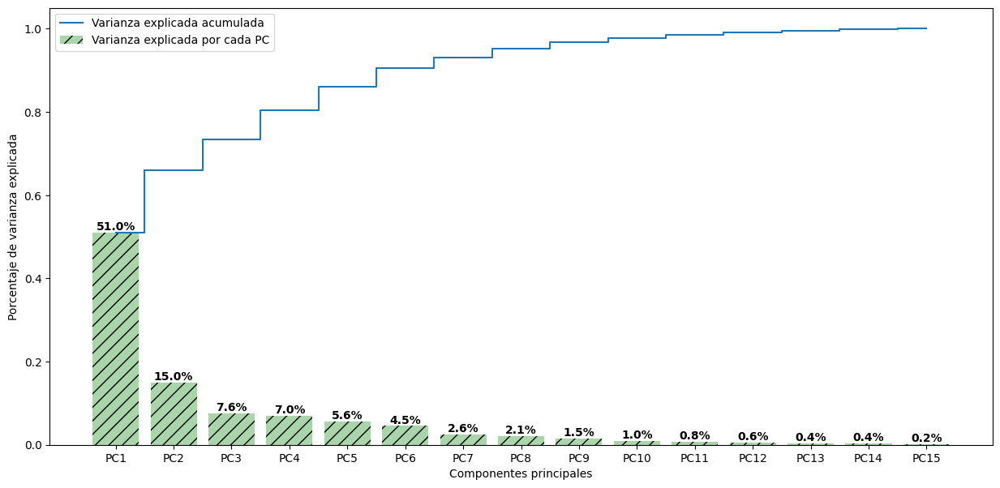

In [67]:
labels = ['PC' + str(x) for x in range(1, len(var_exp)+1)]
plt.figure(figsize=(15, 7))
bars = plt.bar(range(len(var_exp)), var_exp, alpha=0.3333, align='center', label='Varianza explicada por cada PC', 
         tick_label=labels, color = 'g',hatch='//')
plt.step(range(len(cum_var_exp)), cum_var_exp, where='mid',label='Varianza explicada acumulada')
plt.ylabel('Porcentaje de varianza explicada')
plt.xlabel('Componentes principales')
plt.legend(loc='best')
for i, bar in enumerate(bars):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
            f'{round(var_exp[i]*100,1)}%', ha='center', va='bottom', color='black', fontweight='bold')
plt.show()

Encontramos que entre los primeros 4 componentes principales tenemos el 80.4% de la información


In [68]:
np.sum(pca.explained_variance_ratio_[0:4])

0.8043825818968988

Ahora utilizamos los 4 primeros componentes, obteniendo un dataframe con las nuevas variables. En este caso particular, como nuestro objetivo es la predicción, no vamos a caracterizar las nuevas variables (esto sería útil si quisiésemos interpretar los resultados utilizando las variables generadas por el PCA)



In [69]:
pca = PCA(n_components=4)
pca_ = pca.fit_transform(df_scaled)
pca_df = pd.DataFrame(pca_, columns=['pc1','pc2','pc3','pc4'],index=df.index)
print('\nFinal PCA:')
pca_df


Final PCA:


,pc1,pc2,pc3,pc4
0,-0.475240,1.988953,1.459280,1.247357
1,-0.281880,2.020053,1.448764,1.380369
2,0.746141,1.369863,-1.135164,-0.440481
3,-0.157883,0.353497,-1.027438,1.275371
4,1.791381,1.830193,-0.273714,-0.943185
...,...,...,...,...
200,2.719845,-1.384918,0.856942,0.832067
201,3.798033,-0.513748,1.263083,-0.080124
202,3.827772,-0.341785,1.889453,0.521756
203,2.363214,-2.205943,-1.066463,0.787768


In [70]:
# Creamos un Transformer personalizado para realizar PCA sobre las variables numéricas
# Para dummificar las variables categóricas
class PCA_transformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        cols = ['fuel_type', 'body_style', 'engine_location', 'stroke', 'fuel_type',
        'aspiration', 'drive_wheels', 'num_of_cylinders', 'compression_ratio']
        result = Remove_highly_correlated_features(cols).fit_transform(result)
        df_scaled = scaler.fit_transform(result.select_dtypes('number'))
        df_scaled = pd.DataFrame(df_scaled, columns=result.select_dtypes('number').columns)
        pca = PCA(n_components=4)
        pca_ = pca.fit_transform(df_scaled)
        pca_df = pd.DataFrame(pca_, columns=['pc1','pc2','pc3','pc4'],index=df.index)
        for col in result.select_dtypes('object'):
            pca_df[col] = result[col] 
        pca_df = pd.get_dummies(pca_df,columns=pca_df.select_dtypes('object').drop(columns=['symboling']).columns,dtype=float)
        return pca_df

In [71]:
df_pca = PCA_transformer().fit_transform(df_wins)
df_pca

,pc1,pc2,pc3,pc4,symboling,make_alfa-romero,make_audi,make_bmw,make_chevrolet,make_dodge,...,engine_type_ohcv,engine_type_rotor,fuel_system_1bbl,fuel_system_2bbl,fuel_system_4bbl,fuel_system_idi,fuel_system_mfi,fuel_system_mpfi,fuel_system_spdi,fuel_system_spfi
0,-0.377808,1.984535,-1.166495,-1.527644,3,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.181801,2.035860,-1.182354,-1.469452,3,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.686723,1.449480,0.088724,0.089686,1,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,-0.020876,0.864047,0.541647,1.551515,2,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,1.588468,1.513463,0.689855,1.209698,2,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,2.869378,-1.116479,0.905190,-0.270702,-1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
201,3.810497,-0.574027,0.983086,-0.635433,-1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
202,3.924921,-0.362276,1.262553,-0.305992,-1,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
203,2.536407,-1.691106,0.425550,1.002207,-1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


Hacemos uso de un pipeline para dejar listos nuestros dataframes que posteriormente utilizaremos para entrenar nuestros modelos

In [72]:
from sklearn.pipeline import Pipeline

elims = ['city_mpg', 'curb_weight', 'length', 'engine_size', 'horse_power', 'wheel_base',
        'highway_mpg', 'fuel_type', 'body_style', 'engine_location', 'stroke', 'fuel_type',
        'aspiration', 'drive_wheels', 'num_of_cylinders', 'compression_ratio']

pipe_rem = Pipeline(steps = [('format target variable',Format_target()),
                   ('format features',Format_variables()),
                   ('impute null values',Imputer(cont,cat)),
                   ('winsorize values',Winsorizer(wins_dict,cont_vars)),
                   ('Remove highly correlated features',Remove_highly_correlated_features(elims)),
                   ('Dummify categorical variables',Dummify())])

pipe_pca_rem = Pipeline(steps = [('format target variable',Format_target()),
                   ('format features',Format_variables()),
                   ('impute null values',Imputer(cont,cat)),
                   ('winsorize values',Winsorizer(wins_dict,cont_vars)),
                   ('PCA',PCA_transformer())])


df_pipeline_rem = pipe_rem.fit_transform(df)
df_pipeline_pca_rem = pipe_pca_rem.fit_transform(df)

In [73]:
# Construimos una función que nos permite obetener el X y el y para el dataframe de carros

def obtain_X_y(df):
    return df.drop(columns=['symboling']),df[['symboling']]

### 5. Protocolos de evaluación

In [74]:
# Utilizamos el holdout con un 30% para la prueba y 70% para el entrenamiento
from sklearn.model_selection import train_test_split

X = dict()
y = dict()
X_train = dict()
y_train = dict()
X_test = dict()
y_test = dict()

# Particionamos los datos para nuestra primer versión
X['rem'], y['rem'] = obtain_X_y(df_pipeline_rem)

X_train['rem'], X_test['rem'], y_train['rem'], y_test['rem'] = train_test_split(X['rem'],y['rem'],random_state=1234,test_size=0.3)
print(X_train['rem'].shape)
print(X_test['rem'].shape)
print(y_train['rem'].shape)
print(y_test['rem'].shape)

(143, 45)
(62, 45)
(143, 1)
(62, 1)


In [75]:
# Particionamos los datos para nuestra segunda versión
X['pca_rem'], y['pca_rem'] = obtain_X_y(df_pipeline_pca_rem)

X_train['pca_rem'], X_test['pca_rem'], y_train['pca_rem'], y_test['pca_rem'] = train_test_split(X['pca_rem'],y['pca_rem'],random_state=1234,test_size=0.3)
print(X_train['pca_rem'].shape)
print(X_test['pca_rem'].shape)
print(y_train['pca_rem'].shape)
print(y_test['pca_rem'].shape)

(143, 43)
(62, 43)
(143, 1)
(62, 1)


### 6. Métricas de evaluación

Implementamos una función que nos permita calcular las métricas de regresión para el conjunto de entrenamiento y de prueba (Accuracy, Kappa, Precision, Recall)

Nos retornará el modelo entrenado y un diccionario con las principales métricas sobre el conjunto de entrenamiento y el de prueba
- Accuracy = (TP + TN) / (TP + FP + FN + TN)
- Kappa = (OA - AC) / (1 - AC)
- Precision = TP / (TP + FP) (valor positivo predicho, la proporción correcta de identificaciones positivas)
- Recall = TP / (TP + FN) (la proporción de positivos que fueron identificados correctamente)

In [76]:
from sklearn.metrics import accuracy_score, cohen_kappa_score, precision_score, recall_score

def classification_metrics(model,X_train,X_test,y_train,y_test):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    acc_train = accuracy_score(y_train, y_pred_train)
    acc_test = accuracy_score(y_test, y_pred_test)
    kappa_train = cohen_kappa_score(y_train, y_pred_train)
    kappa_test = cohen_kappa_score(y_test, y_pred_test)
    prec_train = precision_score(y_train, y_pred_train,average=None,labels=['-1','0','1','2','3'])
    prec_test = precision_score(y_test, y_pred_test,average=None,labels=['-1','0','1','2','3'])
    recall_train = recall_score(y_train, y_pred_train,average=None,labels=['-1','0','1','2','3'])
    recall_test = recall_score(y_test, y_pred_test,average=None,labels=['-1','0','1','2','3'])   
    metrics = {"Training Accuracy": acc_train,
               "Test Accuracy": acc_test,
               "Training Kappa": kappa_train,
               "Test Kappa": kappa_test,
               "Training Precision": prec_train,
               "Test Precision": prec_test,
               "Training recall": recall_train,
               "Test recall": recall_test    
               }
    for item in metrics.items():
        print(item[0],"=",item[1])
    return model,metrics
    
def kappa_metrics(model,X_train,X_test,y_train,y_test):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    kappa_train = cohen_kappa_score(y_train, y_pred_train)
    kappa_test = cohen_kappa_score(y_test, y_pred_test)
    return kappa_train, kappa_test

### Baseline a partir del dummy classifier

Establecemos la línea base a partir de un dummy classifier que utiliza como estrategia la moda (ya que estamos trabajando con una tarea de clasificación)

In [77]:
from sklearn.dummy import DummyClassifier

classification_metrics(DummyClassifier(strategy='most_frequent'),X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

Training Accuracy = 0.3076923076923077
Test Accuracy = 0.3709677419354839
Training Kappa = 0.0
Test Kappa = 0.0
Training Precision = [0.         0.30769231 0.         0.         0.        ]
Test Precision = [0.         0.37096774 0.         0.         0.        ]
Training recall = [0. 1. 0. 0. 0.]
Test recall = [0. 1. 0. 0. 0.]


(DummyClassifier(strategy='most_frequent'),
 {'Training Accuracy': 0.3076923076923077,
  'Test Accuracy': 0.3709677419354839,
  'Training Kappa': 0.0,
  'Test Kappa': 0.0,
  'Training Precision': array([0.        , 0.30769231, 0.        , 0.        , 0.        ]),
  'Test Precision': array([0.        , 0.37096774, 0.        , 0.        , 0.        ]),
  'Training recall': array([0., 1., 0., 0., 0.]),
  'Test recall': array([0., 1., 0., 0., 0.])})

Training Accuracy = 30%, Test Accuracy = 37%

### Reporte de métricas y matriz de confusión

Vamos a definir una función para dibujar la matriz de confusión y el reporte de clasificación en donde podemos obtener las métricas de entrenamiento y prueba

In [78]:
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.linear_model import LogisticRegression

import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Matriz de confusión',
                          cmap=plt.cm.Blues):

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Real')
    plt.xlabel('Predicción')

def report_and_conf_matrix(model,X_train,X_test,y_train,y_test):
    md = model.fit(X_train,y_train)
    y_pred_train = md.predict(X_train)
    y_pred_test = md.predict(X_test)
    cnf_matrix1 = confusion_matrix(y_train, y_pred_train)
    cnf_matrix2 = confusion_matrix(y_test, y_pred_test)
    np.set_printoptions(precision=2)
    plt.figure()
    plot_confusion_matrix(cnf_matrix1, classes=["-1","0","1","2","3"],
                      title='Matriz de confusión Entrenamiento')
    print("Reporte Entrenamiento")  
    print(classification_report(y_train, y_pred_train, target_names=["-1","0","1","2","3"]))
    plt.show()
    plt.figure()
    plot_confusion_matrix(cnf_matrix2, classes=["-1","0","1","2","3"],
                      title='Matriz de confusión Prueba')
    print("Reporte Prueba")  
    print(classification_report(y_test, y_pred_test, target_names=["-1","0","1","2","3"]))
    plt.show()



### Área bajo la curva ROC

Vamos a utilizar el área bajo la curva ROC para evaluar nuestro modelo también. Con esta gráfica vamos a poder visualizar el desempeño del modelo entre la sensibilidad (recall - true positive rate) y la especificidad (true negative rate 1 - FPR), de manera que podamos establecer un balance entre ambos.
- La curva ROC hace un plot entre el TPR y el FPR
- Recall es la habilidad para identificar correctamente las observaciones que son positivas
- Especificidad es la habilidad para indentificar correctamente las observaciones que son negativas
- AUC ROC nos permite identificar que tan bien nuestro modelo puede distinguir entre las clases. 

Al tener nosotros un problema multi - clase utilizaremos una metodología uno vs el resto. Se tendrán tantas curvas como clases. Yellowbrick es muy útil y simple para esto

- Utilizando las curvas individuales podemos ver que tan bien nuestro modelo trabaja para cada una de las categorías 

- La curva micro-average ROC agrega todas las instancias sobre todas las clases y nos brinda una sola curva para todas las predicciones (afectada por la moda).

- La curva macro-average ROC trata clase de manera independiente y nos presenta una curva ROC que es el promedio de los valores para cada clase (cada clase tiene la misma importancia).

In [79]:
from yellowbrick.classifier import ROCAUC

def plot_ROC_curve(model, X_train, y_train, X_test, y_test):
    visualizer = ROCAUC(model, encoder={'-1': 'riesgo negativo',
                                        '0': 'neutral', 
                                        '1': 'riesgo 1', 
                                        '2': 'riesgo 2',
                                        '3': 'riesgo 3'})                                    
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test, y_test)
    visualizer.show()
    
    return visualizer

Podemos observar el funcionamiento de la curva ROC y el área bajo ella utilizando uno de los modelos más sencillos para abordar tareas de clasificación, la regresión logística.

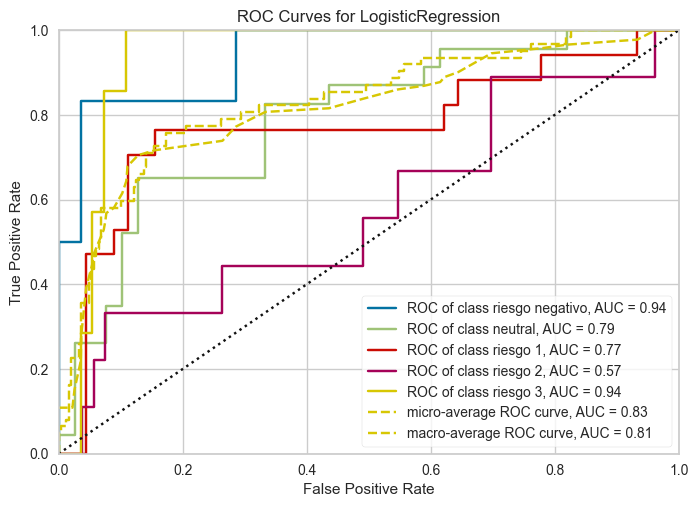

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=LogisticRegression(random_state=1234))

In [80]:
plot_ROC_curve(LogisticRegression(random_state=1234), X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

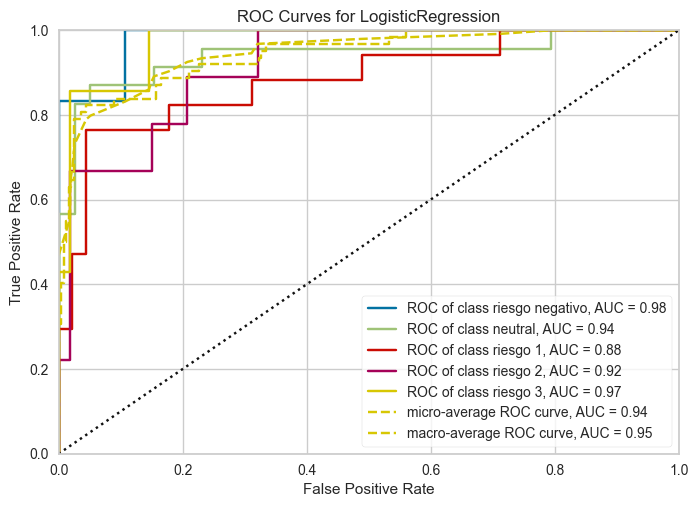

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=LogisticRegression(random_state=1234))

In [81]:
plot_ROC_curve(LogisticRegression(random_state=1234), X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

Se puede observar que el conjunto de datos al que se le ha realizado el PCA presenta mucho mejor desempeño. Más adelante ahondaremos más en esto.

### 7. Implementación de modelos

#### 7.1. Modelo de Regresión Logística

Trabajamos sobre el conjunto de datos con eliminación de variables altamente correlacionadas entre sí.

In [82]:
from sklearn.linear_model import LogisticRegression

classification_metrics(LogisticRegression(random_state=1234),X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

Training Accuracy = 0.5384615384615384
Test Accuracy = 0.6129032258064516
Training Kappa = 0.38212765957446815
Test Kappa = 0.4758717858400846
Training Precision = [0.75       0.50769231 0.55555556 0.         0.4       ]
Test Precision = [0.55555556 0.69565217 0.61904762 0.         0.5       ]
Training recall = [0.78947368 0.75       0.67567568 0.         0.2       ]
Test recall = [0.83333333 0.69565217 0.76470588 0.         0.57142857]


(LogisticRegression(random_state=1234),
 {'Training Accuracy': 0.5384615384615384,
  'Test Accuracy': 0.6129032258064516,
  'Training Kappa': 0.38212765957446815,
  'Test Kappa': 0.4758717858400846,
  'Training Precision': array([0.75      , 0.50769231, 0.55555556, 0.        , 0.4       ]),
  'Test Precision': array([0.55555556, 0.69565217, 0.61904762, 0.        , 0.5       ]),
  'Training recall': array([0.78947368, 0.75      , 0.67567568, 0.        , 0.2       ]),
  'Test recall': array([0.83333333, 0.69565217, 0.76470588, 0.        , 0.57142857])})

In [83]:
# Guardamos el mejor modelo con regresión logística

import pickle
from sklearn.linear_model import LogisticRegressionCV

model,metrics = classification_metrics(LogisticRegressionCV(cv=5,random_state=1234),
                                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open('models/logisticRegressionRem.pkl', 'wb'))
pickle.dump(metrics, open('metrics/logisticRegressionRemMetrics.pkl', 'wb'))

Training Accuracy = 0.6363636363636364
Test Accuracy = 0.6612903225806451
Training Kappa = 0.5158223727047793
Test Kappa = 0.5371489512975471
Training Precision = [0.88235294 0.6        0.59574468 0.66666667 0.625     ]
Test Precision = [0.8        0.65384615 0.66666667 0.66666667 0.6       ]
Training recall = [0.78947368 0.81818182 0.75675676 0.08695652 0.5       ]
Test recall = [0.66666667 0.73913043 0.70588235 0.22222222 0.85714286]


Dentro del contexto en el que nos encontramos trabajando, sería bueno entender que tipo de errores desearíamos que nuestro modelo evitara.

Teniendo en cuenta que actuamos como una compañía aseguradora y queremos predecir el riesgo, quizás sería más importante al tomar como positiva la categoría más riesgosa, predecir que no es riesgosa y que sí lo sea (FN), es decir un recall más alto. Por otro lado al tomar como positiva la categoría menos riesgosa y predecir que no es riesgosa y que sí lo sea es un problema (FP), es decir una precision más alta.

In [84]:
# Los hiperparámetros del mejor modelo de regresión logística

model.get_params()

{'Cs': 10,
 'class_weight': None,
 'cv': 5,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1.0,
 'l1_ratios': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 1234,
 'refit': True,
 'scoring': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0}

Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       0.88      0.79      0.83        19
           0       0.60      0.82      0.69        44
           1       0.60      0.76      0.67        37
           2       0.67      0.09      0.15        23
           3       0.62      0.50      0.56        20

    accuracy                           0.64       143
   macro avg       0.67      0.59      0.58       143
weighted avg       0.65      0.64      0.60       143



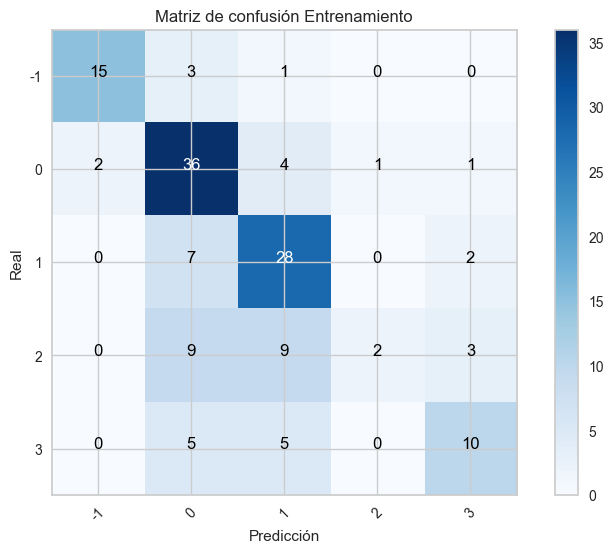

Reporte Prueba
              precision    recall  f1-score   support

          -1       0.80      0.67      0.73         6
           0       0.65      0.74      0.69        23
           1       0.67      0.71      0.69        17
           2       0.67      0.22      0.33         9
           3       0.60      0.86      0.71         7

    accuracy                           0.66        62
   macro avg       0.68      0.64      0.63        62
weighted avg       0.67      0.66      0.64        62



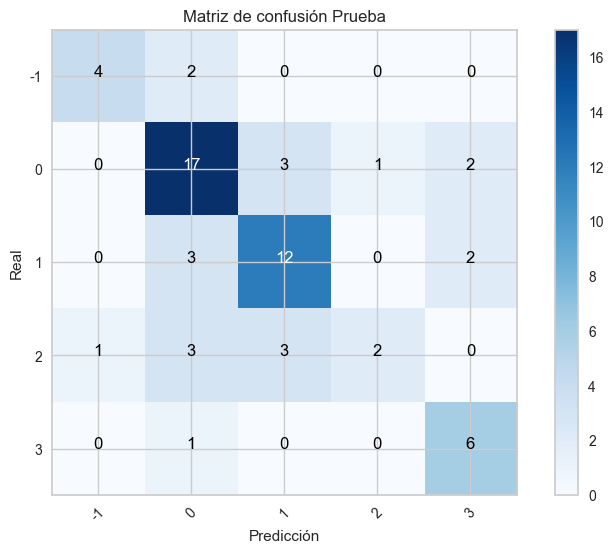

In [85]:
report_and_conf_matrix(LogisticRegressionCV(cv=5,random_state=1234),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

Obtenemos el reporte y la matriz de confusión para nuestro mejor modelo de regresión logística con todas las variables.

Con base en el reporte de entrenamiento podemos observar dos métricas importantes
- Precision (para ver si tenemos un nivel alto de correctitud para la clase positiva). Una mayor precision disminuye los falsos positivos (en este caso desearíamos mayor precisión sobre las categorías de menos riesgo)
- Recall (para ver qué porcentaje de las muestras puede el modelo identificar que pertenecen a la clase positiva). Un mayor recall indica que los falsos negativos disminuyen (en este caso desearíamos mayor sensibilidad sobre las categorías de mayor riesgo)

La exactitud para la prueba de nuestro modelo es del 68%, mucho mejor que el presentado en el baseline que era del 37%

La precisión para la clase menos riesgosa es de 80% 

La sensibilidad para la clase más riesgosa de 86% 

Ambas parecen adecuadas teniendo en cuenta el contexto del problema.

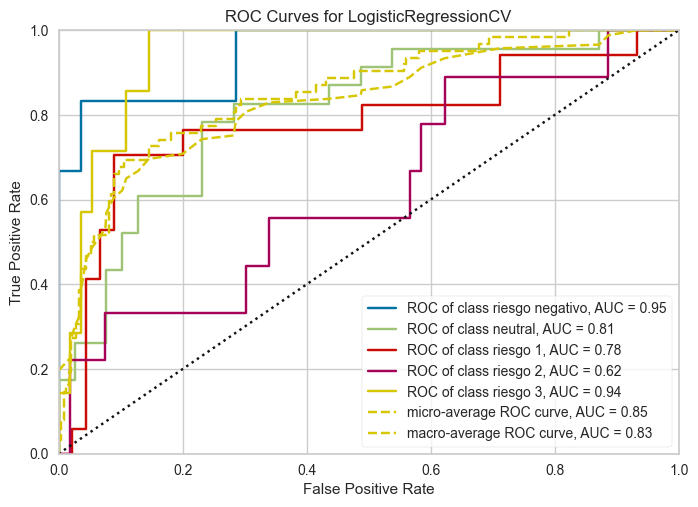

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=LogisticRegressionCV(cv=5, random_state=1234))

In [86]:
plot_ROC_curve(LogisticRegressionCV(cv=5,random_state=1234), 
               X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

- La curva micro-average arroja un valor adecuado de 0.85
- La curva macro-average arroja un valor adecuado de 0.83
- Aunque el modelo parece funcionar bien para las clases riesgo negativo y y riesgo 3, definitivamente no es tan correcto con la clase riesgo 2.

Aunque previamente, en la etapa de ingeniería de características habíamos creado nuevas variables y eliminado otras, en esta etapa verificaremos la importancia de las variables independientes con respecto a la objetivo utilizando distintos métodos. 

Esto con el fin de hallar el mejor grupo de variables que sirvan como insumo para nuestros modelos.

### Selección de características

En este caso hacemos uso de SelectKBest que nos permite seleccionar las k mejores variables independientes teniendo en cuenta el f_classif. Construimos una función que a partir del conjunto de entrenamiento y el de prueba nos retorna los conjuntos ya transformados

In [87]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
 
def select_features(X_train, y_train, X_test,n):
  fs = SelectKBest(score_func=f_classif, k=n)
  fs.fit(X_train, y_train)
  X_train_fs = fs.transform(X_train)
  X_test_fs = fs.transform(X_test)
  return X_train_fs, X_test_fs, fs

Revizamos la importancia de las variables en el conjunto de datos sin PCA

Feature 0: 13.059685
Feature 1: 9.652925
Feature 2: 22.128343
Feature 3: 10.859672
Feature 4: 5.898422
Feature 5: 9.566837
Feature 6: 2.041529
Feature 7: 1.700965
Feature 8: 1.130566
Feature 9: 0.359573
Feature 10: 3.943776
Feature 11: 1.221865
Feature 12: 0.359573
Feature 13: 1.137363
Feature 14: 1.500598
Feature 15: 3.671659
Feature 16: 0.710373
Feature 17: 3.083776
Feature 18: 1.244508
Feature 19: 4.518711
Feature 20: 1.267953
Feature 21: 3.575756
Feature 22: 1.315957
Feature 23: 2.000539
Feature 24: 2.680789
Feature 25: 1.031179
Feature 26: 2.651453
Feature 27: 17.451049
Feature 28: 30.453541
Feature 29: 30.453541
Feature 30: 1.903952
Feature 31: 0.710373
Feature 32: 3.577423
Feature 33: 5.875808
Feature 34: 1.930243
Feature 35: 0.749465
Feature 36: 5.236734
Feature 37: 0.918074
Feature 38: 8.584388
Feature 39: 5.236734
Feature 40: 2.289798
Feature 41: nan
Feature 42: 3.671771
Feature 43: 5.043049
Feature 44: 1.315957


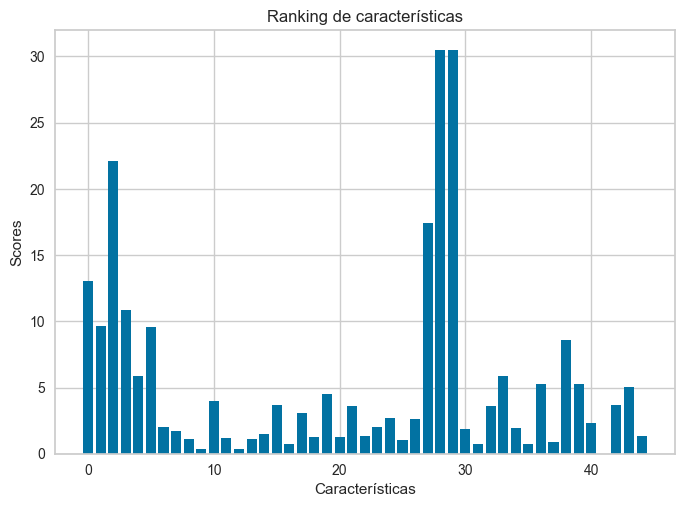

In [88]:
# Haciendo uso de los conjuntos ya transformados podemos ver el score de cada variable
# En este caso utilizamos todas las variables

n = X_train['rem'].shape[1]

X_train['rem_fs'], X_test['rem_fs'], fs = select_features(X_train['rem'], y_train['rem'], X_test['rem'],n)

for i in range(len(fs.scores_)):
    print('Feature %d: %f' % (i, fs.scores_[i]))

fig, ax = plt.subplots()
ax.bar([i for i in range(len(fs.scores_))], fs.scores_)
ax.set(title='Ranking de características',xlabel='Características',ylabel='Scores')
plt.show()

Index(['bore', 'price', 'width', 'normalized_losses', 'height'], dtype='object')


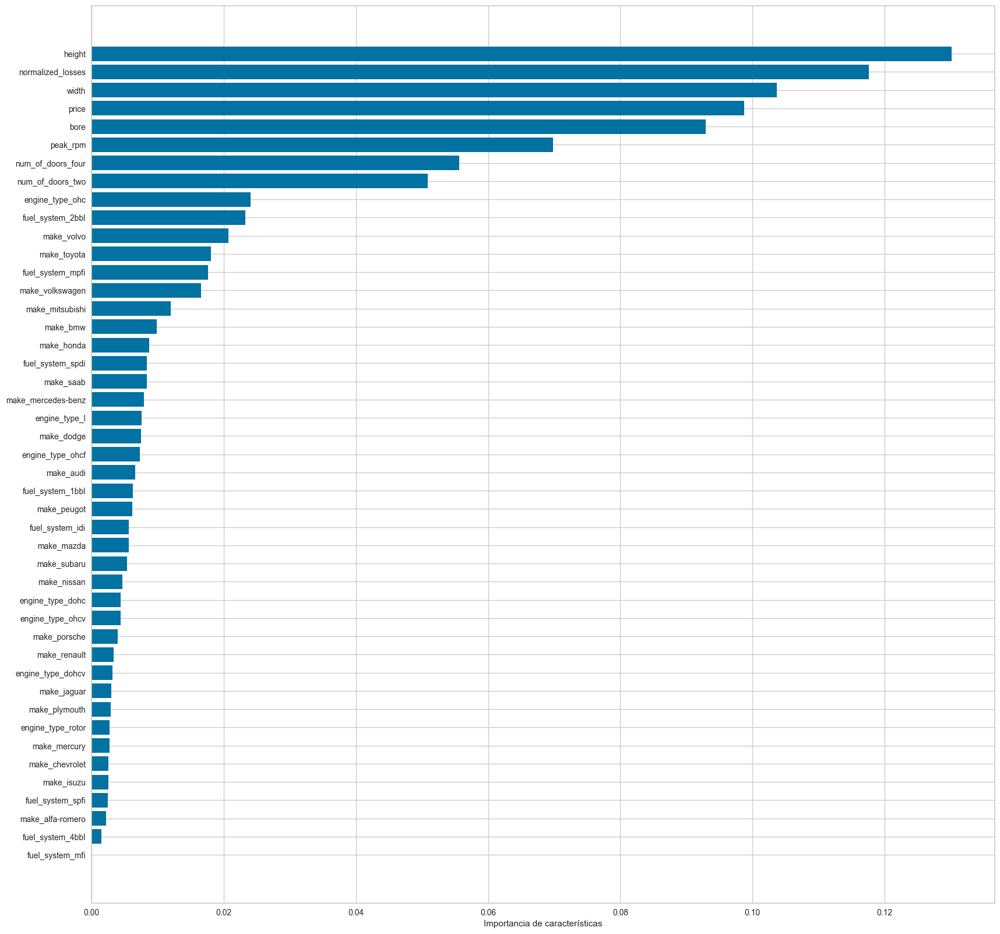

In [89]:
# Haciendo uso de un modelo de Random Forest Classifier hacemos un ranking de características
# Ordenamos y graficamos

from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance

rf = RandomForestClassifier(n_estimators=150,random_state=1234)
rf.fit(X_train['rem'], y_train['rem'])
sort = rf.feature_importances_.argsort()
plt.figure(figsize=(20,20))
plt.barh(df_pipeline_rem.columns[1:][sort], rf.feature_importances_[sort])
plt.xlabel("Importancia de características")
l = len(df_pipeline_rem.columns[1:])
importants = df_pipeline_rem.columns[1:][sort][-5:]
print(importants)


Revisamos el ranking de variables para el conjunto de datos con PCA

Index(['num_of_doors_four', 'pc4', 'symboling', 'pc2', 'pc3'], dtype='object')


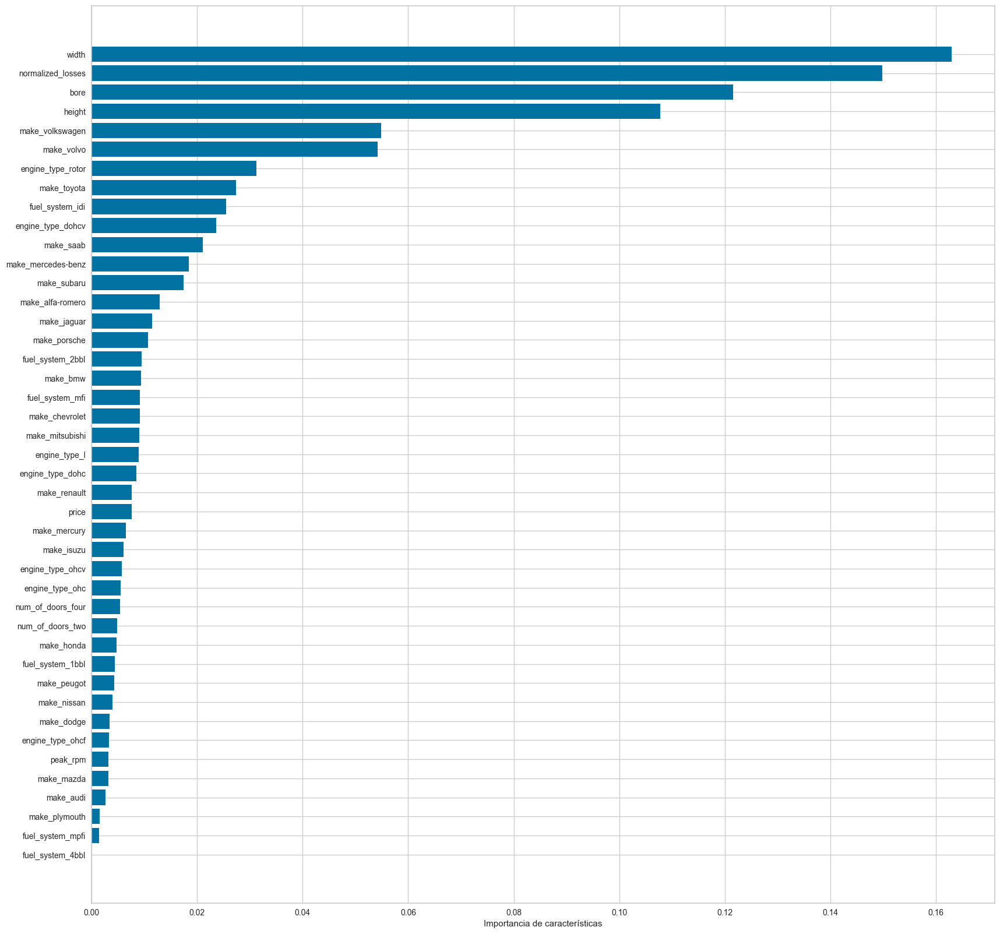

In [90]:
rf = RandomForestClassifier(n_estimators=150,random_state=1234)
rf.fit(X_train['pca_rem'], y_train['pca_rem'])
sort = rf.feature_importances_.argsort()
plt.figure(figsize=(20,20))
plt.barh(df_pipeline_rem.columns[1:][sort], rf.feature_importances_[sort])
plt.xlabel("Importancia de características")
l = len(df_pipeline_pca_rem.columns[1:])
importants = df_pipeline_pca_rem.columns[1:][sort][-5:]
print(importants)

Revisamos la cantidad de variables a seleccionar para el conjunto de datos sin PCA

(0.870020964360587, 31)


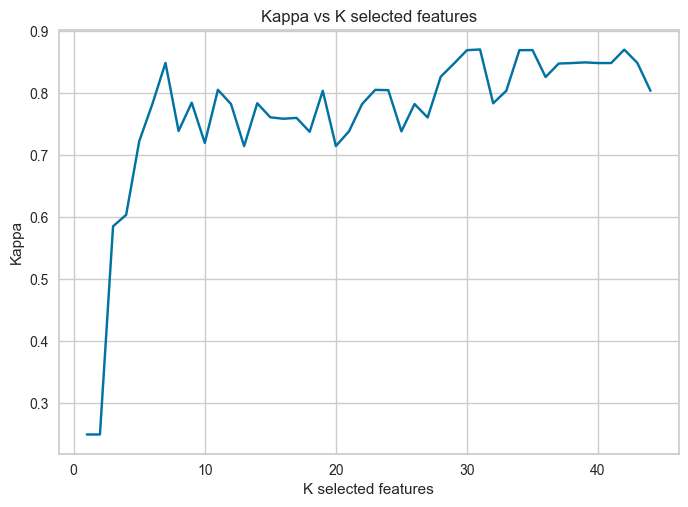

In [91]:
from sklearn.pipeline import make_pipeline

n = X_train['rem'].shape[1]
results = [kappa_metrics(make_pipeline(SelectKBest(score_func=f_classif, k=i),
                                                 StandardScaler(),
                                                 RandomForestClassifier(n_estimators=150,random_state=1234)),
            X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])[1] for i in range(1,n)]
ax = sns.lineplot(x=range(1,n),
             y=results)
ax.set(title="Kappa vs K selected features",ylabel='Kappa',xlabel='K selected features')
kvals = [(col,i) for col,i in zip(results,range(1,n))]

print(sorted(kvals, key=lambda x: x[0],reverse=True)[0])

Cantidad de variables a seleccionar para conjunto de datos sin PCA k = 31

Revisamos la cantidad de variables a seleccionar del conjunto de datos con PCA

(0.7820738137082601, 27)


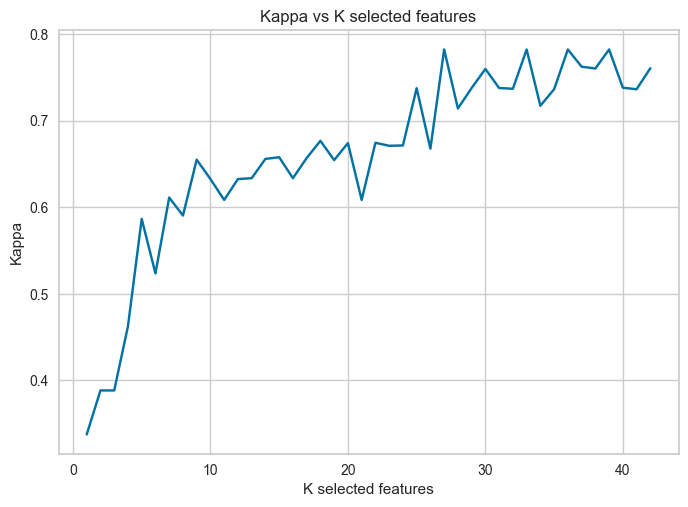

In [92]:
n = X_train['pca_rem'].shape[1]
results = [kappa_metrics(make_pipeline(SelectKBest(score_func=f_classif, k=i),
                                                 StandardScaler(),
                                                 RandomForestClassifier(n_estimators=150,random_state=1234)),
            X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])[1] for i in range(1,n)]
ax = sns.lineplot(x=range(1,n),
             y=results)
ax.set(title="Kappa vs K selected features",ylabel='Kappa',xlabel='K selected features')
kvals = [(col,i) for col,i in zip(results,range(1,n))]

print(sorted(kvals, key=lambda x: x[0],reverse=True)[0])

Cantidad de variables a seleccionar para conjunto de datos con PCA k = 27

In [93]:
# Modelo de regresión logística utilizando datos sin PCA y feature selection de 31 variables

model,metrics = classification_metrics(make_pipeline(SelectKBest(score_func=f_classif, k=31),
                                                 LogisticRegressionCV(cv=5,random_state=1234)),
                                   X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open('models/logisticRegressionRemFS.pkl', 'wb'))
pickle.dump(metrics, open('metrics/logisticRegressionRemFSMetrics.pkl', 'wb'))

Training Accuracy = 0.6433566433566433
Test Accuracy = 0.6774193548387096
Training Kappa = 0.5247931191763863
Test Kappa = 0.553314121037464
Training Precision = [0.88 0.59 0.61 0.75 0.69]
Test Precision = [1.   0.66 0.71 1.   0.5 ]
Training recall = [0.74 0.82 0.76 0.13 0.55]
Test recall = [0.67 0.83 0.71 0.22 0.71]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       0.88      0.74      0.80        19
           0       0.59      0.82      0.69        44
           1       0.61      0.76      0.67        37
           2       0.75      0.13      0.22        23
           3       0.69      0.55      0.61        20

    accuracy                           0.64       143
   macro avg       0.70      0.60      0.60       143
weighted avg       0.67      0.64      0.61       143



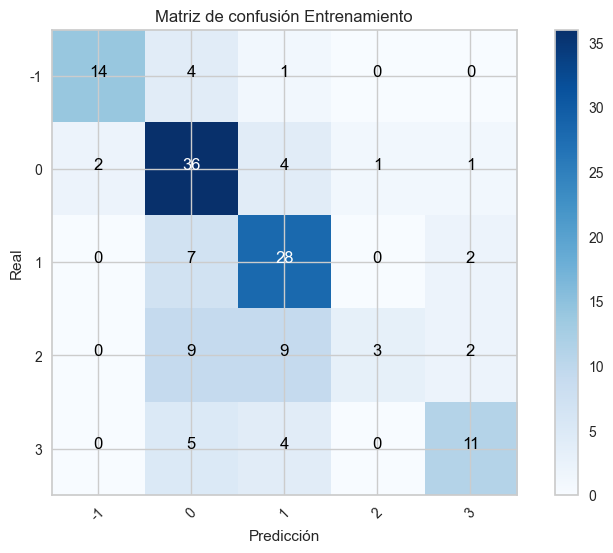

Reporte Prueba
              precision    recall  f1-score   support

          -1       1.00      0.67      0.80         6
           0       0.66      0.83      0.73        23
           1       0.71      0.71      0.71        17
           2       1.00      0.22      0.36         9
           3       0.50      0.71      0.59         7

    accuracy                           0.68        62
   macro avg       0.77      0.63      0.64        62
weighted avg       0.73      0.68      0.66        62



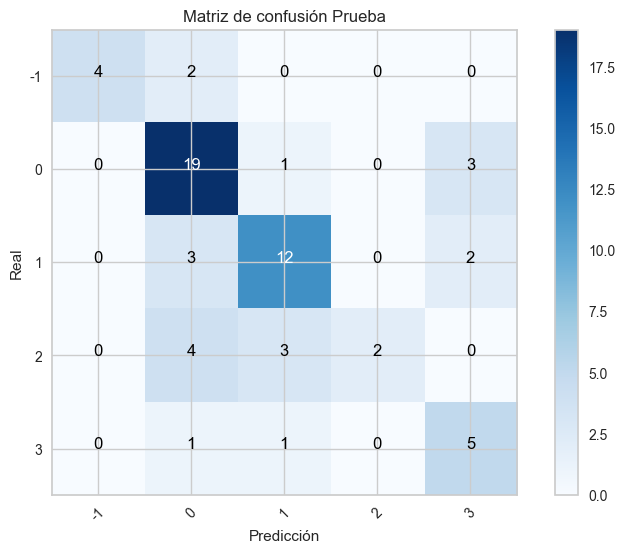

In [94]:
pipeline_lr = make_pipeline(SelectKBest(score_func=f_classif, k=31),
                                                 LogisticRegressionCV(cv=5,random_state=1234))
report_and_conf_matrix(pipeline_lr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

La exactitud para la prueba de nuestro modelo es del 66%

La precisión para la clase menos riesgosa es de 80% 

La sensibilidad para la clase más riesgosa de 71% 

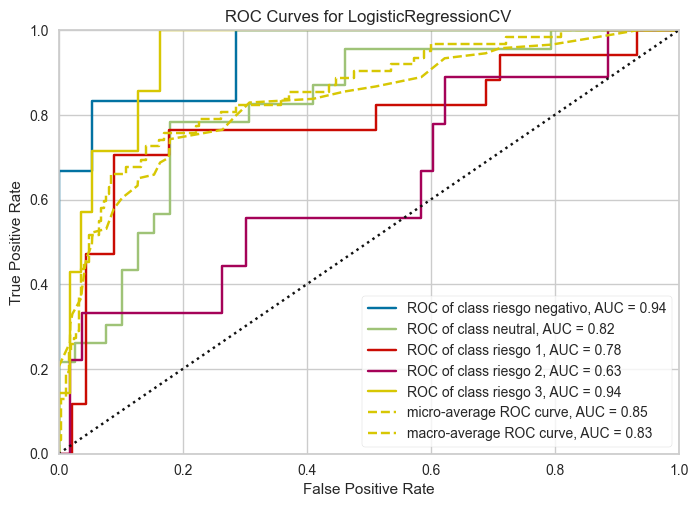

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=31)),
                                 ('logisticregressioncv',
                                  LogisticRegressionCV(cv=5,
                                                       random_state=1234))]))

In [95]:
pipeline_lr = make_pipeline(SelectKBest(score_func=f_classif, k=31),
                                                 LogisticRegressionCV(cv=5,random_state=1234))
plot_ROC_curve(pipeline_lr, X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

- La curva micro-average arroja un valor adecuado de 0.85
- La curva macro-average arroja un valor adecuado de 0.82
- Aunque el modelo parece funcionar bien para las clases riesgo negativo y y riesgo 3, definitivamente no es tan correcto con la clase riesgo 2.

Modelo de regresión logistica sobre conjunto de datos con PCA

In [96]:
model,metrics = classification_metrics(LogisticRegressionCV(cv=5,random_state=1234),
                                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open('models/logisticRegressionPCARem.pkl', 'wb'))
pickle.dump(metrics, open('metrics/logisticRegressionPCARemMetrics.pkl', 'wb'))

Training Accuracy = 0.8951048951048951
Test Accuracy = 0.8064516129032258
Training Kappa = 0.8642834546029737
Test Kappa = 0.7428275146906325
Training Precision = [0.94 0.91 0.86 0.83 0.95]
Test Precision = [0.71 0.91 0.87 0.55 0.86]
Training recall = [0.89 0.95 0.86 0.83 0.9 ]
Test recall = [0.83 0.87 0.76 0.67 0.86]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       0.94      0.89      0.92        19
           0       0.91      0.95      0.93        44
           1       0.86      0.86      0.86        37
           2       0.83      0.83      0.83        23
           3       0.95      0.90      0.92        20

    accuracy                           0.90       143
   macro avg       0.90      0.89      0.89       143
weighted avg       0.90      0.90      0.90       143



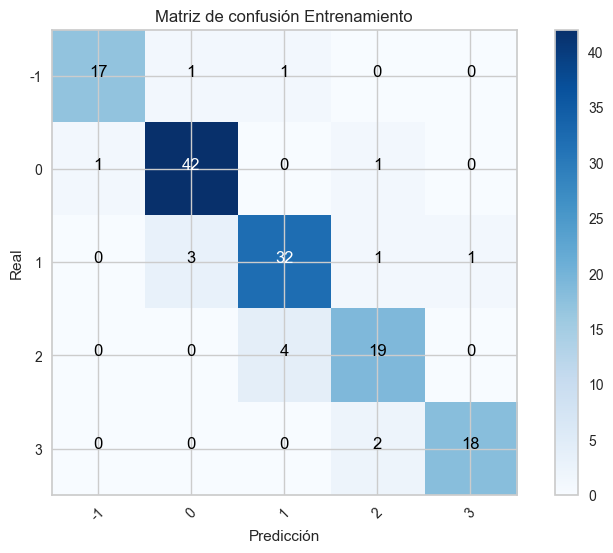

Reporte Prueba
              precision    recall  f1-score   support

          -1       0.71      0.83      0.77         6
           0       0.91      0.87      0.89        23
           1       0.87      0.76      0.81        17
           2       0.55      0.67      0.60         9
           3       0.86      0.86      0.86         7

    accuracy                           0.81        62
   macro avg       0.78      0.80      0.79        62
weighted avg       0.82      0.81      0.81        62



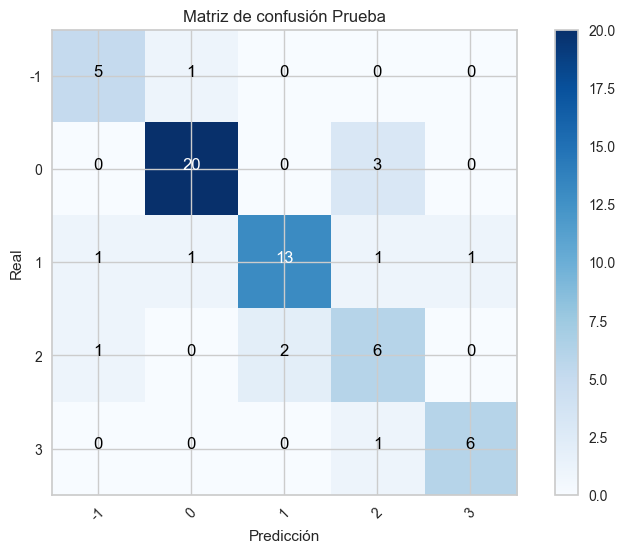

In [97]:
report_and_conf_matrix(LogisticRegressionCV(cv=5,random_state=1234),
                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

La exactitud para la prueba de nuestro modelo es del 81%

La precisión para la clase menos riesgosa es de 71% 

La sensibilidad para la clase más riesgosa de 86% 

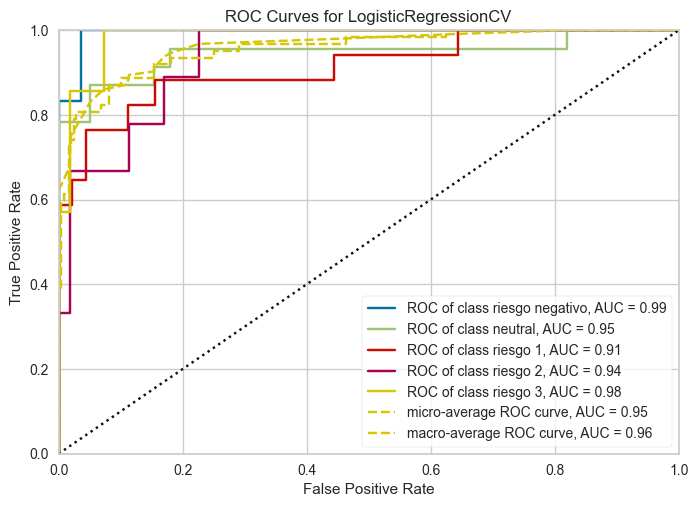

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=LogisticRegressionCV(cv=5, random_state=1234))

In [98]:
plot_ROC_curve(LogisticRegressionCV(cv=5,random_state=1234), 
               X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

- La curva micro-average arroja un valor muy bueno de 0.95
- La curva macro-average arroja un valor muy bueno de 0.96

Modelo de Regresión logística sobre conjunto de datos con PCA y feature selection

In [99]:
# Modelo de regresión logística utilizando datos con PCA y feature selection de 27 variables

model,metrics = classification_metrics(make_pipeline(SelectKBest(score_func=f_classif, k=27),
                                                 LogisticRegressionCV(cv=5,random_state=1234)),
                                   X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open('models/logisticRegressionPCARemFS.pkl', 'wb'))
pickle.dump(metrics, open('metrics/logisticRegressionPCARemFSMetrics.pkl', 'wb'))

Training Accuracy = 0.8181818181818182
Test Accuracy = 0.7580645161290323
Training Kappa = 0.7649067341131837
Test Kappa = 0.6723044397463003
Training Precision = [0.94 0.82 0.74 0.82 0.85]
Test Precision = [0.83 0.75 0.82 0.6  0.86]
Training recall = [0.89 0.84 0.76 0.78 0.85]
Test recall = [0.83 0.91 0.53 0.67 0.86]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       0.94      0.89      0.92        19
           0       0.82      0.84      0.83        44
           1       0.74      0.76      0.75        37
           2       0.82      0.78      0.80        23
           3       0.85      0.85      0.85        20

    accuracy                           0.82       143
   macro avg       0.83      0.83      0.83       143
weighted avg       0.82      0.82      0.82       143



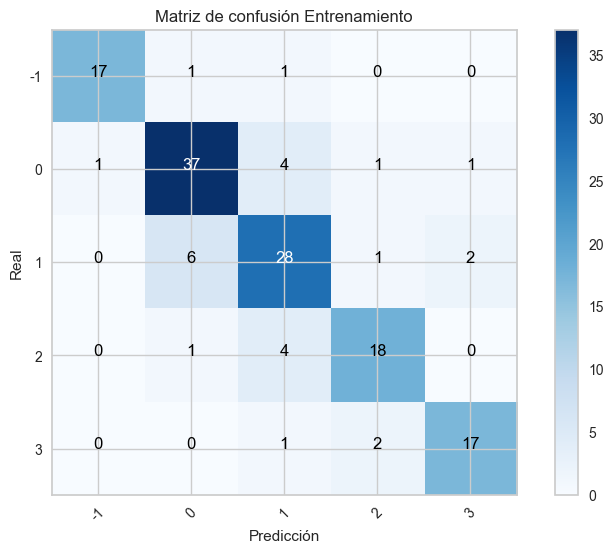

Reporte Prueba
              precision    recall  f1-score   support

          -1       0.83      0.83      0.83         6
           0       0.75      0.91      0.82        23
           1       0.82      0.53      0.64        17
           2       0.60      0.67      0.63         9
           3       0.86      0.86      0.86         7

    accuracy                           0.76        62
   macro avg       0.77      0.76      0.76        62
weighted avg       0.77      0.76      0.75        62



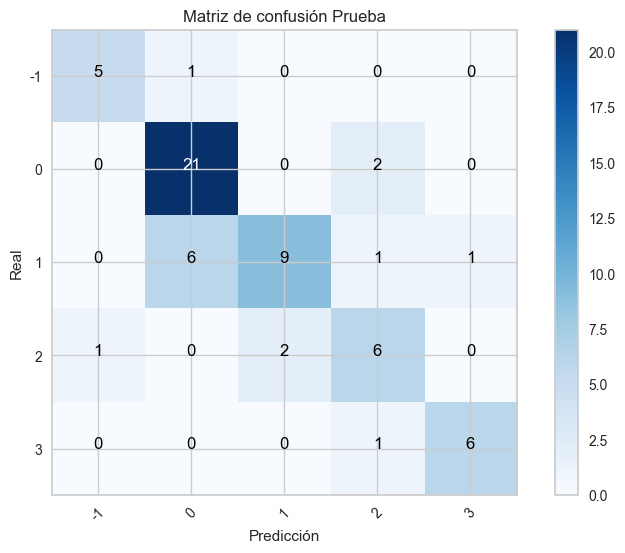

In [100]:
pipeline_lr = make_pipeline(SelectKBest(score_func=f_classif,k=27),
                            LogisticRegressionCV(cv=5,random_state=1234))
report_and_conf_matrix(pipeline_lr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

La exactitud para la prueba de nuestro modelo es del 76%

La precisión para la clase menos riesgosa es de 83% 

La sensibilidad para la clase más riesgosa de 86%

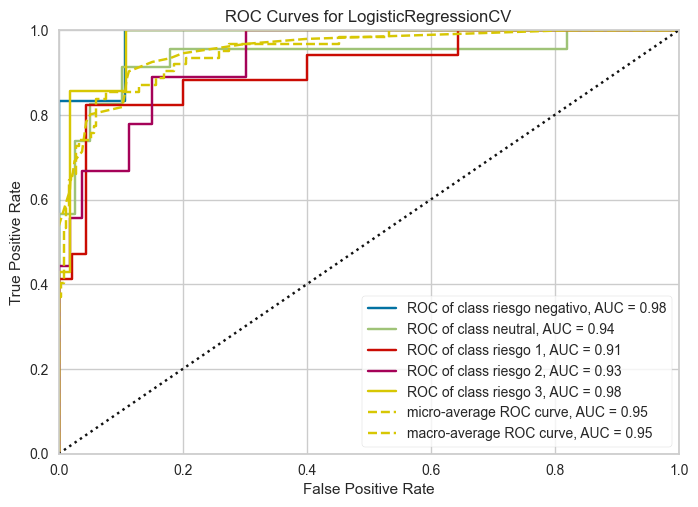

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=27)),
                                 ('logisticregressioncv',
                                  LogisticRegressionCV(cv=5,
                                                       random_state=1234))]))

In [101]:
pipeline_lr = make_pipeline(SelectKBest(score_func=f_classif,k=27),
                            LogisticRegressionCV(cv=5,random_state=1234))
plot_ROC_curve(pipeline_lr,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

- La curva micro-average arroja un valor muy bueno de 0.95
- La curva macro-average arroja un valor muy bueno de 0.95

### 7.3. Modelo de K vecinos más cercanos

Para este modelo tan solamente incluimos las variables continuas, pues es un método basado en distancias. No tienen sentido utilizar las variables categóricas dummificadas

In [102]:
# Escalamos y estandarizamos para ver los resultados del modelo

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import KNeighborsClassifier

print('Stadardization')
knnReg_st = make_pipeline(StandardScaler(),KNeighborsClassifier())
cols = ['normalized_losses', 'width', 'height', 'bore', 'peak_rpm', 'price']
classification_metrics(knnReg_st,X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])
print()
print('Normalization')
knnReg_norm = make_pipeline(MinMaxScaler(),KNeighborsClassifier())
classification_metrics(knnReg_norm,X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])

Stadardization
Training Accuracy = 0.6993006993006993
Test Accuracy = 0.6290322580645161
Training Kappa = 0.605959628324255
Test Kappa = 0.4885222381635581
Training Precision = [0.75 0.67 0.62 0.8  0.87]
Test Precision = [0.5  0.66 0.69 0.33 0.67]
Training recall = [0.79 0.82 0.65 0.52 0.65]
Test recall = [0.67 0.83 0.65 0.11 0.57]

Normalization
Training Accuracy = 0.6993006993006993
Test Accuracy = 0.6290322580645161
Training Kappa = 0.605225988700565
Test Kappa = 0.48556998556998554
Training Precision = [0.68 0.66 0.66 0.8  0.92]
Test Precision = [0.5  0.67 0.69 0.33 0.6 ]
Training recall = [0.79 0.84 0.68 0.52 0.55]
Test recall = [0.67 0.87 0.65 0.11 0.43]


(Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                 ('kneighborsclassifier', KNeighborsClassifier())]),
 {'Training Accuracy': 0.6993006993006993,
  'Test Accuracy': 0.6290322580645161,
  'Training Kappa': 0.605225988700565,
  'Test Kappa': 0.48556998556998554,
  'Training Precision': array([0.68, 0.66, 0.66, 0.8 , 0.92]),
  'Test Precision': array([0.5 , 0.67, 0.69, 0.33, 0.6 ]),
  'Training recall': array([0.79, 0.84, 0.68, 0.52, 0.55]),
  'Test recall': array([0.67, 0.87, 0.65, 0.11, 0.43])})

In [103]:
# Podemos encontrar el mejor k para nuestro modelo
# Utilizamos un pipeline para incluir la normalización y el clasificador knn 

cols = ['normalized_losses', 'width', 'height', 'bore', 'peak_rpm', 'price']
for k in range(1,21,2):
    print('Results for k =',k)
    knnReg_st = make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=k))
    classification_metrics(knnReg_st,X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])
    print()

Results for k = 1
Training Accuracy = 0.993006993006993
Test Accuracy = 0.7258064516129032
Training Kappa = 0.9909762100082035
Test Kappa = 0.6237058193502321
Training Precision = [1.   0.98 1.   1.   1.  ]
Test Precision = [0.8  0.75 0.68 0.6  0.83]
Training recall = [1.   1.   0.97 1.   1.  ]
Test recall = [0.67 0.78 0.88 0.33 0.71]

Results for k = 3
Training Accuracy = 0.8251748251748252
Test Accuracy = 0.6451612903225806
Training Kappa = 0.7747321991178324
Test Kappa = 0.5258950295446646
Training Precision = [0.72 0.88 0.76 0.9  0.93]
Test Precision = [0.56 0.7  0.69 0.43 0.71]
Training recall = [0.95 0.82 0.84 0.83 0.7 ]
Test recall = [0.83 0.7  0.65 0.33 0.71]

Results for k = 5
Training Accuracy = 0.6993006993006993
Test Accuracy = 0.6290322580645161
Training Kappa = 0.605225988700565
Test Kappa = 0.48556998556998554
Training Precision = [0.68 0.66 0.66 0.8  0.92]
Test Precision = [0.5  0.67 0.69 0.33 0.6 ]
Training recall = [0.79 0.84 0.68 0.52 0.55]
Test recall = [0.67 0.87 0

(0.6237058193502321, 1)


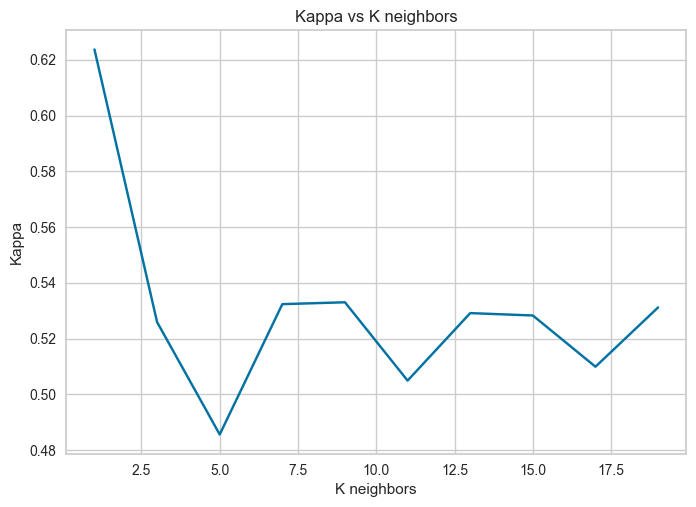

In [104]:
# Visualizamos el kappa
# Observamos la mejor respuesta con k=1

cols = ['normalized_losses', 'width', 'height', 'bore', 'peak_rpm', 'price']
knnReg_st = make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=k))
results = [kappa_metrics(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=i)),
            X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])[1] for i in range(1,21,2)]
ax = sns.lineplot(x=range(1,21,2),
             y=results)
ax.set(title="Kappa vs K neighbors",ylabel='Kappa',xlabel='K neighbors')
kvals = [(col,i) for col,i in zip(results,range(1,21,2))]

print(sorted(kvals, key=lambda x: x[0],reverse=True)[0])

In [105]:
# Guardamos el mejor modelo utilizando k=1 sin PCA

cols = ['normalized_losses', 'width', 'height', 'bore', 'peak_rpm', 'price']
model,metrics = classification_metrics(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=1)),
                                   X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])
pickle.dump(model, open('models/KnnClassifierRem.pkl','wb'))
pickle.dump(metrics, open('metrics/KnnClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.993006993006993
Test Accuracy = 0.7258064516129032
Training Kappa = 0.9909762100082035
Test Kappa = 0.6237058193502321
Training Precision = [1.   0.98 1.   1.   1.  ]
Test Precision = [0.8  0.75 0.68 0.6  0.83]
Training recall = [1.   1.   0.97 1.   1.  ]
Test recall = [0.67 0.78 0.88 0.33 0.71]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00        19
           0       0.98      1.00      0.99        44
           1       1.00      0.97      0.99        37
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        20

    accuracy                           0.99       143
   macro avg       1.00      0.99      1.00       143
weighted avg       0.99      0.99      0.99       143



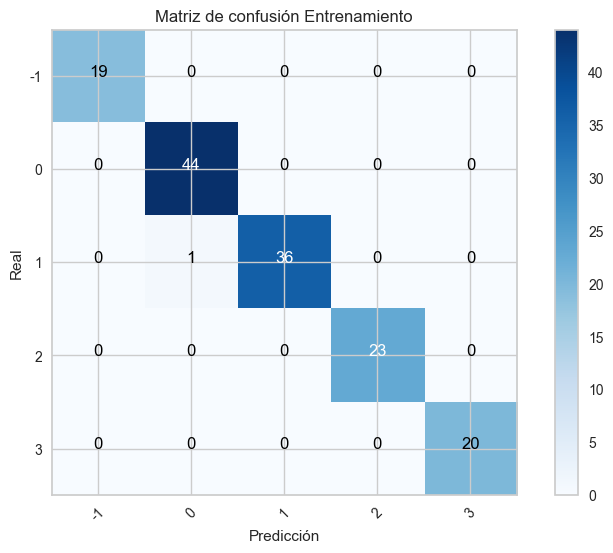

Reporte Prueba
              precision    recall  f1-score   support

          -1       0.80      0.67      0.73         6
           0       0.75      0.78      0.77        23
           1       0.68      0.88      0.77        17
           2       0.60      0.33      0.43         9
           3       0.83      0.71      0.77         7

    accuracy                           0.73        62
   macro avg       0.73      0.68      0.69        62
weighted avg       0.72      0.73      0.71        62



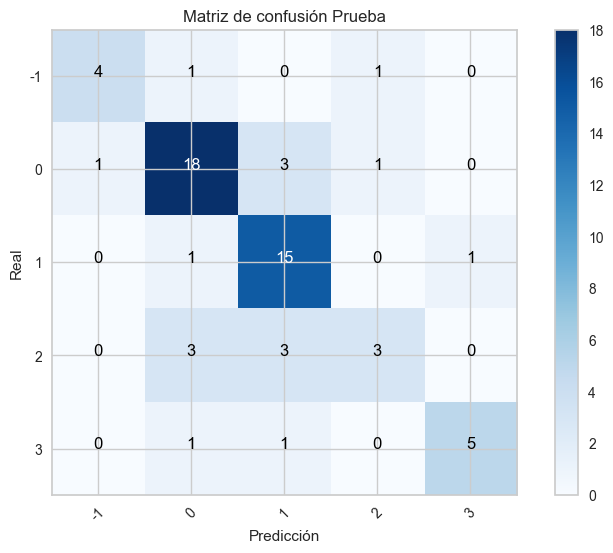

In [106]:
report_and_conf_matrix(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=1)),
                       X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])

La exactitud para la prueba de nuestro modelo es del 73%

La precisión para la clase menos riesgosa es de 80% 

La sensibilidad para la clase más riesgosa de 71%

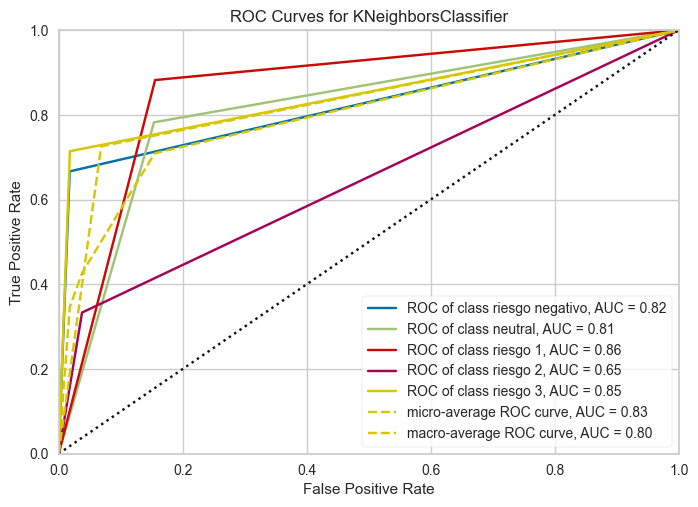

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for KNeighborsClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                                 ('kneighborsclassifier',
                                  KNeighborsClassifier(n_neighbors=1))]))

In [107]:
plot_ROC_curve(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=1)),
                X_train=X_train['rem'][cols], y_train=y_train['rem'],X_test=X_test['rem'][cols], y_test=y_test['rem'])

Obtenemos peores resultados que con la regresión logística, las AUC micro y macro son de 0.83 y 0.8 respectivamente. Aunque aceptables, peores que los obtenidos previamente

Ahora trabajamos con el dataset con PCA

In [108]:
# Podemos encontrar el mejor k para nuestro modelo
# Utilizamos un pipeline para incluir la normalización y el clasificador knn 

cols = ['pc1','pc2','pc3','pc4']
for k in range(1,21,2):
    print('Results for k =',k)
    knnReg_st = make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=k))
    classification_metrics(knnReg_st,X_train['pca_rem'][cols],X_test['pca_rem'][cols],y_train['pca_rem'],y_test['pca_rem'])
    print()

Results for k = 1
Training Accuracy = 1.0
Test Accuracy = 0.6935483870967742
Training Kappa = 1.0
Test Kappa = 0.5925285368384642
Training Precision = [1. 1. 1. 1. 1.]
Test Precision = [0.71 0.75 0.74 0.5  0.62]
Training recall = [1. 1. 1. 1. 1.]
Test recall = [0.83 0.65 0.82 0.44 0.71]

Results for k = 3
Training Accuracy = 0.8111888111888111
Test Accuracy = 0.6290322580645161
Training Kappa = 0.756710775047259
Test Kappa = 0.5096286107290233
Training Precision = [0.71 0.83 0.77 0.91 0.83]
Test Precision = [0.5  0.67 0.69 0.5  0.71]
Training recall = [0.79 0.8  0.81 0.91 0.75]
Test recall = [0.83 0.61 0.65 0.44 0.71]

Results for k = 5
Training Accuracy = 0.7202797202797203
Test Accuracy = 0.6129032258064516
Training Kappa = 0.636940653760711
Test Kappa = 0.47679324894514763
Training Precision = [0.71 0.72 0.69 0.7  0.82]
Test Precision = [0.5  0.68 0.65 0.33 0.57]
Training recall = [0.79 0.82 0.65 0.61 0.7 ]
Test recall = [0.83 0.74 0.65 0.11 0.57]

Results for k = 7
Training Accurac

(0.5925285368384642, 1)


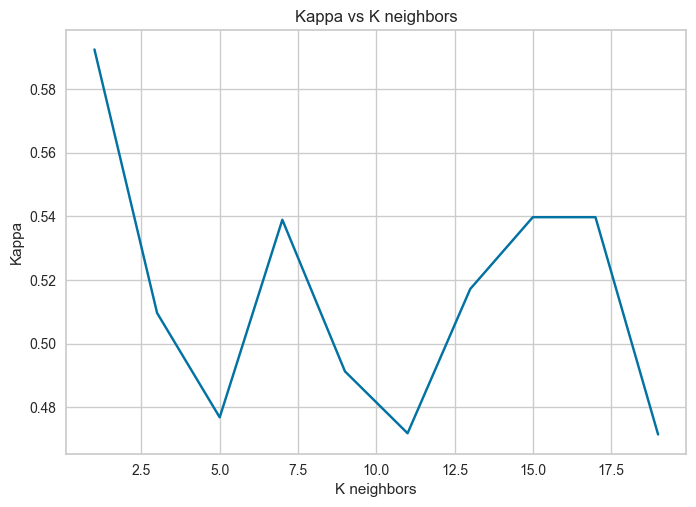

In [109]:
# Visualizamos el kappa
# Observamos la mejor respuesta con k=1

cols = ['pc1','pc2','pc3','pc4']
knnReg_st = make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=k))
results = [kappa_metrics(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=i)),
            X_train['pca_rem'][cols],X_test['pca_rem'][cols],y_train['pca_rem'],y_test['pca_rem'])[1] for i in range(1,21,2)]
ax = sns.lineplot(x=range(1,21,2),
             y=results)
ax.set(title="Kappa vs K neighbors",ylabel='Kappa',xlabel='K neighbors')
kvals = [(col,i) for col,i in zip(results,range(1,21,2))]

print(sorted(kvals, key=lambda x: x[0],reverse=True)[0])

In [110]:
# Guardamos el mejor modelo utilizando k=1 sin PCA

cols = ['pc1','pc2','pc3','pc4']
model,metrics = classification_metrics(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=1)),
                                   X_train['pca_rem'][cols],X_test['pca_rem'][cols],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open('models/KnnClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open('metrics/KnnClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 1.0
Test Accuracy = 0.6935483870967742
Training Kappa = 1.0
Test Kappa = 0.5925285368384642
Training Precision = [1. 1. 1. 1. 1.]
Test Precision = [0.71 0.75 0.74 0.5  0.62]
Training recall = [1. 1. 1. 1. 1.]
Test recall = [0.83 0.65 0.82 0.44 0.71]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00        19
           0       1.00      1.00      1.00        44
           1       1.00      1.00      1.00        37
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        20

    accuracy                           1.00       143
   macro avg       1.00      1.00      1.00       143
weighted avg       1.00      1.00      1.00       143



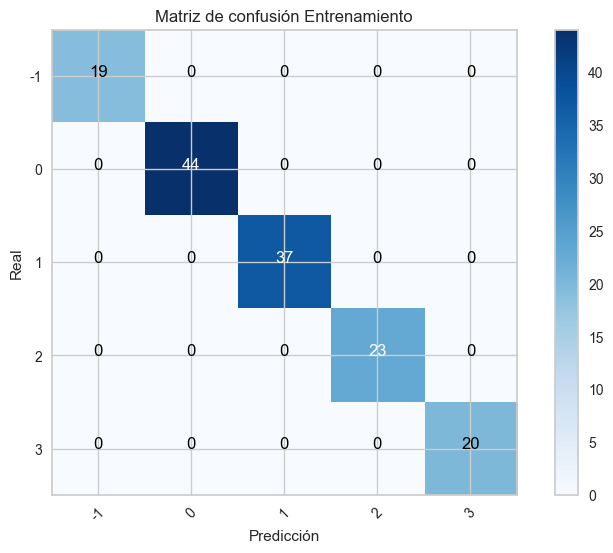

Reporte Prueba
              precision    recall  f1-score   support

          -1       0.71      0.83      0.77         6
           0       0.75      0.65      0.70        23
           1       0.74      0.82      0.78        17
           2       0.50      0.44      0.47         9
           3       0.62      0.71      0.67         7

    accuracy                           0.69        62
   macro avg       0.67      0.69      0.68        62
weighted avg       0.69      0.69      0.69        62



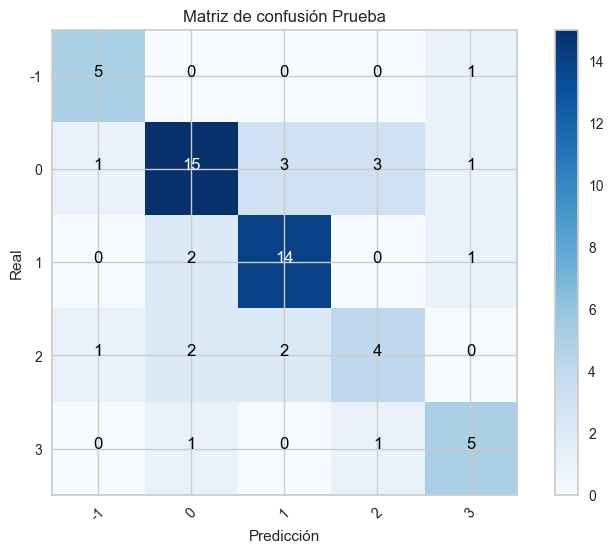

In [111]:
report_and_conf_matrix(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=1)),
                       X_train['pca_rem'][cols],X_test['pca_rem'][cols],y_train['pca_rem'],y_test['pca_rem'])

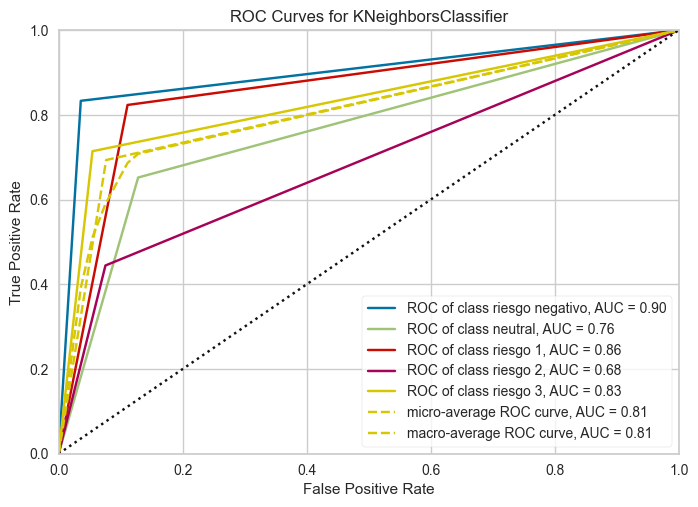

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for KNeighborsClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                                 ('kneighborsclassifier',
                                  KNeighborsClassifier(n_neighbors=1))]))

In [112]:
plot_ROC_curve(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=1)),
                X_train=X_train['pca_rem'][cols], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'][cols], y_test=y_test['pca_rem'])

### 7.4. Modelo Naïve Bayes

Utilizamos primero el conjunto de datos sin PCA

In [113]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV

classification_metrics(GaussianNB(),X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

Training Accuracy = 0.7202797202797203
Test Accuracy = 0.7419354838709677
Training Kappa = 0.6466518408697801
Test Kappa = 0.6639566395663956
Training Precision = [0.62 0.88 0.67 0.68 0.8 ]
Test Precision = [0.75 1.   0.71 0.5  0.62]
Training recall = [0.95 0.52 0.78 0.74 0.8 ]
Test recall = [1.   0.74 0.71 0.67 0.71]


(GaussianNB(),
 {'Training Accuracy': 0.7202797202797203,
  'Test Accuracy': 0.7419354838709677,
  'Training Kappa': 0.6466518408697801,
  'Test Kappa': 0.6639566395663956,
  'Training Precision': array([0.62, 0.88, 0.67, 0.68, 0.8 ]),
  'Test Precision': array([0.75, 1.  , 0.71, 0.5 , 0.62]),
  'Training recall': array([0.95, 0.52, 0.78, 0.74, 0.8 ]),
  'Test recall': array([1.  , 0.74, 0.71, 0.67, 0.71])})

In [114]:
nb_classifier = GaussianNB()

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=nb_classifier, 
                 param_grid=params_NB, 
                 cv=5, 
                 verbose=1, 
                 scoring='accuracy') 
gs_NB.fit(X_train['rem'], y_train['rem'])

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00e+00, 8.11e-01, 6.58e-01, 5.34e-01, 4.33e-01, 3.51e-01,
       2.85e-01, 2.31e-01, 1.87e-01, 1.52e-01, 1.23e-01, 1.00e-01,
       8.11e-02, 6.58e-02, 5.34e-02, 4.33e-02, 3.51e-02, 2.85e-02,
       2.31e-02, 1.87e-02, 1.52e-02, 1.23e-02, 1.00e-02, 8.11e-03,
       6.58e-03, 5.34e-03, 4.33e-03, 3.51e-03, 2.85e-03, 2.31e-03,
       1.87...
       3.51e-06, 2.85e-06, 2.31e-06, 1.87e-06, 1.52e-06, 1.23e-06,
       1.00e-06, 8.11e-07, 6.58e-07, 5.34e-07, 4.33e-07, 3.51e-07,
       2.85e-07, 2.31e-07, 1.87e-07, 1.52e-07, 1.23e-07, 1.00e-07,
       8.11e-08, 6.58e-08, 5.34e-08, 4.33e-08, 3.51e-08, 2.85e-08,
       2.31e-08, 1.87e-08, 1.52e-08, 1.23e-08, 1.00e-08, 8.11e-09,
       6.58e-09, 5.34e-09, 4.33e-09, 3.51e-09, 2.85e-09, 2.31e-09,
       1.87e-09, 1.52e-09, 1.23e-09, 1.00e-09])},
             scoring='accuracy', verbose=1)

In [115]:
# Mejores hiperparámetros

gs_NB.best_params_

{'var_smoothing': 1.232846739442066e-08}

In [116]:
gs_NB.best_score_

0.6504926108374385

In [117]:
# Guardamos el mejor modelo utilizando el dataset sin PCA

model,metrics = classification_metrics(GaussianNB(var_smoothing=1.232846739442066e-08),
                                   X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open('models/NBClassifierRem.pkl','wb'))
pickle.dump(metrics, open('metrics/NBClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.7132867132867133
Test Accuracy = 0.6774193548387096
Training Kappa = 0.6303744798890429
Test Kappa = 0.5823509599191647
Training Precision = [0.74 0.76 0.64 0.77 0.73]
Test Precision = [0.45 0.88 0.67 0.62 0.67]
Training recall = [0.89 0.66 0.81 0.43 0.8 ]
Test recall = [0.83 0.61 0.71 0.56 0.86]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       0.74      0.89      0.81        19
           0       0.76      0.66      0.71        44
           1       0.64      0.81      0.71        37
           2       0.77      0.43      0.56        23
           3       0.73      0.80      0.76        20

    accuracy                           0.71       143
   macro avg       0.73      0.72      0.71       143
weighted avg       0.72      0.71      0.71       143



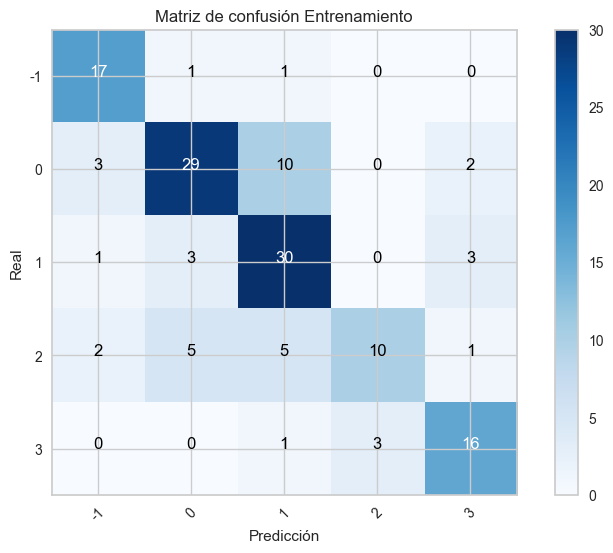

Reporte Prueba
              precision    recall  f1-score   support

          -1       0.45      0.83      0.59         6
           0       0.88      0.61      0.72        23
           1       0.67      0.71      0.69        17
           2       0.62      0.56      0.59         9
           3       0.67      0.86      0.75         7

    accuracy                           0.68        62
   macro avg       0.66      0.71      0.67        62
weighted avg       0.72      0.68      0.68        62



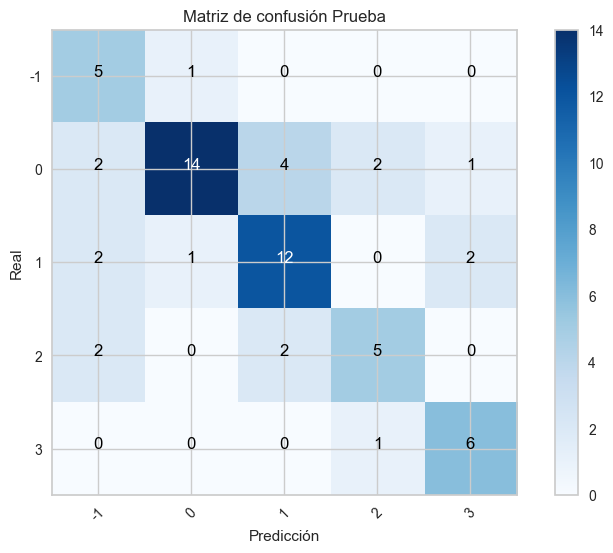

In [118]:
report_and_conf_matrix(GaussianNB(var_smoothing=1.232846739442066e-08),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

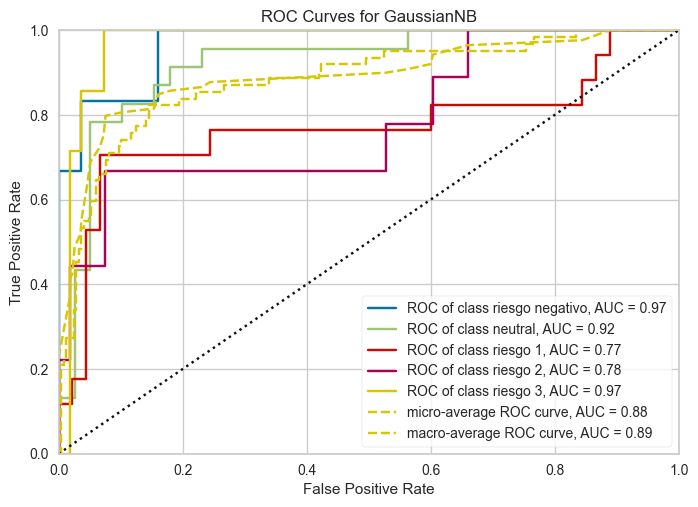

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for GaussianNB'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=GaussianNB(var_smoothing=1.232846739442066e-08))

In [119]:
plot_ROC_curve(GaussianNB(var_smoothing=1.232846739442066e-08),
                X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Trabajamos con el conjunto de datos sin PCA pero con feature selection

In [120]:
nb_classifier = GaussianNB()

X_t = SelectKBest(score_func=f_classif,k=31).fit_transform(X_train['rem'], y_train['rem'])

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=nb_classifier, 
                 param_grid=params_NB, 
                 cv=5, 
                 verbose=1, 
                 scoring='accuracy') 
gs_NB.fit(X_t, y_train['rem'])

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00e+00, 8.11e-01, 6.58e-01, 5.34e-01, 4.33e-01, 3.51e-01,
       2.85e-01, 2.31e-01, 1.87e-01, 1.52e-01, 1.23e-01, 1.00e-01,
       8.11e-02, 6.58e-02, 5.34e-02, 4.33e-02, 3.51e-02, 2.85e-02,
       2.31e-02, 1.87e-02, 1.52e-02, 1.23e-02, 1.00e-02, 8.11e-03,
       6.58e-03, 5.34e-03, 4.33e-03, 3.51e-03, 2.85e-03, 2.31e-03,
       1.87...
       3.51e-06, 2.85e-06, 2.31e-06, 1.87e-06, 1.52e-06, 1.23e-06,
       1.00e-06, 8.11e-07, 6.58e-07, 5.34e-07, 4.33e-07, 3.51e-07,
       2.85e-07, 2.31e-07, 1.87e-07, 1.52e-07, 1.23e-07, 1.00e-07,
       8.11e-08, 6.58e-08, 5.34e-08, 4.33e-08, 3.51e-08, 2.85e-08,
       2.31e-08, 1.87e-08, 1.52e-08, 1.23e-08, 1.00e-08, 8.11e-09,
       6.58e-09, 5.34e-09, 4.33e-09, 3.51e-09, 2.85e-09, 2.31e-09,
       1.87e-09, 1.52e-09, 1.23e-09, 1.00e-09])},
             scoring='accuracy', verbose=1)

In [121]:
gs_NB.best_params_

{'var_smoothing': 6.579332246575682e-09}

In [122]:
gs_NB.best_score_

0.6502463054187192

In [123]:
# Guardamos el mejor modelo sin PCA utilizando feature selection

pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                            GaussianNB(var_smoothing=6.579332246575682e-09))

model,metrics = classification_metrics(pipeline_nb,
                                   X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open('models/NBClassifierRemFS.pkl','wb'))
pickle.dump(metrics, open('metrics/NBClassifierRemFSMetrics.pkl','wb'))

Training Accuracy = 0.6923076923076923
Test Accuracy = 0.6935483870967742
Training Kappa = 0.6045503111055245
Test Kappa = 0.5947712418300655
Training Precision = [0.7  0.77 0.62 0.67 0.73]
Test Precision = [0.56 0.83 0.57 0.86 0.71]
Training recall = [0.84 0.61 0.81 0.43 0.8 ]
Test recall = [0.83 0.65 0.71 0.67 0.71]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       0.70      0.84      0.76        19
           0       0.77      0.61      0.68        44
           1       0.62      0.81      0.71        37
           2       0.67      0.43      0.53        23
           3       0.73      0.80      0.76        20

    accuracy                           0.69       143
   macro avg       0.70      0.70      0.69       143
weighted avg       0.70      0.69      0.69       143



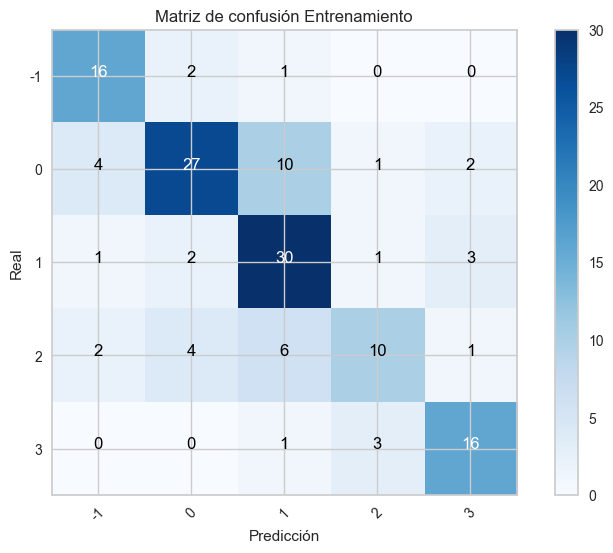

Reporte Prueba
              precision    recall  f1-score   support

          -1       0.56      0.83      0.67         6
           0       0.83      0.65      0.73        23
           1       0.57      0.71      0.63        17
           2       0.86      0.67      0.75         9
           3       0.71      0.71      0.71         7

    accuracy                           0.69        62
   macro avg       0.71      0.71      0.70        62
weighted avg       0.72      0.69      0.70        62



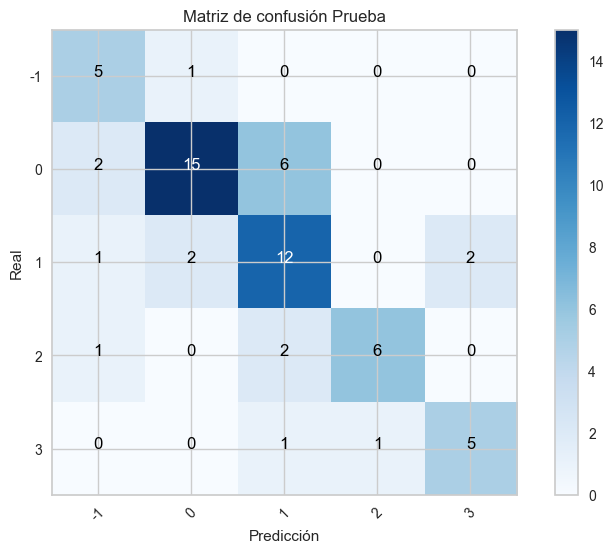

In [124]:
pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                            GaussianNB(var_smoothing=6.579332246575682e-09))
report_and_conf_matrix(pipeline_nb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

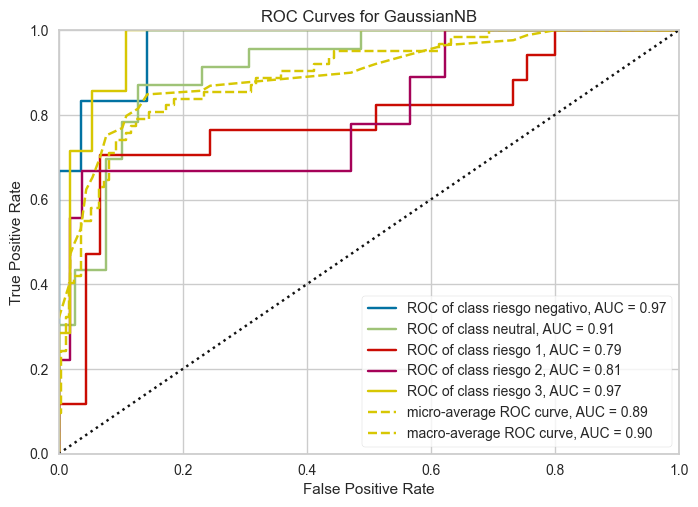

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for GaussianNB'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=31)),
                                 ('gaussiannb',
                                  GaussianNB(var_smoothing=6.579332246575682e-09))]))

In [125]:
pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                            GaussianNB(var_smoothing=6.579332246575682e-09))
plot_ROC_curve(pipeline_nb,X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Utilizamos el conjunto de datos con PCA

In [126]:
nb_classifier = GaussianNB()

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=nb_classifier, 
                 param_grid=params_NB, 
                 cv=5, 
                 verbose=1, 
                 scoring='accuracy') 
gs_NB.fit(X_train['pca_rem'], y_train['pca_rem'])

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00e+00, 8.11e-01, 6.58e-01, 5.34e-01, 4.33e-01, 3.51e-01,
       2.85e-01, 2.31e-01, 1.87e-01, 1.52e-01, 1.23e-01, 1.00e-01,
       8.11e-02, 6.58e-02, 5.34e-02, 4.33e-02, 3.51e-02, 2.85e-02,
       2.31e-02, 1.87e-02, 1.52e-02, 1.23e-02, 1.00e-02, 8.11e-03,
       6.58e-03, 5.34e-03, 4.33e-03, 3.51e-03, 2.85e-03, 2.31e-03,
       1.87...
       3.51e-06, 2.85e-06, 2.31e-06, 1.87e-06, 1.52e-06, 1.23e-06,
       1.00e-06, 8.11e-07, 6.58e-07, 5.34e-07, 4.33e-07, 3.51e-07,
       2.85e-07, 2.31e-07, 1.87e-07, 1.52e-07, 1.23e-07, 1.00e-07,
       8.11e-08, 6.58e-08, 5.34e-08, 4.33e-08, 3.51e-08, 2.85e-08,
       2.31e-08, 1.87e-08, 1.52e-08, 1.23e-08, 1.00e-08, 8.11e-09,
       6.58e-09, 5.34e-09, 4.33e-09, 3.51e-09, 2.85e-09, 2.31e-09,
       1.87e-09, 1.52e-09, 1.23e-09, 1.00e-09])},
             scoring='accuracy', verbose=1)

In [127]:
gs_NB.best_params_

{'var_smoothing': 0.0657933224657568}

In [128]:
gs_NB.best_score_

0.6571428571428571

In [129]:
# Guardamos el mejor modelo utilizando el dataset con PCA

model,metrics = classification_metrics(GaussianNB(var_smoothing=0.0657933224657568),
                                   X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open('models/NBClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open('metrics/NBClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 0.6923076923076923
Test Accuracy = 0.6774193548387096
Training Kappa = 0.6032786885245902
Test Kappa = 0.5796610169491525
Training Precision = [0.72 0.8  0.58 0.7  0.76]
Test Precision = [0.5  0.82 0.63 0.8  0.67]
Training recall = [0.95 0.64 0.81 0.3  0.8 ]
Test recall = [1.   0.61 0.71 0.44 0.86]


Utilizamos el conjunto de datos con PCA y con feature selection

In [130]:
nb_classifier = GaussianNB()

X_t = SelectKBest(score_func=f_classif,k=27).fit_transform(X_train['pca_rem'], y_train['pca_rem'])

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=nb_classifier, 
                 param_grid=params_NB, 
                 cv=5, 
                 verbose=1, 
                 scoring='accuracy') 
gs_NB.fit(X_t, y_train['pca_rem'])

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00e+00, 8.11e-01, 6.58e-01, 5.34e-01, 4.33e-01, 3.51e-01,
       2.85e-01, 2.31e-01, 1.87e-01, 1.52e-01, 1.23e-01, 1.00e-01,
       8.11e-02, 6.58e-02, 5.34e-02, 4.33e-02, 3.51e-02, 2.85e-02,
       2.31e-02, 1.87e-02, 1.52e-02, 1.23e-02, 1.00e-02, 8.11e-03,
       6.58e-03, 5.34e-03, 4.33e-03, 3.51e-03, 2.85e-03, 2.31e-03,
       1.87...
       3.51e-06, 2.85e-06, 2.31e-06, 1.87e-06, 1.52e-06, 1.23e-06,
       1.00e-06, 8.11e-07, 6.58e-07, 5.34e-07, 4.33e-07, 3.51e-07,
       2.85e-07, 2.31e-07, 1.87e-07, 1.52e-07, 1.23e-07, 1.00e-07,
       8.11e-08, 6.58e-08, 5.34e-08, 4.33e-08, 3.51e-08, 2.85e-08,
       2.31e-08, 1.87e-08, 1.52e-08, 1.23e-08, 1.00e-08, 8.11e-09,
       6.58e-09, 5.34e-09, 4.33e-09, 3.51e-09, 2.85e-09, 2.31e-09,
       1.87e-09, 1.52e-09, 1.23e-09, 1.00e-09])},
             scoring='accuracy', verbose=1)

In [131]:
gs_NB.best_params_

{'var_smoothing': 0.03511191734215131}

In [132]:
gs_NB.best_score_

0.6433497536945814

In [133]:
# Guardamos el mejor modelo sin PCA utilizando feature selection

pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=27),
                            GaussianNB(var_smoothing=0.03511191734215131))

model,metrics = classification_metrics(pipeline_nb,
                                   X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open('models/NBClassifierPCARemFS.pkl','wb'))
pickle.dump(metrics, open('metrics/NBClassifierPCARemFSMetrics.pkl','wb'))

Training Accuracy = 0.6993006993006993
Test Accuracy = 0.6612903225806451
Training Kappa = 0.6115848651380204
Test Kappa = 0.5534979423868313
Training Precision = [0.78 0.82 0.59 0.5  0.76]
Test Precision = [0.5  0.74 0.63 0.8  0.67]
Training recall = [0.95 0.7  0.78 0.26 0.8 ]
Test recall = [0.83 0.61 0.71 0.44 0.86]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       0.78      0.95      0.86        19
           0       0.82      0.70      0.76        44
           1       0.59      0.78      0.67        37
           2       0.50      0.26      0.34        23
           3       0.76      0.80      0.78        20

    accuracy                           0.70       143
   macro avg       0.69      0.70      0.68       143
weighted avg       0.70      0.70      0.69       143



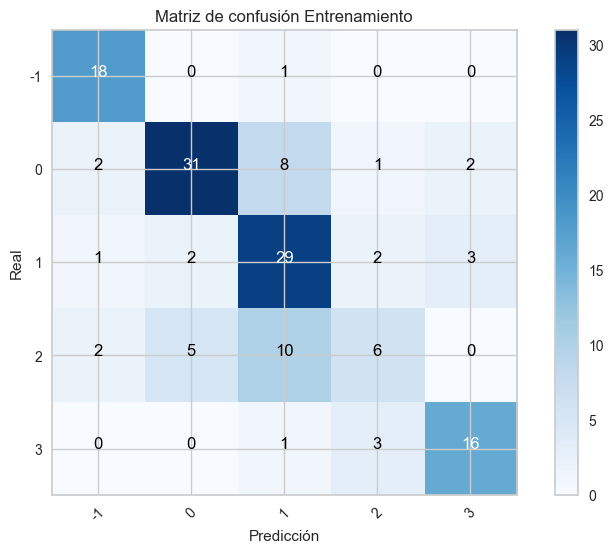

Reporte Prueba
              precision    recall  f1-score   support

          -1       0.50      0.83      0.62         6
           0       0.74      0.61      0.67        23
           1       0.63      0.71      0.67        17
           2       0.80      0.44      0.57         9
           3       0.67      0.86      0.75         7

    accuracy                           0.66        62
   macro avg       0.67      0.69      0.66        62
weighted avg       0.69      0.66      0.66        62



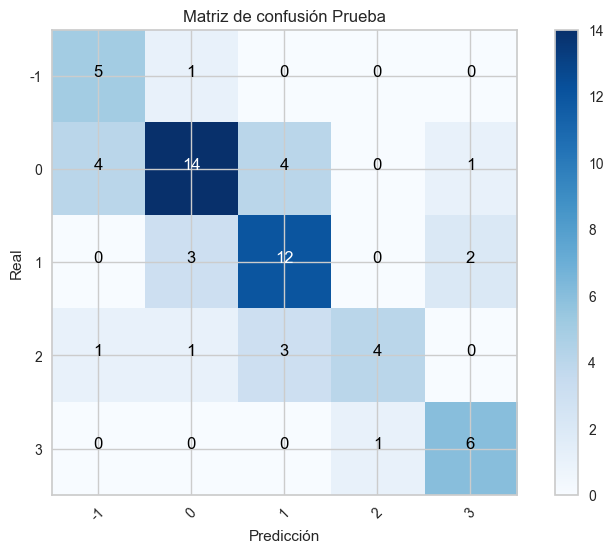

In [134]:
pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=27),
                            GaussianNB(var_smoothing=0.03511191734215131))
report_and_conf_matrix(pipeline_nb,
                X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

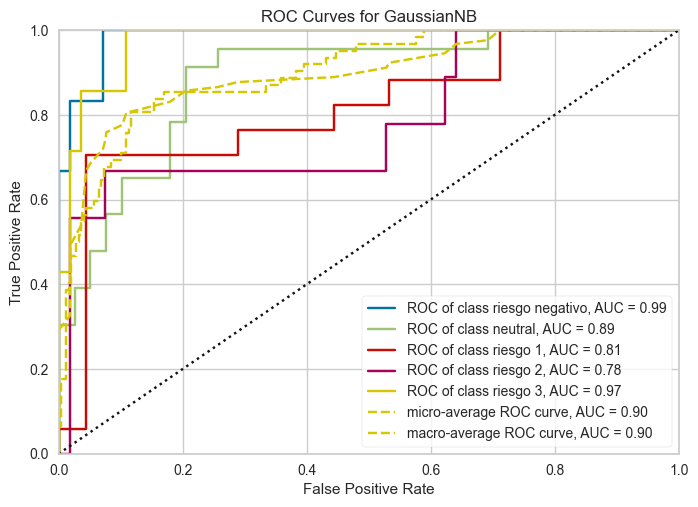

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for GaussianNB'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=27)),
                                 ('gaussiannb',
                                  GaussianNB(var_smoothing=0.03511191734215131))]))

In [135]:
pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=27),
                            GaussianNB(var_smoothing=0.03511191734215131))
plot_ROC_curve(pipeline_nb,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

### 7.5. Modelo de Árbol de Clasificación

Conjunto de datos sin PCA

Training Accuracy = 1.0
Test Accuracy = 0.8709677419354839
Training Kappa = 1.0
Test Kappa = 0.8278375564040263
Training Precision = [1. 1. 1. 1. 1.]
Test Precision = [0.86 0.95 0.88 0.86 0.67]
Training recall = [1. 1. 1. 1. 1.]
Test recall = [1.   0.91 0.88 0.67 0.86]
DecisionTreeClassifier(random_state=1234)


[Text(0.4875, 0.9, 'x[28] <= 0.5\ngini = 0.775\nsamples = 143\nvalue = [19, 44, 37, 23, 20]'),
 Text(0.225, 0.7, 'x[2] <= 50.35\ngini = 0.707\nsamples = 65\nvalue = [0, 6, 24, 15, 20]'),
 Text(0.1, 0.5, 'x[2] <= 48.3\ngini = 0.133\nsamples = 14\nvalue = [0, 1, 0, 0, 13]'),
 Text(0.05, 0.3, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0, 0]'),
 Text(0.15, 0.3, 'gini = 0.0\nsamples = 13\nvalue = [0, 0, 0, 0, 13]'),
 Text(0.35, 0.5, 'x[3] <= 3.41\ngini = 0.664\nsamples = 51\nvalue = [0, 5, 24, 15, 7]'),
 Text(0.25, 0.3, 'x[0] <= 178.0\ngini = 0.516\nsamples = 33\nvalue = [0, 3, 22, 5, 3]'),
 Text(0.2, 0.1, '\n  (...)  \n'),
 Text(0.3, 0.1, '\n  (...)  \n'),
 Text(0.45, 0.3, 'x[5] <= 11699.5\ngini = 0.617\nsamples = 18\nvalue = [0, 2, 2, 10, 4]'),
 Text(0.4, 0.1, '\n  (...)  \n'),
 Text(0.5, 0.1, '\n  (...)  \n'),
 Text(0.75, 0.7, 'x[2] <= 51.8\ngini = 0.665\nsamples = 78\nvalue = [19, 38, 13, 8, 0]'),
 Text(0.6, 0.5, 'x[5] <= 8918.5\ngini = 0.198\nsamples = 9\nvalue = [1, 0, 8, 0, 0]'),
 T

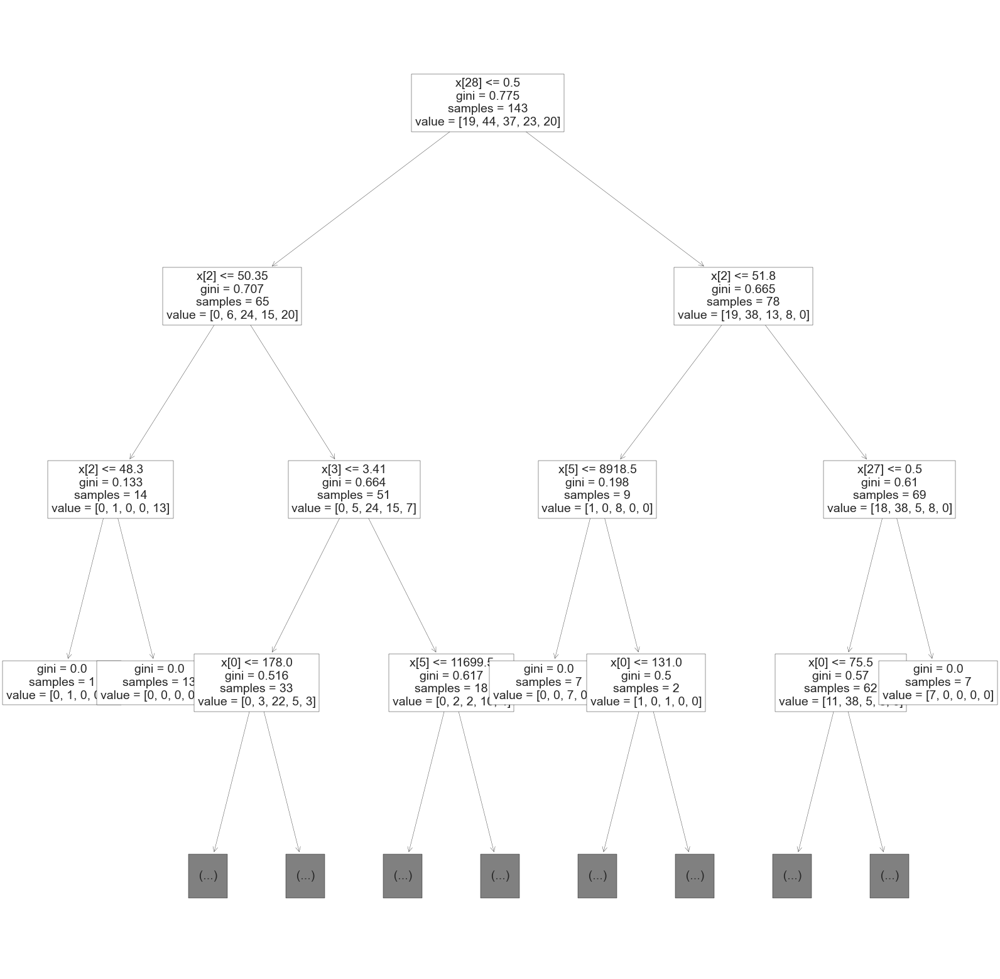

In [136]:
# Utilizamos un árbol de clasificación
# Verificamos sus métricas

from sklearn.tree import DecisionTreeClassifier, plot_tree

classification_metrics(DecisionTreeClassifier(random_state=1234),X_train['rem'],X_test['rem'],y_train['pca_rem'],y_test['pca_rem'])

tree_reg = DecisionTreeClassifier(random_state=1234).fit(X_train['rem'],y_train['rem'])
print(tree_reg)

# Diagramamos los primeros tres niveles del árbol resultante

plt.figure(figsize=(20,20))
plot_tree(tree_reg,filled=False,fontsize=14,max_depth=3)

In [137]:
# Vamos a realizar un ajuste de hiperparámetros para encontrar el mejor modelo de árbol de clasificación
# Establecemos la grilla de parámetros que verificar
# Haciendo uso de estos parámetros y una validación cruzada de 3 doblajes buscamos el mejor modelo
# Tiempo aprox = 9s 

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11],
           "min_samples_leaf":[1,2,3,4,],
           "max_leaf_nodes":[None,10,20,30] }

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer

kappa_scorer = make_scorer(cohen_kappa_score)
tuning_model=GridSearchCV(DecisionTreeClassifier(random_state=1234),
                          param_grid=parameters,scoring=kappa_scorer,
                          cv=3,verbose=3)

tuning_model.fit(X_train['rem'],y_train['rem'])

Fitting 3 folds for each of 192 candidates, totalling 576 fits
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.170 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.153 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.175 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.293 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.153 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.175 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.170 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.153 total time=   0.0s
[CV 3/3] END max_de

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=1234),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11],
                         'max_leaf_nodes': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'splitter': ['best', 'random']},
             scoring=make_scorer(cohen_kappa_score), verbose=3)

In [138]:
# Los híperparámetros del mejor modelo

tuning_model.best_params_

{'max_depth': 9,
 'max_leaf_nodes': 30,
 'min_samples_leaf': 1,
 'splitter': 'random'}

In [139]:
# El mejor modelo de árbol de clasificación sin PCA


tree_clsfr = DecisionTreeClassifier(random_state=1234,max_depth=9,
                                         max_leaf_nodes=30,
                                         min_samples_leaf=1,
                                         splitter='best')

model,metrics = classification_metrics(tree_clsfr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open('models/DecissionTreeClassifierRem.pkl','wb'))
pickle.dump(metrics, open('metrics/DecisionTreeClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.958041958041958
Test Accuracy = 0.8064516129032258
Training Kappa = 0.9456514853993793
Test Kappa = 0.7368234877962505
Training Precision = [1.   0.92 0.97 0.96 1.  ]
Test Precision = [1.   0.81 0.75 1.   0.67]
Training recall = [0.89 1.   0.92 1.   0.95]
Test recall = [0.83 0.91 0.71 0.67 0.86]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      0.89      0.94        19
           0       0.92      1.00      0.96        44
           1       0.97      0.92      0.94        37
           2       0.96      1.00      0.98        23
           3       1.00      0.95      0.97        20

    accuracy                           0.96       143
   macro avg       0.97      0.95      0.96       143
weighted avg       0.96      0.96      0.96       143



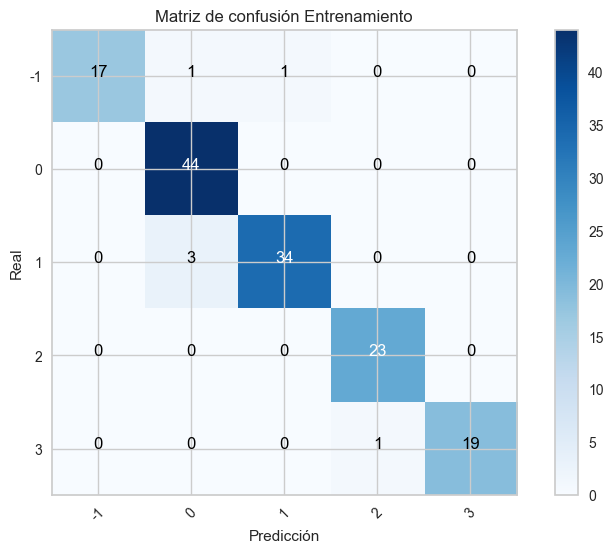

Reporte Prueba
              precision    recall  f1-score   support

          -1       1.00      0.83      0.91         6
           0       0.81      0.91      0.86        23
           1       0.75      0.71      0.73        17
           2       1.00      0.67      0.80         9
           3       0.67      0.86      0.75         7

    accuracy                           0.81        62
   macro avg       0.84      0.80      0.81        62
weighted avg       0.82      0.81      0.81        62



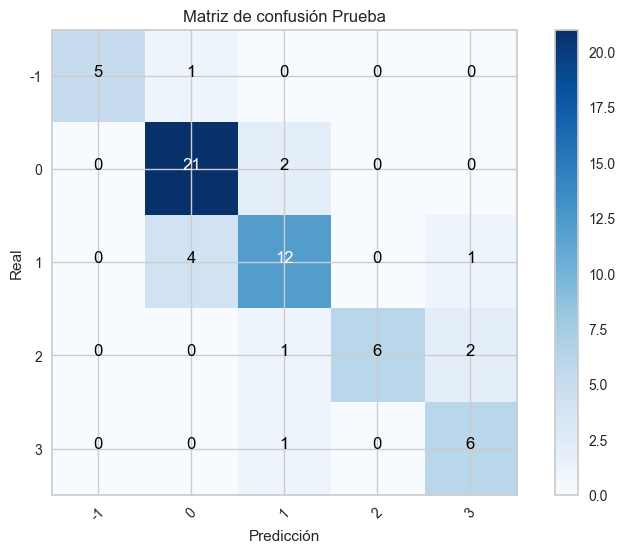

In [140]:
report_and_conf_matrix(DecisionTreeClassifier(random_state=1234,max_depth=11,
                                         max_leaf_nodes=30,
                                         min_samples_leaf=1,
                                         splitter='best'),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

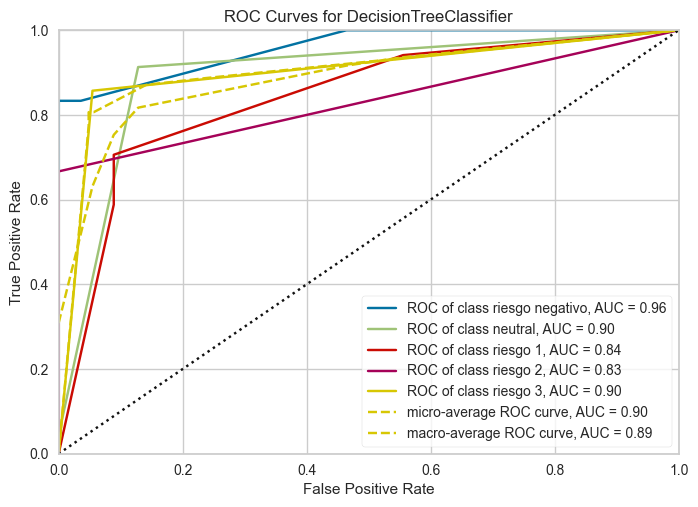

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=DecisionTreeClassifier(max_depth=11, max_leaf_nodes=30,
                                        random_state=1234))

In [141]:
plot_ROC_curve(DecisionTreeClassifier(random_state=1234,max_depth=11,
                                         max_leaf_nodes=30,
                                         min_samples_leaf=1,
                                         splitter='best'),
                X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Conjunto de datos sin PCA y con feature selection

In [142]:
# Tiempo aproximado: 8s

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11],
           "min_samples_leaf":[1,2,3,4,],
           "max_leaf_nodes":[None,10,20,30] }

X_t = SelectKBest(score_func=f_classif,k=31).fit_transform(X_train['rem'],y_train['rem'])

tuning_model=GridSearchCV(DecisionTreeClassifier(random_state=1234),param_grid=parameters,scoring=kappa_scorer,
                          cv=3,verbose=3)

tuning_model.fit(X_t,y_train['rem'])

Fitting 3 folds for each of 192 candidates, totalling 576 fits
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.170 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.153 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.175 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.148 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.153 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.175 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.170 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.153 total time=   0.0s
[CV 3/3] END max_de

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=1234),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11],
                         'max_leaf_nodes': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'splitter': ['best', 'random']},
             scoring=make_scorer(cohen_kappa_score), verbose=3)

In [143]:
tuning_model.best_params_

{'max_depth': 11,
 'max_leaf_nodes': None,
 'min_samples_leaf': 1,
 'splitter': 'random'}

In [144]:
# El mejor modelo de árbol de regresión sin PCA
# Con feature selection

pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                            DecisionTreeClassifier(random_state=1234,max_depth=9,
                                         max_leaf_nodes=None,
                                         min_samples_leaf=1,
                                         splitter='best'))

model,metrics = classification_metrics(pipeline_dt,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open('models/DecissionTreeClassifierRemFS.pkl','wb'))
pickle.dump(metrics, open('metrics/DecisionTreeClassifierRemFSMetrics.pkl','wb'))

Training Accuracy = 0.972027972027972
Test Accuracy = 0.8064516129032258
Training Kappa = 0.9638157894736842
Test Kappa = 0.7375661375661375
Training Precision = [1.   0.92 1.   1.   1.  ]
Test Precision = [1.   0.81 0.8  0.86 0.67]
Training recall = [0.95 1.   0.92 1.   1.  ]
Test recall = [0.83 0.91 0.71 0.67 0.86]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      0.95      0.97        19
           0       0.92      1.00      0.96        44
           1       1.00      0.92      0.96        37
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        20

    accuracy                           0.97       143
   macro avg       0.98      0.97      0.98       143
weighted avg       0.97      0.97      0.97       143



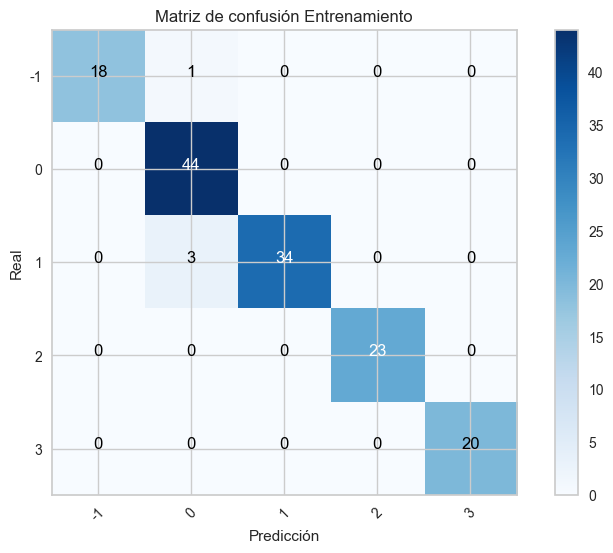

Reporte Prueba
              precision    recall  f1-score   support

          -1       1.00      0.83      0.91         6
           0       0.81      0.91      0.86        23
           1       0.80      0.71      0.75        17
           2       0.86      0.67      0.75         9
           3       0.67      0.86      0.75         7

    accuracy                           0.81        62
   macro avg       0.83      0.80      0.80        62
weighted avg       0.82      0.81      0.81        62



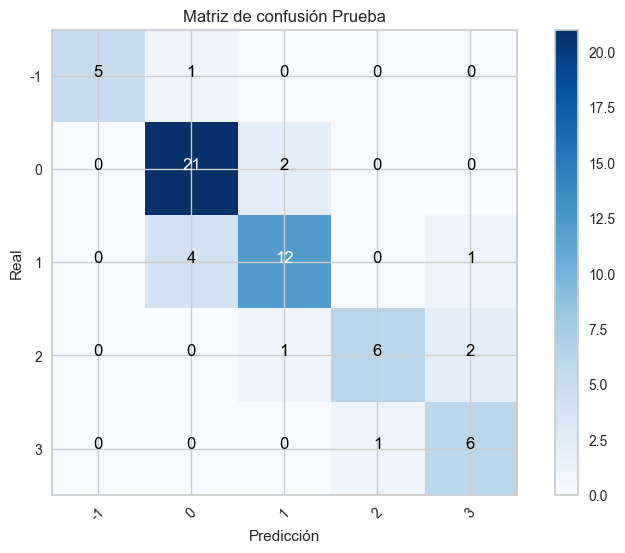

In [145]:
pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                            DecisionTreeClassifier(random_state=1234,max_depth=9,
                                         max_leaf_nodes=None,
                                         min_samples_leaf=1,
                                         splitter='best'))
report_and_conf_matrix(pipeline_dt,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

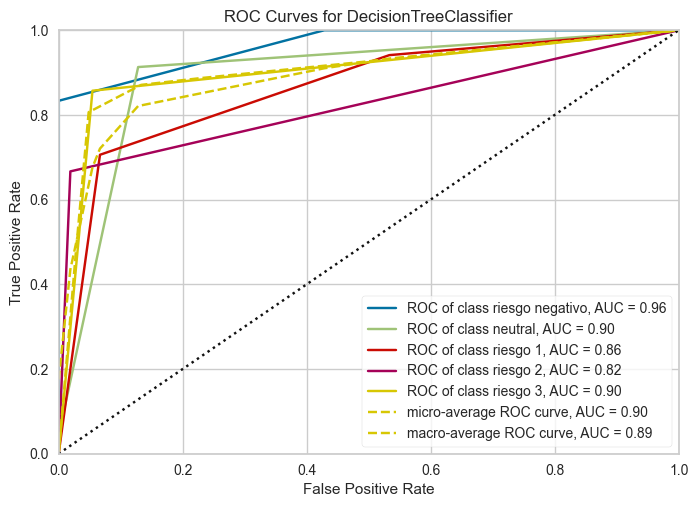

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=31)),
                                 ('decisiontreeclassifier',
                                  DecisionTreeClassifier(max_depth=9,
                                                         random_state=1234))]))

In [146]:
pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                            DecisionTreeClassifier(random_state=1234,max_depth=9,
                                         max_leaf_nodes=None,
                                         min_samples_leaf=1,
                                         splitter='best'))
plot_ROC_curve(pipeline_dt,X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

Modelo con conjunto de datos con PCA

In [147]:
# Tiempo aproximado: 11s

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11],
           "min_samples_leaf":[1,2,3,4,],
           "max_leaf_nodes":[None,10,20,30] }

tuning_model=GridSearchCV(DecisionTreeClassifier(random_state=1234),
                          param_grid=parameters,scoring=kappa_scorer,
                          cv=3,verbose=3)

tuning_model.fit(X_train['pca_rem'],y_train['pca_rem'])

Fitting 3 folds for each of 192 candidates, totalling 576 fits
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.130 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.153 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.175 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.293 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.153 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.175 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.130 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.153 total time=   0.0s
[CV 3/3] END max_de

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=1234),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11],
                         'max_leaf_nodes': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'splitter': ['best', 'random']},
             scoring=make_scorer(cohen_kappa_score), verbose=3)

In [148]:
tuning_model.best_params_

{'max_depth': 7,
 'max_leaf_nodes': None,
 'min_samples_leaf': 4,
 'splitter': 'best'}

In [149]:
# El mejor modelo de árbol de clasificación con PCA


tree_clsfr = DecisionTreeClassifier(random_state=1234,max_depth=7,
                                         max_leaf_nodes=None,
                                         min_samples_leaf=4,
                                         splitter='best')

model,metrics = classification_metrics(tree_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open('models/DecissionTreeClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open('metrics/DecisionTreeClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 0.8181818181818182
Test Accuracy = 0.6451612903225806
Training Kappa = 0.7636513889771788
Test Kappa = 0.5121602288984264
Training Precision = [0.94 0.74 0.9  0.76 0.89]
Test Precision = [0.83 0.58 0.82 0.43 0.71]
Training recall = [0.79 0.89 0.76 0.83 0.8 ]
Test recall = [0.83 0.78 0.53 0.33 0.71]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       0.94      0.79      0.86        19
           0       0.74      0.89      0.80        44
           1       0.90      0.76      0.82        37
           2       0.76      0.83      0.79        23
           3       0.89      0.80      0.84        20

    accuracy                           0.82       143
   macro avg       0.85      0.81      0.82       143
weighted avg       0.83      0.82      0.82       143



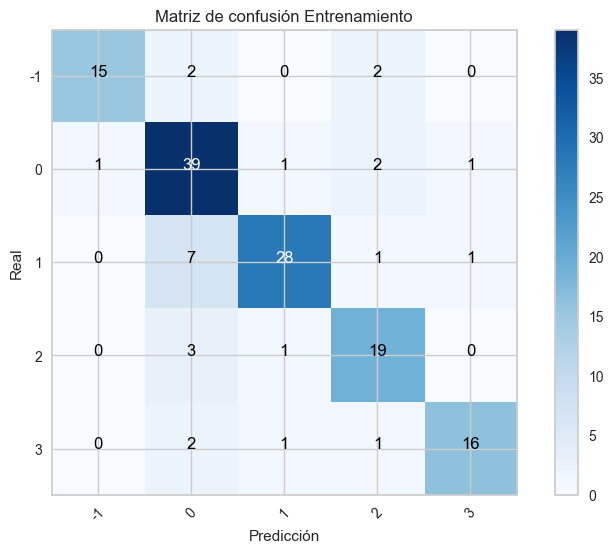

Reporte Prueba
              precision    recall  f1-score   support

          -1       0.83      0.83      0.83         6
           0       0.58      0.78      0.67        23
           1       0.82      0.53      0.64        17
           2       0.43      0.33      0.38         9
           3       0.71      0.71      0.71         7

    accuracy                           0.65        62
   macro avg       0.68      0.64      0.65        62
weighted avg       0.66      0.65      0.64        62



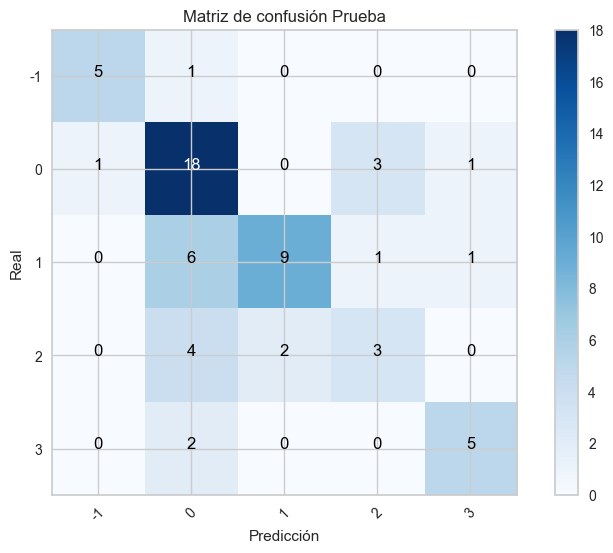

In [150]:
report_and_conf_matrix(DecisionTreeClassifier(random_state=1234,max_depth=7,
                                         max_leaf_nodes=None,
                                         min_samples_leaf=4,
                                         splitter='best'),
                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

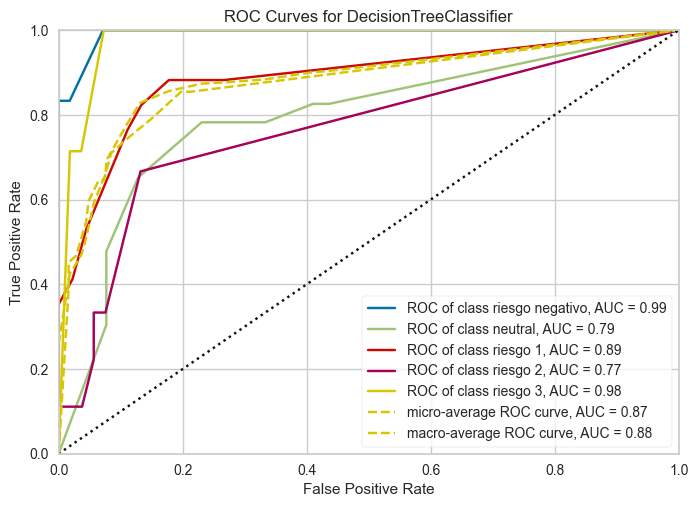

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=DecisionTreeClassifier(max_depth=7, min_samples_leaf=4,
                                        random_state=1234))

In [151]:
plot_ROC_curve(DecisionTreeClassifier(random_state=1234,max_depth=7,
                                         max_leaf_nodes=None,
                                         min_samples_leaf=4,
                                         splitter='best'),
                X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

Modelo con conjunto de datos con PCA y feature selection

In [152]:
# Tiempo aproximado: 9s

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11],
           "min_samples_leaf":[1,2,3,4,],
           "max_leaf_nodes":[None,10,20,30] }

X_t = SelectKBest(score_func=f_classif,k=27).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

tuning_model=GridSearchCV(DecisionTreeClassifier(random_state=1234),param_grid=parameters,scoring=kappa_scorer,
                          cv=3,verbose=3)

tuning_model.fit(X_t,y_train['pca_rem'])

Fitting 3 folds for each of 192 candidates, totalling 576 fits
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.130 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.153 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.175 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.293 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.153 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.175 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.130 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.153 total time=   0.0s
[CV 3/3] END max_de

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=1234),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11],
                         'max_leaf_nodes': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'splitter': ['best', 'random']},
             scoring=make_scorer(cohen_kappa_score), verbose=3)

In [153]:
tuning_model.best_params_

{'max_depth': 7,
 'max_leaf_nodes': 10,
 'min_samples_leaf': 1,
 'splitter': 'best'}

In [154]:
# El mejor modelo de árbol de regresión con PCA
# Con feature selection

pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=27),
                            DecisionTreeClassifier(random_state=1234,max_depth=7,
                                         max_leaf_nodes=10,
                                         min_samples_leaf=1,
                                         splitter='best'))

model,metrics = classification_metrics(pipeline_dt,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open('models/DecissionTreeClassifierPCARemFS.pkl','wb'))
pickle.dump(metrics, open('metrics/DecisionTreeClassifierPCARemFSMetrics.pkl','wb'))

Training Accuracy = 0.7482517482517482
Test Accuracy = 0.6451612903225806
Training Kappa = 0.6725607429080269
Test Kappa = 0.5152807391613362
Training Precision = [0.94 0.65 1.   0.67 0.77]
Test Precision = [0.83 0.61 1.   0.57 0.5 ]
Training recall = [0.79 0.91 0.51 0.7  0.85]
Test recall = [0.83 0.87 0.35 0.44 0.71]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       0.94      0.79      0.86        19
           0       0.65      0.91      0.75        44
           1       1.00      0.51      0.68        37
           2       0.67      0.70      0.68        23
           3       0.77      0.85      0.81        20

    accuracy                           0.75       143
   macro avg       0.80      0.75      0.76       143
weighted avg       0.80      0.75      0.74       143



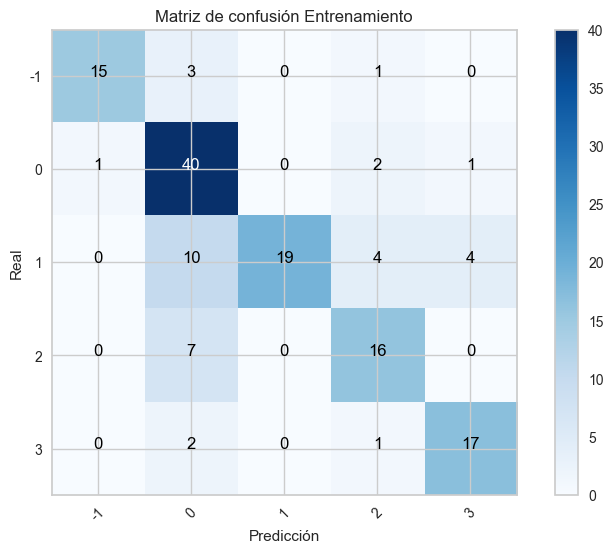

Reporte Prueba
              precision    recall  f1-score   support

          -1       0.83      0.83      0.83         6
           0       0.61      0.87      0.71        23
           1       1.00      0.35      0.52        17
           2       0.57      0.44      0.50         9
           3       0.50      0.71      0.59         7

    accuracy                           0.65        62
   macro avg       0.70      0.64      0.63        62
weighted avg       0.72      0.65      0.63        62



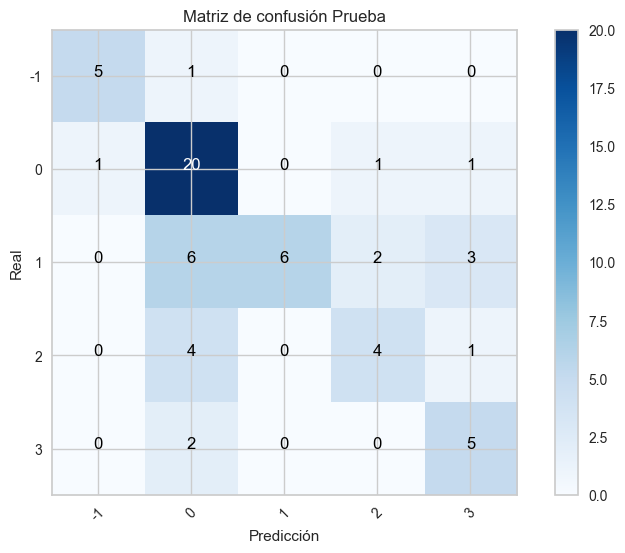

In [155]:
pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=27),
                            DecisionTreeClassifier(random_state=1234,max_depth=7,
                                         max_leaf_nodes=10,
                                         min_samples_leaf=1,
                                         splitter='best'))
report_and_conf_matrix(pipeline_dt,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

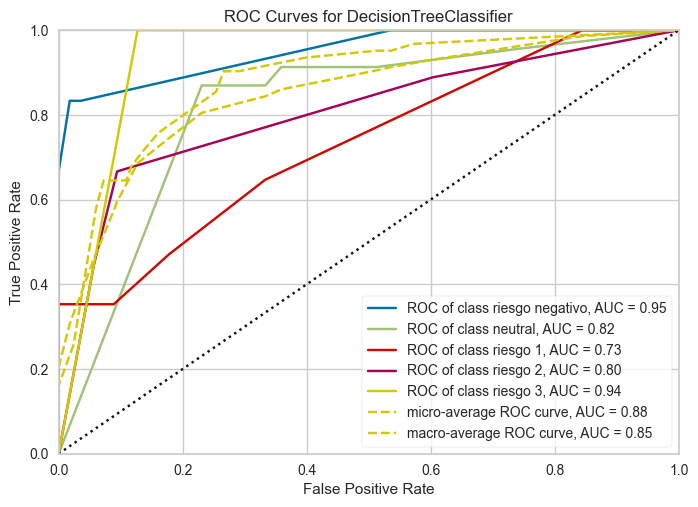

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=31)),
                                 ('decisiontreeclassifier',
                                  DecisionTreeClassifier(max_depth=7,
                                                         max_leaf_nodes=10,
                                                         random_state=1234))]))

In [156]:
pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                            DecisionTreeClassifier(random_state=1234,max_depth=7,
                                         max_leaf_nodes=10,
                                         min_samples_leaf=1,
                                         splitter='best'))
plot_ROC_curve(pipeline_dt,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

### 7.6. Modelo de Random Forest

Conjunto de datos sin PCA

In [157]:

from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=1234)

classification_metrics(rf,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

rf.fit(X_train['rem'],y_train['rem'])
print(rf.get_params())

Training Accuracy = 1.0
Test Accuracy = 0.9032258064516129
Training Kappa = 1.0
Test Kappa = 0.8703832752613241
Training Precision = [1. 1. 1. 1. 1.]
Test Precision = [1.   0.95 0.83 1.   0.78]
Training recall = [1. 1. 1. 1. 1.]
Test recall = [1.   0.91 0.88 0.78 1.  ]
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 1234, 'verbose': 0, 'warm_start': False}


In [158]:
# Tiempo aproximado: 2m

params = {'max_depth': [None, 10, 20],
          'min_samples_leaf': [1, 2, 3],
          'min_samples_split': [2, 5],
          'n_estimators': [100, 200, 400]}

tuning_model=GridSearchCV(RandomForestClassifier(random_state=1234),param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)

tuning_model.fit(X_train['rem'],y_train['rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.514 total time=   0.1s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.698 total time=   0.1s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.678 total time=   0.1s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.488 total time=   0.1s
[CV 5/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.720 total time=   0.1s
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.472 total time=   0.1s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.739 total time=   0.1s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.6

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1234),
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200, 400]},
             scoring=make_scorer(cohen_kappa_score), verbose=3)

In [159]:
tuning_model.best_params_

{'max_depth': None,
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 100}

In [160]:
# El mejor modelo de Random Forest
# Sin PCA


rf_clsfr = RandomForestClassifier(random_state=1234,max_depth=None,
                                         min_samples_leaf=1,
                                         min_samples_split=5,
                                         n_estimators=100)

model,metrics = classification_metrics(rf_clsfr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open('models/RandomForestClassifierRem.pkl','wb'))
pickle.dump(metrics, open('metrics/RandomForestClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.972027972027972
Test Accuracy = 0.8387096774193549
Training Kappa = 0.9637745408486383
Test Kappa = 0.7817669834565294
Training Precision = [1.   0.96 0.95 1.   1.  ]
Test Precision = [1.   0.88 0.81 0.71 0.78]
Training recall = [0.89 1.   0.97 0.96 1.  ]
Test recall = [0.83 0.96 0.76 0.56 1.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      0.89      0.94        19
           0       0.96      1.00      0.98        44
           1       0.95      0.97      0.96        37
           2       1.00      0.96      0.98        23
           3       1.00      1.00      1.00        20

    accuracy                           0.97       143
   macro avg       0.98      0.96      0.97       143
weighted avg       0.97      0.97      0.97       143



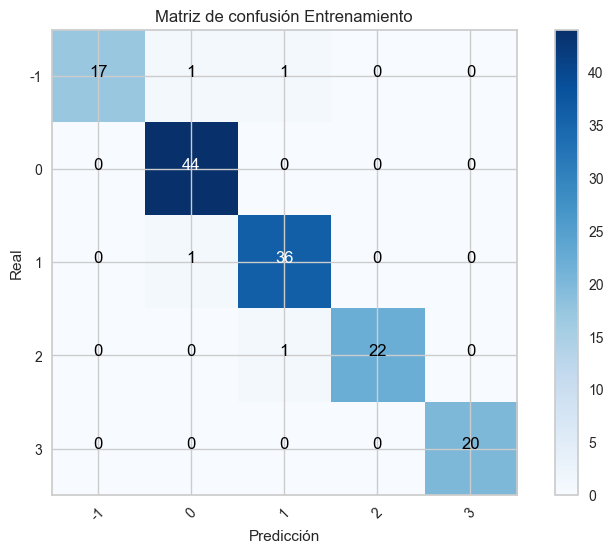

Reporte Prueba
              precision    recall  f1-score   support

          -1       1.00      0.83      0.91         6
           0       0.88      0.96      0.92        23
           1       0.81      0.76      0.79        17
           2       0.71      0.56      0.63         9
           3       0.78      1.00      0.88         7

    accuracy                           0.84        62
   macro avg       0.84      0.82      0.82        62
weighted avg       0.84      0.84      0.83        62



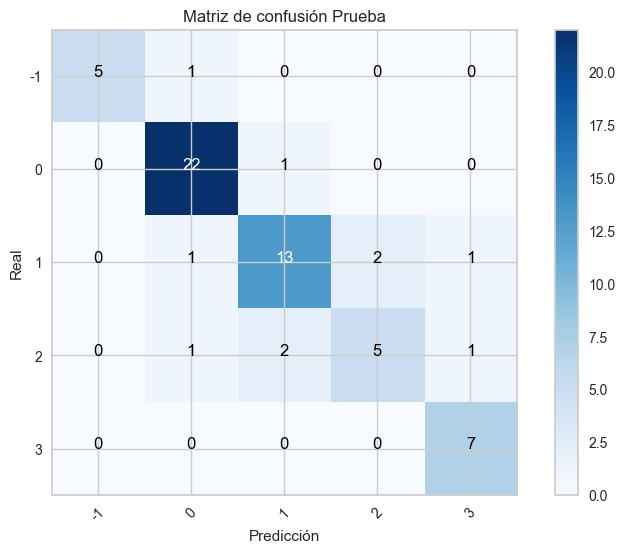

In [161]:
report_and_conf_matrix(RandomForestClassifier(random_state=1234,max_depth=None,
                                         min_samples_leaf=1,
                                         min_samples_split=5,
                                         n_estimators=100),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

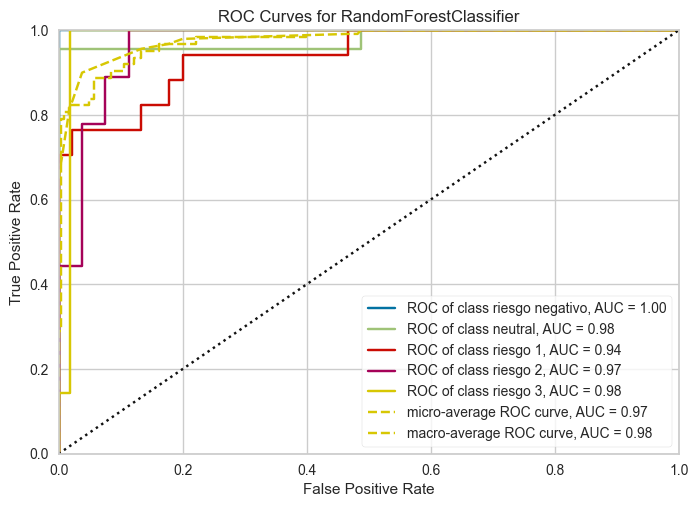

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=RandomForestClassifier(min_samples_split=5, random_state=1234))

In [162]:
plot_ROC_curve(RandomForestClassifier(random_state=1234,max_depth=None,
                                         min_samples_leaf=1,
                                         min_samples_split=5,
                                         n_estimators=100),
                X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Modelo sin PCA pero con feature selection

In [163]:
# Tiempo aproximado: 3m

params = {'max_depth': [None, 10, 20],
          'min_samples_leaf': [1, 2, 3],
          'min_samples_split': [2, 5],
          'n_estimators': [100, 200, 400]}

X_t = SelectKBest(score_func=f_classif,k=31).fit_transform(X_train['rem'],y_train['rem'])

tuning_model=GridSearchCV(RandomForestClassifier(random_state=1234),param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)

tuning_model.fit(X_t,y_train['rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.518 total time=   0.1s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.698 total time=   0.1s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.678 total time=   0.1s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.437 total time=   0.1s
[CV 5/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.768 total time=   0.1s
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.470 total time=   0.1s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.740 total time=   0.1s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.6

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1234),
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200, 400]},
             scoring=make_scorer(cohen_kappa_score), verbose=3)

In [164]:
tuning_model.best_params_

{'max_depth': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 200}

In [165]:
# El mejor modelo de random forest sin PCA
# Con feature selection

rf_clsfr = RandomForestClassifier(random_state=1234,max_depth=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         n_estimators=200)

X_t = SelectKBest(score_func=f_classif,k=31).fit_transform(X_train['rem'],y_train['rem'])

model,metrics = classification_metrics(rf_clsfr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open('models/RandomForestClassifierRemFS.pkl','wb'))
pickle.dump(metrics, open('metrics/RandomForestClassifierRemFSMetrics.pkl','wb'))

Training Accuracy = 1.0
Test Accuracy = 0.8709677419354839
Training Kappa = 1.0
Test Kappa = 0.8268156424581006
Training Precision = [1. 1. 1. 1. 1.]
Test Precision = [1.   0.95 0.79 1.   0.7 ]
Training recall = [1. 1. 1. 1. 1.]
Test recall = [1.   0.91 0.88 0.56 1.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00        19
           0       1.00      1.00      1.00        44
           1       1.00      1.00      1.00        37
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        20

    accuracy                           1.00       143
   macro avg       1.00      1.00      1.00       143
weighted avg       1.00      1.00      1.00       143



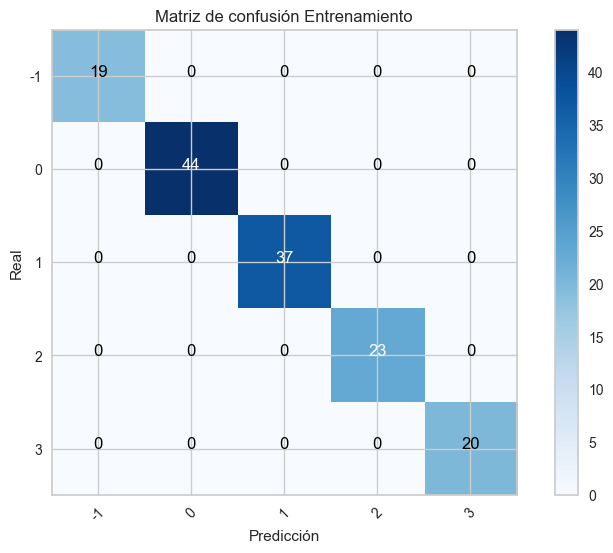

Reporte Prueba
              precision    recall  f1-score   support

          -1       1.00      0.83      0.91         6
           0       0.91      0.91      0.91        23
           1       0.79      0.88      0.83        17
           2       1.00      0.78      0.88         9
           3       0.88      1.00      0.93         7

    accuracy                           0.89        62
   macro avg       0.92      0.88      0.89        62
weighted avg       0.90      0.89      0.89        62



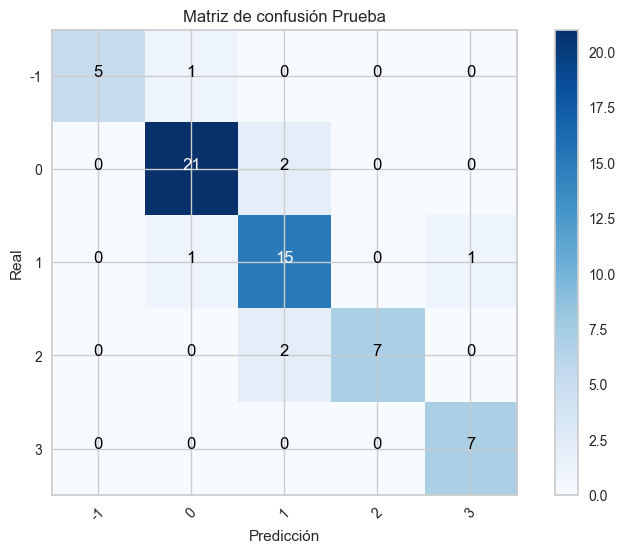

In [166]:
pipeline_rf = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                          RandomForestClassifier(random_state=1234,max_depth=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         n_estimators=200))
report_and_conf_matrix(pipeline_rf,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

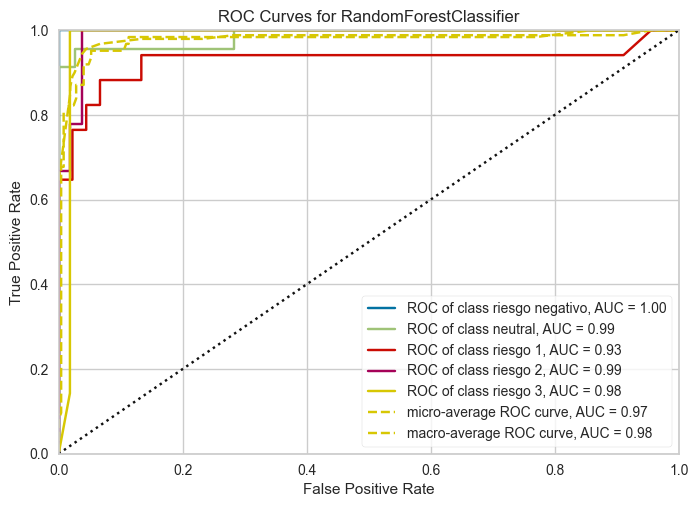

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=31)),
                                 ('randomforestclassifier',
                                  RandomForestClassifier(n_estimators=200,
                                                         random_state=1234))]))

In [167]:
pipeline_rf = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                          RandomForestClassifier(random_state=1234,max_depth=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         n_estimators=200))
plot_ROC_curve(pipeline_rf,X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

Modelo con conjunto de datos con PCA

In [168]:
# Tiempo aproximado: 2m

params = {'max_depth': [None, 10, 20],
          'min_samples_leaf': [1, 2, 3],
          'min_samples_split': [2, 5],
          'n_estimators': [100, 200, 400]}

tuning_model=GridSearchCV(RandomForestClassifier(random_state=1234),param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)

tuning_model.fit(X_train['pca_rem'],y_train['pca_rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.559 total time=   0.1s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.692 total time=   0.1s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.639 total time=   0.1s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.490 total time=   0.1s
[CV 5/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.669 total time=   0.1s
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.560 total time=   0.1s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.693 total time=   0.1s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.6

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1234),
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200, 400]},
             scoring=make_scorer(cohen_kappa_score), verbose=3)

In [169]:
tuning_model.best_params_

{'max_depth': None,
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 400}

In [170]:
# El mejor modelo de Random Forest
# Con PCA


rf_clsfr = RandomForestClassifier(random_state=1234,max_depth=None,
                                         min_samples_leaf=1,
                                         min_samples_split=5,
                                         n_estimators=400)

model,metrics = classification_metrics(rf_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open('models/RandomForestClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open('metrics/RandomForestClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 0.9790209790209791
Test Accuracy = 0.7903225806451613
Training Kappa = 0.97289613343442
Test Kappa = 0.7196521739130435
Training Precision = [1.   0.98 0.97 1.   0.95]
Test Precision = [1.   0.8  0.92 0.6  0.7 ]
Training recall = [0.89 1.   0.97 1.   1.  ]
Test recall = [0.83 0.87 0.65 0.67 1.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      0.89      0.94        19
           0       0.98      1.00      0.99        44
           1       0.97      0.97      0.97        37
           2       1.00      1.00      1.00        23
           3       0.95      1.00      0.98        20

    accuracy                           0.98       143
   macro avg       0.98      0.97      0.98       143
weighted avg       0.98      0.98      0.98       143



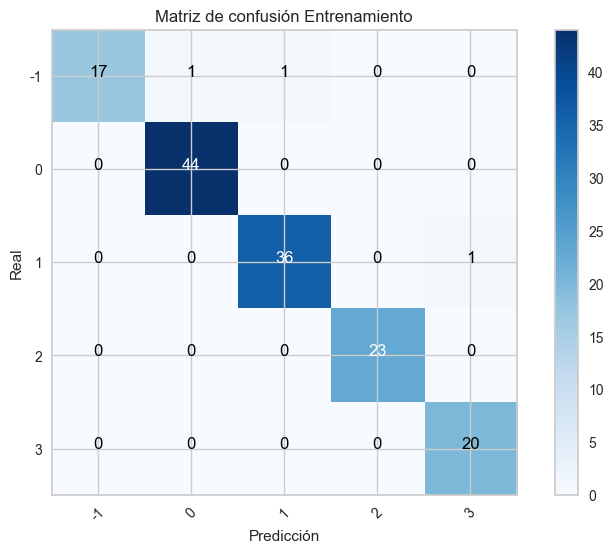

Reporte Prueba
              precision    recall  f1-score   support

          -1       1.00      0.83      0.91         6
           0       0.80      0.87      0.83        23
           1       0.92      0.65      0.76        17
           2       0.60      0.67      0.63         9
           3       0.70      1.00      0.82         7

    accuracy                           0.79        62
   macro avg       0.80      0.80      0.79        62
weighted avg       0.81      0.79      0.79        62



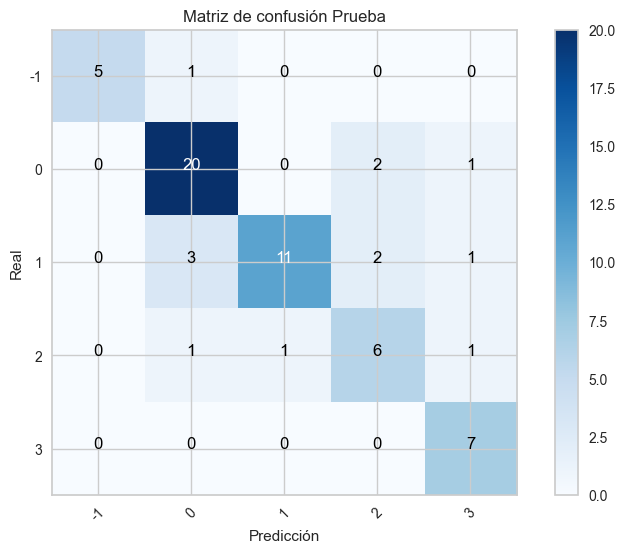

In [171]:
report_and_conf_matrix(RandomForestClassifier(random_state=1234,max_depth=None,
                                         min_samples_leaf=1,
                                         min_samples_split=5,
                                         n_estimators=400),
                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

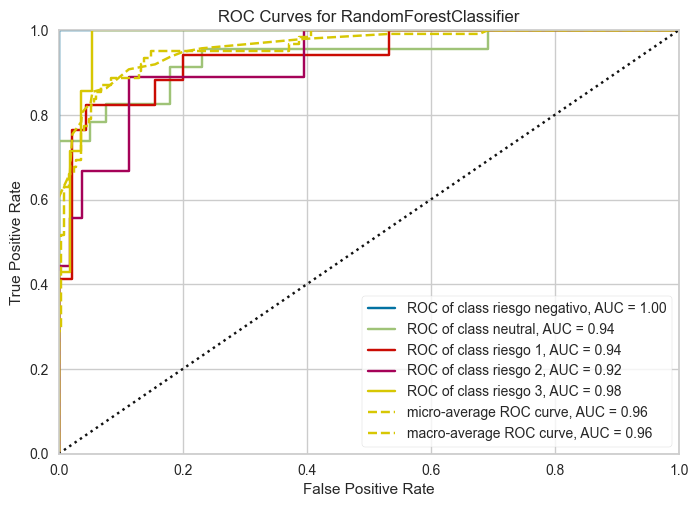

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=RandomForestClassifier(min_samples_split=5, n_estimators=400,
                                        random_state=1234))

In [172]:
plot_ROC_curve(RandomForestClassifier(random_state=1234,max_depth=None,
                                         min_samples_leaf=1,
                                         min_samples_split=5,
                                         n_estimators=400),
                X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

Modelo con PCA y feature selection

In [173]:
# Tiempo aproximado: 3m

params = {'max_depth': [None, 10, 20],
          'min_samples_leaf': [1, 2, 3],
          'min_samples_split': [2, 5],
          'n_estimators': [100, 200, 400]}

X_t = SelectKBest(score_func=f_classif,k=27).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

tuning_model=GridSearchCV(RandomForestClassifier(random_state=1234),param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)

tuning_model.fit(X_t,y_train['pca_rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.517 total time=   0.1s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.694 total time=   0.1s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.633 total time=   0.1s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.437 total time=   0.1s
[CV 5/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.669 total time=   0.1s
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.559 total time=   0.1s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.695 total time=   0.1s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.6

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1234),
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200, 400]},
             scoring=make_scorer(cohen_kappa_score), verbose=3)

In [174]:
tuning_model.best_params_

{'max_depth': 10,
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 100}

In [175]:
# El mejor modelo de random forest con PCA
# Con feature selection

rf_clsfr = RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=1,
                                         min_samples_split=5,
                                         n_estimators=100)

X_t = SelectKBest(score_func=f_classif,k=27).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

model,metrics = classification_metrics(rf_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open('models/RandomForestClassifierPCARemFS.pkl','wb'))
pickle.dump(metrics, open('metrics/RandomForestClassifierPCARemFSMetrics.pkl','wb'))

Training Accuracy = 0.951048951048951
Test Accuracy = 0.7903225806451613
Training Kappa = 0.93678560151563
Test Kappa = 0.719261581330547
Training Precision = [1.   0.93 0.94 0.96 0.95]
Test Precision = [1.   0.81 0.91 0.67 0.64]
Training recall = [0.89 0.98 0.89 1.   1.  ]
Test recall = [0.83 0.91 0.59 0.67 1.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      0.89      0.94        19
           0       0.93      0.95      0.94        44
           1       0.94      0.92      0.93        37
           2       1.00      1.00      1.00        23
           3       0.91      1.00      0.95        20

    accuracy                           0.95       143
   macro avg       0.96      0.95      0.95       143
weighted avg       0.95      0.95      0.95       143



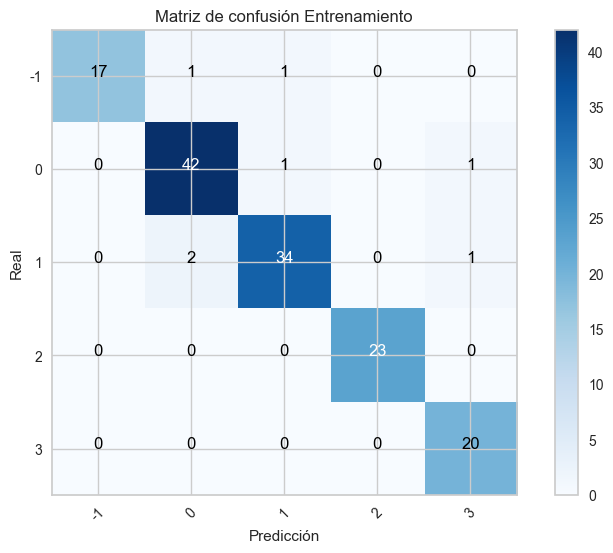

Reporte Prueba
              precision    recall  f1-score   support

          -1       1.00      0.83      0.91         6
           0       0.75      0.91      0.82        23
           1       0.92      0.65      0.76        17
           2       0.62      0.56      0.59         9
           3       0.67      0.86      0.75         7

    accuracy                           0.77        62
   macro avg       0.79      0.76      0.77        62
weighted avg       0.79      0.77      0.77        62



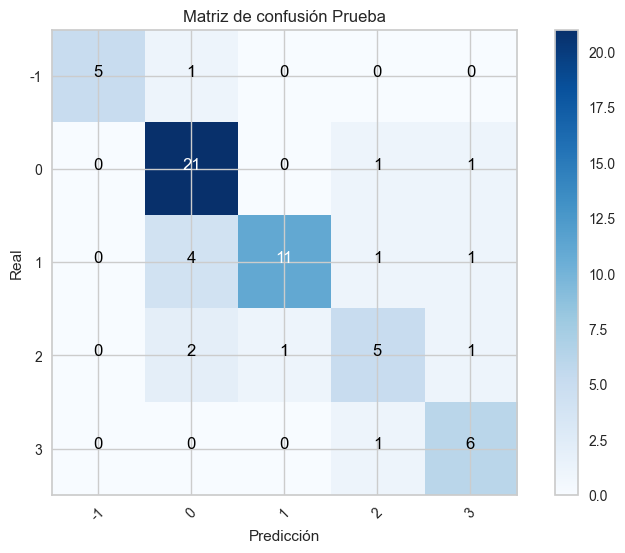

In [176]:
pipeline_rf = make_pipeline(SelectKBest(score_func=f_classif,k=27),
                          RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=1,
                                         min_samples_split=5,
                                         n_estimators=100))
report_and_conf_matrix(pipeline_rf,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

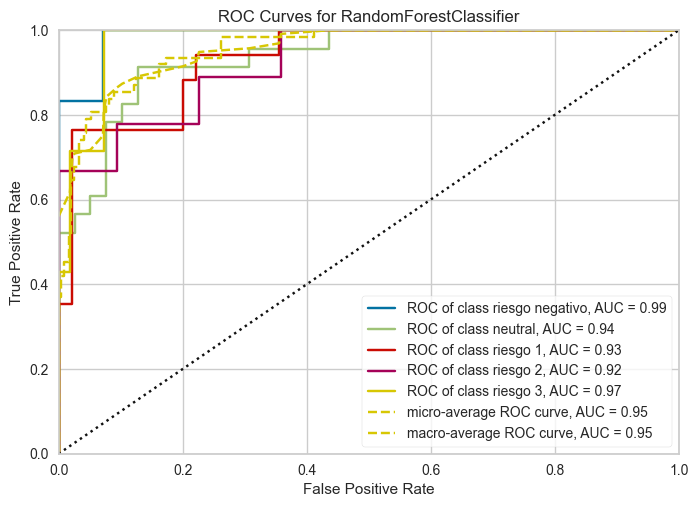

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=31)),
                                 ('randomforestclassifier',
                                  RandomForestClassifier(max_depth=10,
                                                         min_samples_split=5,
                                                         random_state=1234))]))

In [177]:
pipeline_rf = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                          RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=1,
                                         min_samples_split=5,
                                         n_estimators=100))
plot_ROC_curve(pipeline_rf,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

### 7.7. Modelo de Gradient Boosting

Modelo con datos sin PCA

In [178]:

from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier(random_state=1234)

classification_metrics(gb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

gb.fit(X_train['rem'],y_train['rem'])
print(gb.get_params())

Training Accuracy = 1.0
Test Accuracy = 0.9354838709677419
Training Kappa = 1.0
Test Kappa = 0.9130739572379951
Training Precision = [1. 1. 1. 1. 1.]
Test Precision = [1.   0.92 0.94 1.   0.88]
Training recall = [1. 1. 1. 1. 1.]
Test recall = [0.83 0.96 0.88 1.   1.  ]
{'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 1234, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


In [179]:
#Tiempo aproximado: 15m

params = {'learning_rate': [0.01,0.03],
                  'subsample'    : [0.5, 0.2],
                  'n_estimators' : [500,1000],
                  'max_depth'    : [4,6,8]    
            }

tuning_model=GridSearchCV(GradientBoostingClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_train['rem'],y_train['rem'])

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.512 total time=   0.9s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.778 total time=   0.8s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.637 total time=   0.8s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.569 total time=   0.8s
[CV 5/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.770 total time=   0.8s
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.512 total time=   0.7s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.780 total time=   0.6s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.631 total time=   0.6s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_es

KeyboardInterrupt: 

In [ ]:
tuning_model.best_params_

{'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 500, 'subsample': 0.5}

In [ ]:
# El mejor modelo de Gradient Boosting
# Sin PCA
 

gb_clsfr = GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=6, n_estimators=1000,subsample=0.5)

model,metrics = classification_metrics(gb_clsfr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open('models/GradientBoostingClassifierRem.pkl','wb'))
pickle.dump(metrics, open('metrics/GradientBoostingClassifierRemMetrics.pkl','wb'))

Training Accuracy = 1.0
Test Accuracy = 0.9032258064516129
Training Kappa = 1.0
Test Kappa = 0.871280276816609
Training Precision = [1. 1. 1. 1. 1.]
Test Precision = [1.   0.95 0.88 0.8  0.88]
Training recall = [1. 1. 1. 1. 1.]
Test recall = [1.   0.87 0.88 0.89 1.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00        19
           0       1.00      1.00      1.00        44
           1       1.00      1.00      1.00        37
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        20

    accuracy                           1.00       143
   macro avg       1.00      1.00      1.00       143
weighted avg       1.00      1.00      1.00       143



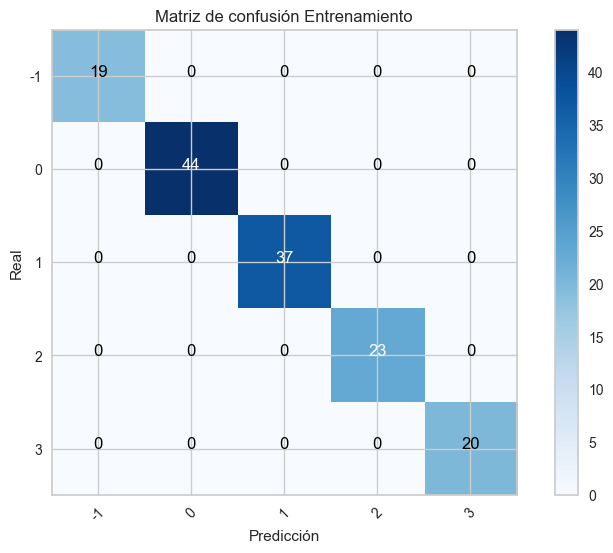

Reporte Prueba
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00         6
           0       0.95      0.87      0.91        23
           1       0.88      0.88      0.88        17
           2       0.80      0.89      0.84         9
           3       0.88      1.00      0.93         7

    accuracy                           0.90        62
   macro avg       0.90      0.93      0.91        62
weighted avg       0.91      0.90      0.90        62



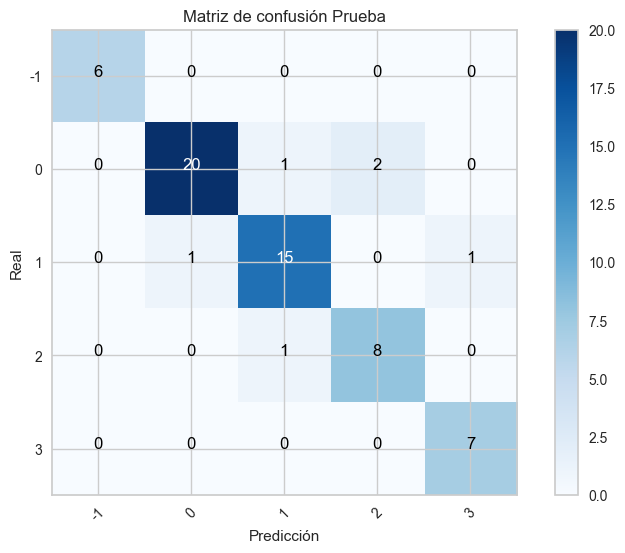

In [ ]:
report_and_conf_matrix(GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=6, n_estimators=1000,subsample=0.5),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

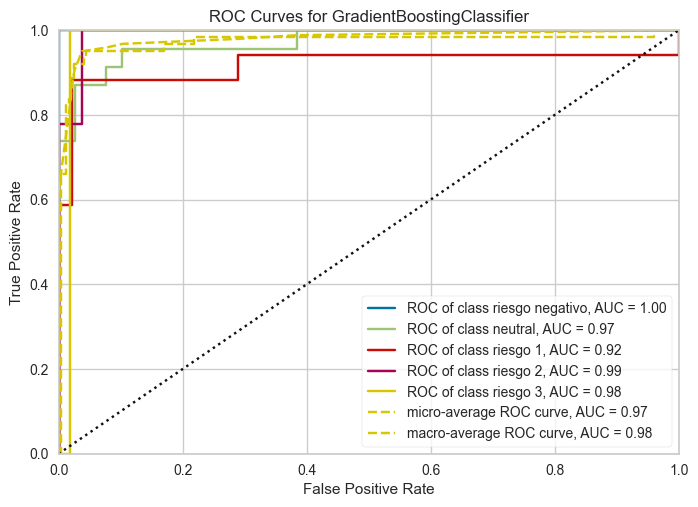

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for GradientBoostingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=GradientBoostingClassifier(learning_rate=0.01, max_depth=6,
                                            n_estimators=1000,
                                            random_state=1234, subsample=0.5))

In [ ]:
plot_ROC_curve(GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=6, n_estimators=1000,subsample=0.5),
                X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Conjunto de datos sin PCA y con feature selection

In [ ]:
#Tiempo aproximado: 13m

params = {'learning_rate': [0.01,0.03],
                  'subsample'    : [0.5, 0.2],
                  'n_estimators' : [500,1000],
                  'max_depth'    : [4,6,8]    
            }

X_t = SelectKBest(score_func=f_classif,k=31).fit_transform(X_train['rem'],y_train['rem'])

tuning_model=GridSearchCV(GradientBoostingClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_t,y_train['rem'])

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.512 total time=   0.8s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.780 total time=   0.8s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.637 total time=   0.8s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.525 total time=   0.8s
[CV 5/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.720 total time=   0.8s
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.515 total time=   0.6s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.780 total time=   0.6s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.584 total time=   0.6s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_es

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=1234),
             param_grid={'learning_rate': [0.01, 0.03], 'max_depth': [4, 6, 8],
                         'n_estimators': [500, 1000], 'subsample': [0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score), verbose=3)

In [ ]:
tuning_model.best_params_

{'learning_rate': 0.03, 'max_depth': 8, 'n_estimators': 1000, 'subsample': 0.5}

In [ ]:
# El mejor modelo de Gradient Boosting sin PCA
# Con feature selection


pipeline_gb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                           GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=6, n_estimators=1000,subsample=0.5))

model,metrics = classification_metrics(pipeline_gb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open('models/GradientBoostingClassifierRemFS.pkl','wb'))
pickle.dump(metrics, open('metrics/GradientBoostingClassifierRemFSMetrics.pkl','wb'))

Training Accuracy = 1.0
Test Accuracy = 0.9193548387096774
Training Kappa = 1.0
Test Kappa = 0.89221140472879
Training Precision = [1. 1. 1. 1. 1.]
Test Precision = [1.   0.95 0.88 0.89 0.88]
Training recall = [1. 1. 1. 1. 1.]
Test recall = [1.   0.91 0.88 0.89 1.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00        19
           0       1.00      1.00      1.00        44
           1       1.00      1.00      1.00        37
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        20

    accuracy                           1.00       143
   macro avg       1.00      1.00      1.00       143
weighted avg       1.00      1.00      1.00       143



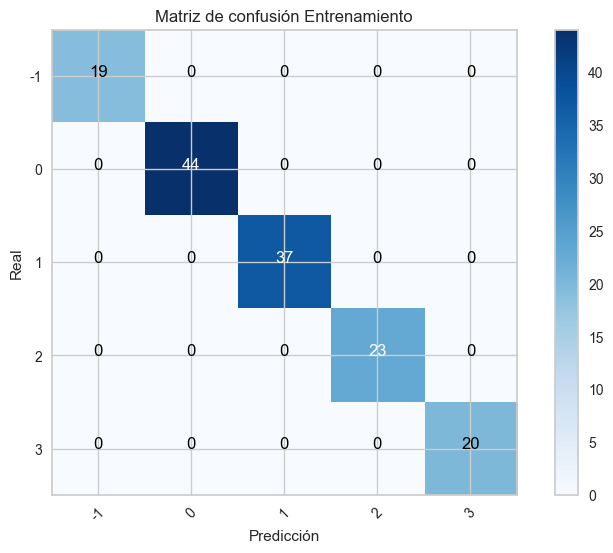

Reporte Prueba
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00         6
           0       0.95      0.91      0.93        23
           1       0.88      0.88      0.88        17
           2       0.89      0.89      0.89         9
           3       0.88      1.00      0.93         7

    accuracy                           0.92        62
   macro avg       0.92      0.94      0.93        62
weighted avg       0.92      0.92      0.92        62



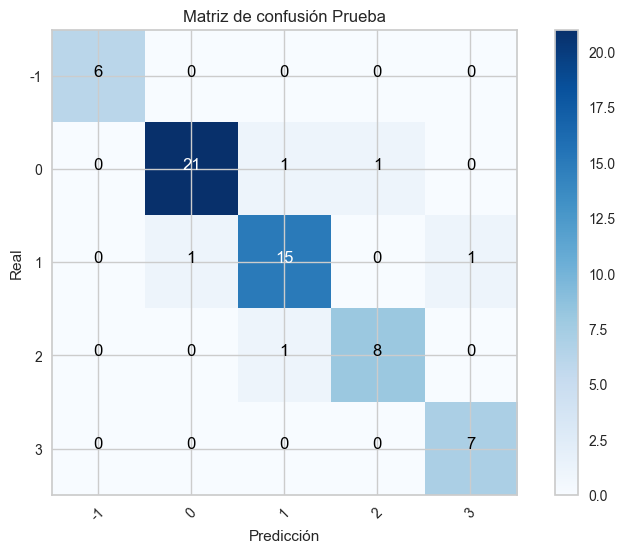

In [ ]:
pipeline_gb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                           GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=6, n_estimators=1000,subsample=0.5))
report_and_conf_matrix(pipeline_gb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

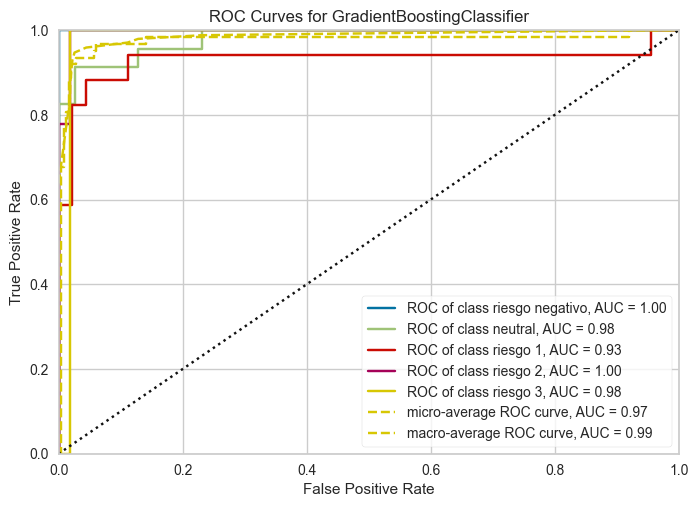

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for GradientBoostingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=31)),
                                 ('gradientboostingclassifier',
                                  GradientBoostingClassifier(learning_rate=0.01,
                                                             max_depth=6,
                                                             n_estimators=1000,
                                                             random_state=1234,
                                                             subsample=0.5))]))

In [ ]:
pipeline_gb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                           GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=6, n_estimators=1000,subsample=0.5))
plot_ROC_curve(pipeline_gb,X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

Modelo con PCA

In [ ]:
#Tiempo aproximado: 17m

params = {'learning_rate': [0.01,0.03],
                  'subsample'    : [0.5, 0.2],
                  'n_estimators' : [500,1000],
                  'max_depth'    : [4,6,8]    
            }

tuning_model=GridSearchCV(GradientBoostingClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_train['pca_rem'],y_train['pca_rem'])

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.429 total time=   0.8s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.694 total time=   0.8s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.643 total time=   0.8s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.474 total time=   0.8s
[CV 5/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.724 total time=   0.8s
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.422 total time=   0.6s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.645 total time=   0.6s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.590 total time=   0.6s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_es

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=1234),
             param_grid={'learning_rate': [0.01, 0.03], 'max_depth': [4, 6, 8],
                         'n_estimators': [500, 1000], 'subsample': [0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score), verbose=3)

In [ ]:
tuning_model.best_params_

{'learning_rate': 0.03, 'max_depth': 6, 'n_estimators': 500, 'subsample': 0.2}

In [ ]:
# El mejor modelo de Gradient Boosting
# Con PCA
 

gb_clsfr = GradientBoostingClassifier(random_state=1234,learning_rate=0.03, 
                                      max_depth=4, n_estimators=1000,subsample=0.5)

model,metrics = classification_metrics(gb_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open('models/GradientBoostingClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open('metrics/GradientBoostingClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 1.0
Test Accuracy = 0.8225806451612904
Training Kappa = 1.0
Test Kappa = 0.7613715885234429
Training Precision = [1. 1. 1. 1. 1.]
Test Precision = [1.   0.8  0.86 0.78 0.75]
Training recall = [1. 1. 1. 1. 1.]
Test recall = [1.   0.87 0.71 0.78 0.86]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00        19
           0       1.00      1.00      1.00        44
           1       1.00      1.00      1.00        37
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        20

    accuracy                           1.00       143
   macro avg       1.00      1.00      1.00       143
weighted avg       1.00      1.00      1.00       143



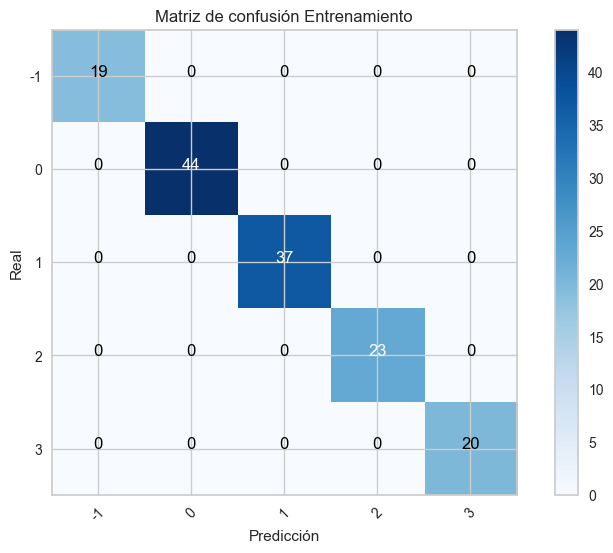

Reporte Prueba
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00         6
           0       0.80      0.87      0.83        23
           1       0.86      0.71      0.77        17
           2       0.78      0.78      0.78         9
           3       0.75      0.86      0.80         7

    accuracy                           0.82        62
   macro avg       0.84      0.84      0.84        62
weighted avg       0.83      0.82      0.82        62



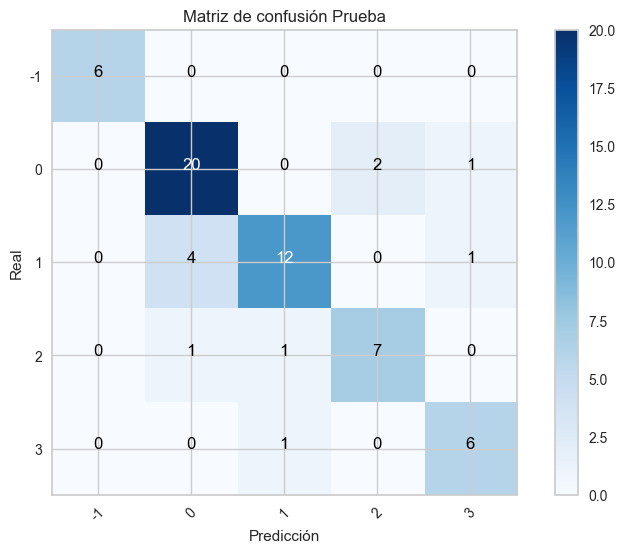

In [ ]:
report_and_conf_matrix(GradientBoostingClassifier(random_state=1234,learning_rate=0.03, 
                                      max_depth=4, n_estimators=1000,subsample=0.5),
                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

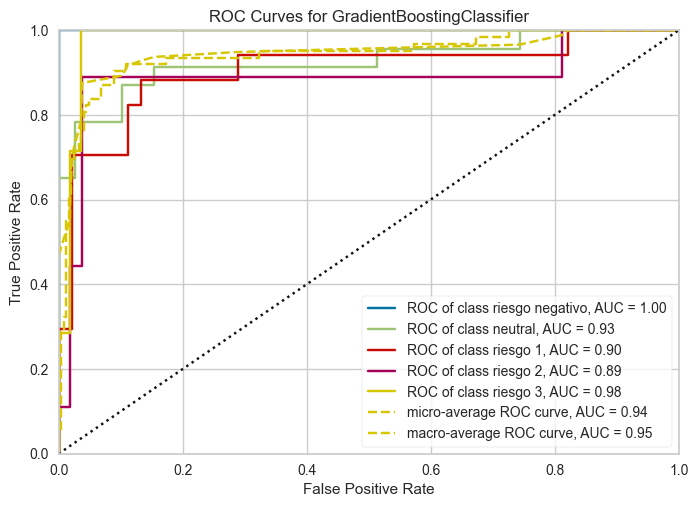

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for GradientBoostingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=GradientBoostingClassifier(learning_rate=0.03, max_depth=4,
                                            n_estimators=1000,
                                            random_state=1234, subsample=0.5))

In [ ]:
plot_ROC_curve(GradientBoostingClassifier(random_state=1234,learning_rate=0.03, 
                                      max_depth=4, n_estimators=1000,subsample=0.5),
                X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

Modelo con PCA y feature selection

In [ ]:
#Tiempo aproximado: 70m

params = {'learning_rate': [0.01,0.03],
                  'subsample'    : [0.5, 0.2],
                  'n_estimators' : [500,1000],
                  'max_depth'    : [4,6,8]    
            }

X_t = SelectKBest(score_func=f_classif,k=31).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

tuning_model=GridSearchCV(GradientBoostingClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_t,y_train['pca_rem'])

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.381 total time=   0.7s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.694 total time=   0.7s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.643 total time=   0.7s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.474 total time=   0.7s
[CV 5/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.771 total time=   0.7s
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.291 total time=   0.6s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.645 total time=   0.6s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.590 total time=   0.6s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_es

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=1234),
             param_grid={'learning_rate': [0.01, 0.03], 'max_depth': [4, 6, 8],
                         'n_estimators': [500, 1000], 'subsample': [0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score), verbose=3)

In [ ]:
tuning_model.best_params_

{'learning_rate': 0.03, 'max_depth': 4, 'n_estimators': 500, 'subsample': 0.5}

In [ ]:
# El mejor modelo de Gradient Boosting
# Con PCA y feature selection
 
X_t = SelectKBest(score_func=f_classif,k=27).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

gb_clsfr = GradientBoostingClassifier(random_state=1234,learning_rate=0.03, 
                                      max_depth=4, n_estimators=500,subsample=0.5)

model,metrics = classification_metrics(gb_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open('models/GradientBoostingClassifierPCARemFS.pkl','wb'))
pickle.dump(metrics, open('metrics/GradientBoostingClassifierPCARemFSMetrics.pkl','wb'))

Training Accuracy = 1.0
Test Accuracy = 0.8064516129032258
Training Kappa = 1.0
Test Kappa = 0.7383966244725739
Training Precision = [1. 1. 1. 1. 1.]
Test Precision = [1.   0.77 0.86 0.75 0.75]
Training recall = [1. 1. 1. 1. 1.]
Test recall = [1.   0.87 0.71 0.67 0.86]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00        19
           0       1.00      1.00      1.00        44
           1       1.00      1.00      1.00        37
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        20

    accuracy                           1.00       143
   macro avg       1.00      1.00      1.00       143
weighted avg       1.00      1.00      1.00       143



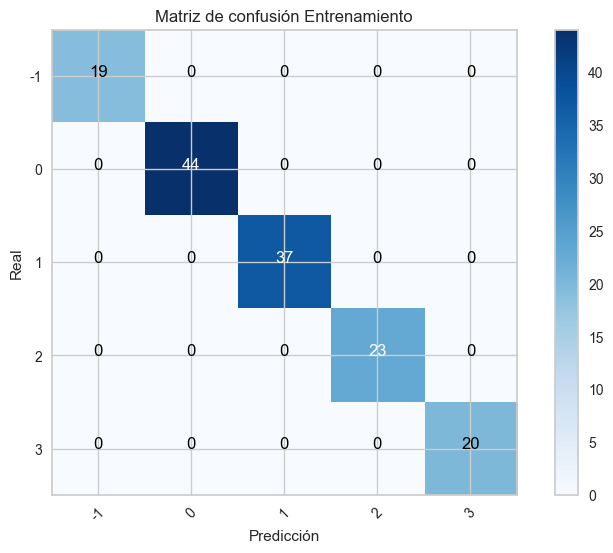

Reporte Prueba
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00         6
           0       0.78      0.91      0.84        23
           1       0.86      0.71      0.77        17
           2       0.86      0.67      0.75         9
           3       0.75      0.86      0.80         7

    accuracy                           0.82        62
   macro avg       0.85      0.83      0.83        62
weighted avg       0.83      0.82      0.82        62



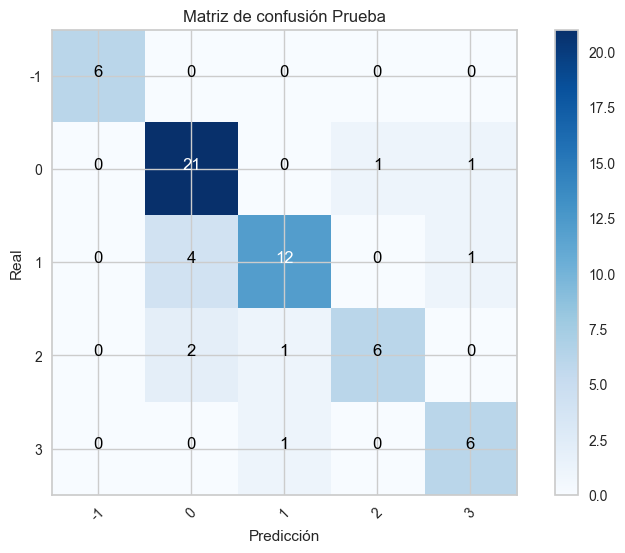

In [ ]:
pipeline_gb = make_pipeline(SelectKBest(score_func=f_classif,k=27),
                           GradientBoostingClassifier(random_state=1234,learning_rate=0.03, 
                                      max_depth=4, n_estimators=500,subsample=0.5))
report_and_conf_matrix(pipeline_gb,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

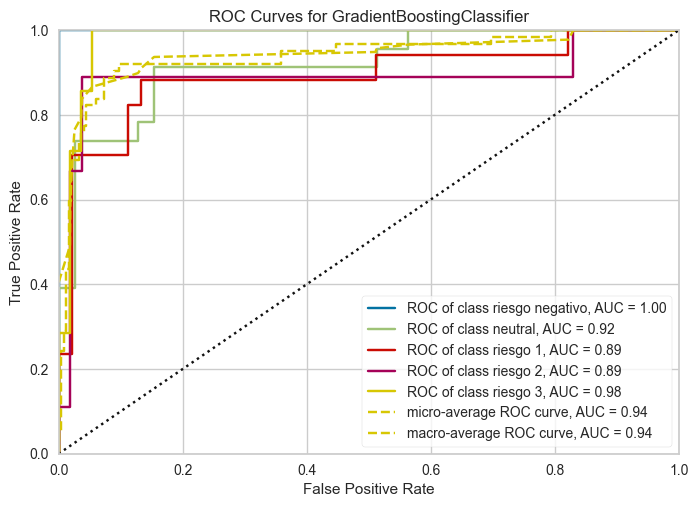

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for GradientBoostingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'-1': 'riesgo negativo', '0': 'neutral', '1': 'riesgo 1',
                '2': 'riesgo 2', '3': 'riesgo 3'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=27)),
                                 ('gradientboostingclassifier',
                                  GradientBoostingClassifier(learning_rate=0.03,
                                                             max_depth=4,
                                                             n_estimators=500,
                                                             random_state=1234,
                                                             subsample=0.5))]))

In [ ]:
pipeline_gb = make_pipeline(SelectKBest(score_func=f_classif,k=27),
                           GradientBoostingClassifier(random_state=1234,learning_rate=0.03, 
                                      max_depth=4, n_estimators=500,subsample=0.5))
plot_ROC_curve(pipeline_gb,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

### 7.8. Modelo de XGBoost

In [ ]:
y_train['rem']['symboling'].unique()

array(['0', '-1', '1', '3', '2'], dtype=object)

Conjunto de datos sin PCA

In [ ]:
# Tiempo aproximado: 7m

import xgboost as xgb

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train['rem'] = le.fit_transform(y_train['rem'])
y_test['rem'] = le.transform(y_test['rem'])

params = {'learning_rate': [0.03,0.3],
                  'subsample'    : [1, 0.5, 0.2],
                  'n_estimators' : [100,500,1000],
                  'max_depth'    : [None,5,7]    
            }

tuning_model=GridSearchCV(xgb.XGBClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_train['rem'],y_train['rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.474 total time=   0.3s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.691 total time=   0.2s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.724 total time=   0.2s
[CV 4/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.479 total time=   0.2s
[CV 5/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.765 total time=   0.2s
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.423 total time=   0.1s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.734 total time=   0.1s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.678 total time=   0.2s
[CV 4/5] END learning_rate=0.03, max

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=1234, ...),
             param_grid={'learning_rate': [0.03, 0.3],
                         'max_depth': [None, 5, 7],
                         'n_estimators': [100, 500, 1000],
                         'subsample': [1, 0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score), verbose=3)

In [ ]:
xgb_clsfr = xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.3,
                               max_depth=None,
                               n_estimators=500,
                               subsample=1)

model,metrics = classification_metrics(xgb_clsfr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open('models/XGBoostClassifierRem.pkl','wb'))
pickle.dump(metrics, open('metrics/XGBoostClassifierRemMetrics.pkl','wb'))

Training Accuracy = 1.0
Test Accuracy = 0.7741935483870968
Training Kappa = 1.0
Test Kappa = 0.7020254033642293
Training Precision = [0. 1. 1. 1. 1.]
Test Precision = [0.   0.71 0.84 0.72 0.7 ]
Training recall = [0. 1. 1. 1. 1.]
Test recall = [0.   0.83 0.7  0.76 0.78]


In [ ]:
def plot_ROC_curve_xgb(model, X_train, y_train, X_test, y_test):
    visualizer = ROCAUC(model, encoder={0: 'riesgo negativo',
                                        1: 'neutral', 
                                        2: 'riesgo 1', 
                                        3: 'riesgo 2',
                                        4: 'riesgo 3'})                                    
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test, y_test)
    visualizer.show()
    
    return visualizer

In [ ]:
tuning_model.best_params_

{'learning_rate': 0.03, 'max_depth': 5, 'n_estimators': 500, 'subsample': 1}

Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00        19
           0       1.00      1.00      1.00        44
           1       1.00      1.00      1.00        37
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        20

    accuracy                           1.00       143
   macro avg       1.00      1.00      1.00       143
weighted avg       1.00      1.00      1.00       143



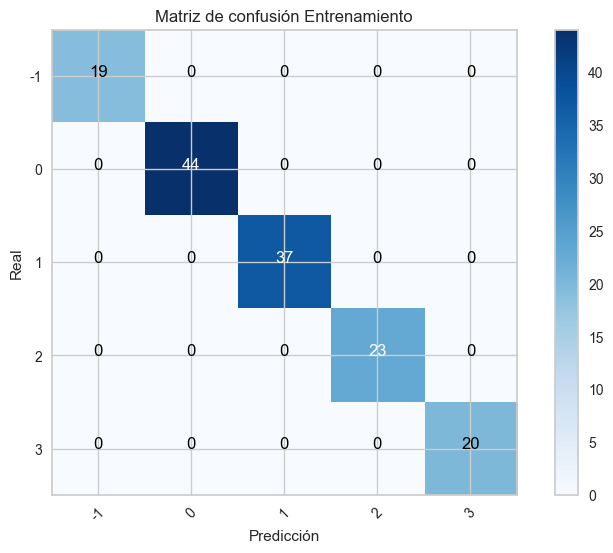

Reporte Prueba
              precision    recall  f1-score   support

          -1       0.71      0.83      0.77         6
           0       0.84      0.70      0.76        23
           1       0.72      0.76      0.74        17
           2       0.70      0.78      0.74         9
           3       0.88      1.00      0.93         7

    accuracy                           0.77        62
   macro avg       0.77      0.81      0.79        62
weighted avg       0.78      0.77      0.77        62



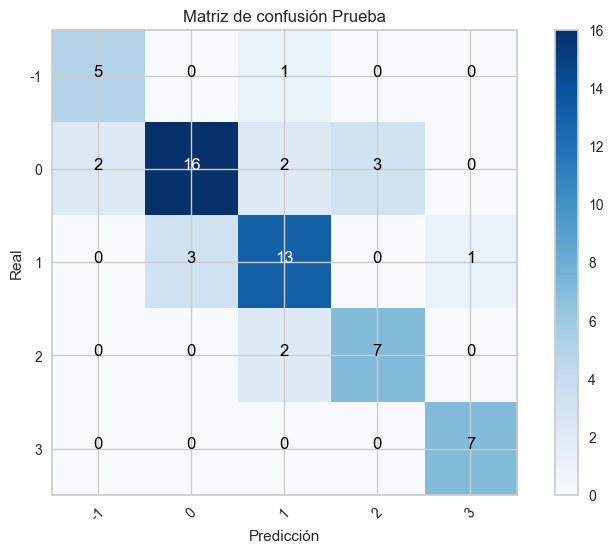

In [ ]:
report_and_conf_matrix(xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.3,
                               max_depth=None,
                               n_estimators=500,
                               subsample=1),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

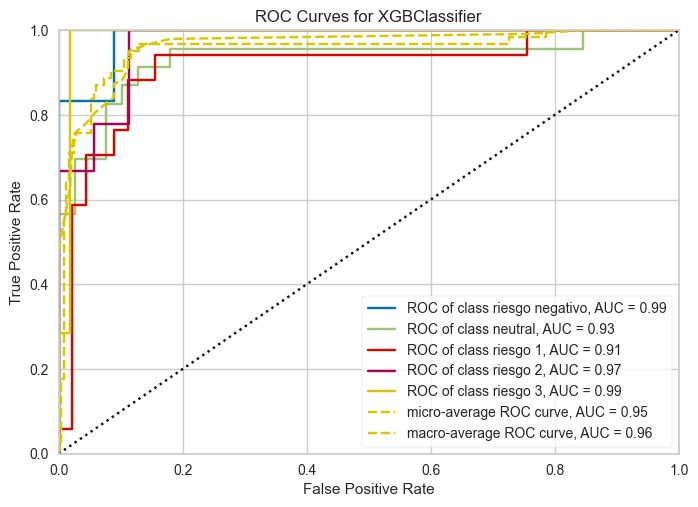

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={0: 'riesgo negativo', 1: 'neutral', 2: 'riesgo 1',
                3: 'riesgo 2', 4: 'riesgo 3'},
       estimator=XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               earl...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.3,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=500, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi:softprob', ...))

In [ ]:
plot_ROC_curve_xgb(xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.3,
                               max_depth=None,
                               n_estimators=500,
                               subsample=1),
                X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Conjunto de datos sin PCA y feature selection

In [ ]:
# Tiempo aproximado: 7m

le = LabelEncoder()
y_train['rem'] = le.fit_transform(y_train['rem'])
y_test['rem'] = le.transform(y_test['rem'])

params = {'learning_rate': [0.03,0.3],
                  'subsample'    : [1, 0.5, 0.2],
                  'n_estimators' : [100,500,1000],
                  'max_depth'    : [None,5,7]    
            }

X_t = SelectKBest(score_func=f_classif,k=31).fit_transform(X_train['rem'],y_train['rem'])

tuning_model=GridSearchCV(xgb.XGBClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_t,y_train['rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.432 total time=   0.3s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.650 total time=   0.2s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.771 total time=   0.2s
[CV 4/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.482 total time=   0.2s
[CV 5/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.765 total time=   0.2s
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.470 total time=   0.2s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.734 total time=   0.1s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.678 total time=   0.1s
[CV 4/5] END learning_rate=0.03, max

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=1234, ...),
             param_grid={'learning_rate': [0.03, 0.3],
                         'max_depth': [None, 5, 7],
                         'n_estimators': [100, 500, 1000],
                         'subsample': [1, 0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score), verbose=3)

In [ ]:
tuning_model.best_params_

{'learning_rate': 0.3, 'max_depth': 7, 'n_estimators': 1000, 'subsample': 1}

In [ ]:

pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=None,
                               n_estimators=500,
                               subsample=1))

model,metrics = classification_metrics(pipeline_xgb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open('models/XGBoostClassifierRemFS.pkl','wb'))
pickle.dump(metrics, open('metrics/XGBoostClassifierRemFSMetrics.pkl','wb'))

Training Accuracy = 1.0
Test Accuracy = 0.8225806451612904
Training Kappa = 1.0
Test Kappa = 0.7622036262203626
Training Precision = [0. 1. 1. 1. 1.]
Test Precision = [0.   0.83 0.86 0.72 0.88]
Training recall = [0. 1. 1. 1. 1.]
Test recall = [0.   0.83 0.83 0.76 0.78]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00        19
           0       1.00      1.00      1.00        44
           1       1.00      1.00      1.00        37
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        20

    accuracy                           1.00       143
   macro avg       1.00      1.00      1.00       143
weighted avg       1.00      1.00      1.00       143



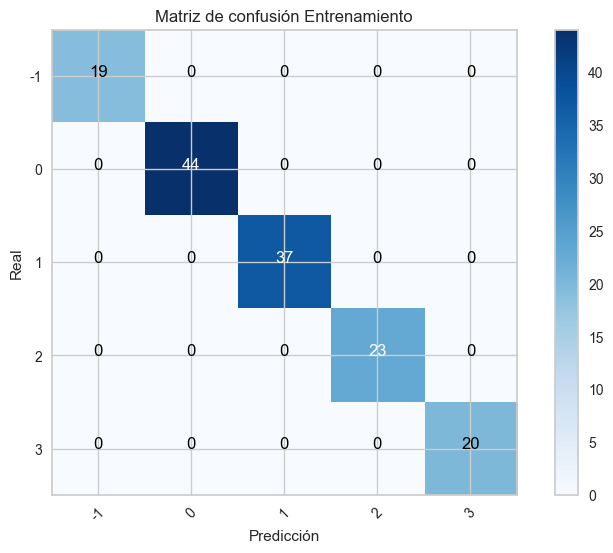

Reporte Prueba
              precision    recall  f1-score   support

          -1       0.83      0.83      0.83         6
           0       0.86      0.83      0.84        23
           1       0.72      0.76      0.74        17
           2       0.88      0.78      0.82         9
           3       0.88      1.00      0.93         7

    accuracy                           0.82        62
   macro avg       0.83      0.84      0.84        62
weighted avg       0.82      0.82      0.82        62



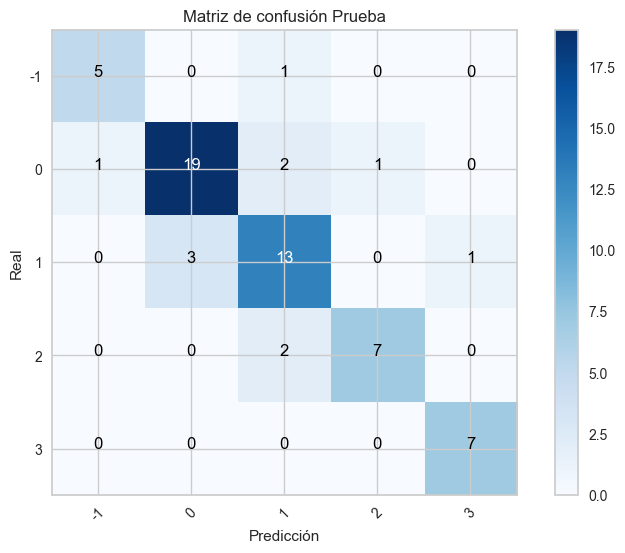

In [ ]:
pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=None,
                               n_estimators=500,
                               subsample=1))

report_and_conf_matrix(pipeline_xgb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

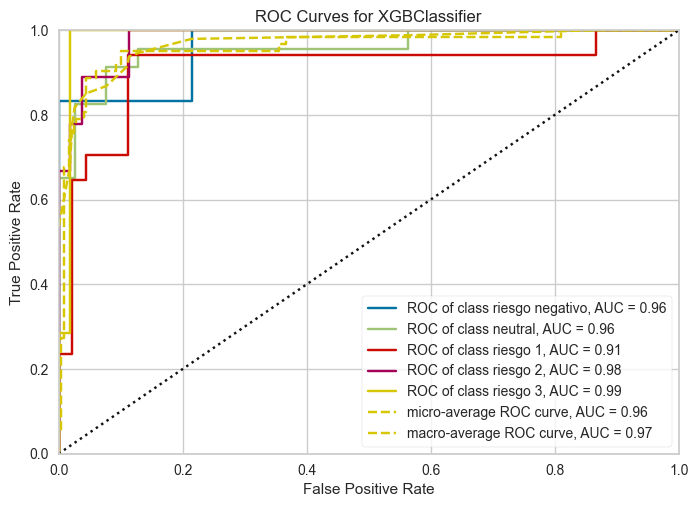

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={0: 'riesgo negativo', 1: 'neutral', 2: 'riesgo 1',
                3: 'riesgo 2', 4: 'riesgo 3'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=31)),
                                 ('xgbclassifier',
                                  XGBClassifier(base_score=None, booster=None,
                                                callbacks=None,
                                                colsample_byleve...
                                                grow_policy=None,
                                                importance_type=None,
                                                interaction_constraints=None,
                                                learning_rate=0.03,
                                                max_bin=None,
                                                max_cat_threshold=None,
                                                max_cat_to_onehot=None,
                                                max_delta_step=None,
                                                max_depth=None, max_leaves=None,
                                                min_child_weight=None,
                                                missing=nan,
                                                monotone_constraints=None,
                                                multi_strategy=None,
                                                n_estimators=500, n_jobs=None,
                                                num_parallel_tree=None,
                                                objective='multi:softprob', ...))]))

In [ ]:
pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=None,
                               n_estimators=500,
                               subsample=1))

plot_ROC_curve_xgb(pipeline_xgb,X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Conjunto de datos con PCA

In [ ]:
# Tiempo aproximado: 6m

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train['pca_rem'] = le.fit_transform(y_train['pca_rem'])
y_test['pca_rem'] = le.transform(y_test['pca_rem'])

params = {'learning_rate': [0.03,0.3],
                  'subsample'    : [1, 0.5, 0.2],
                  'n_estimators' : [100,500,1000],
                  'max_depth'    : [None,5,7]    
            }

tuning_model=GridSearchCV(xgb.XGBClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_train['pca_rem'],y_train['pca_rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.426 total time=   0.3s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.607 total time=   0.2s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.597 total time=   0.2s
[CV 4/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.426 total time=   0.3s
[CV 5/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.861 total time=   0.2s
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.511 total time=   0.1s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.606 total time=   0.1s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.593 total time=   0.1s
[CV 4/5] END learning_rate=0.03, max

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=1234, ...),
             param_grid={'learning_rate': [0.03, 0.3],
                         'max_depth': [None, 5, 7],
                         'n_estimators': [100, 500, 1000],
                         'subsample': [1, 0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score), verbose=3)

In [ ]:
tuning_model.best_params_

{'learning_rate': 0.03, 'max_depth': 7, 'n_estimators': 1000, 'subsample': 1}

In [ ]:
xgb_clsfr = xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.3,
                               max_depth=7,
                               n_estimators=1000,
                               subsample=1)

model,metrics = classification_metrics(xgb_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open('models/XGBoostClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open('metrics/XGBoostClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 1.0
Test Accuracy = 0.6935483870967742
Training Kappa = 1.0
Test Kappa = 0.5901183020180933
Training Precision = [0. 1. 1. 1. 1.]
Test Precision = [0.   0.62 0.68 0.77 0.71]
Training recall = [0. 1. 1. 1. 1.]
Test recall = [0.   0.83 0.74 0.59 0.56]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00        19
           0       1.00      1.00      1.00        44
           1       1.00      1.00      1.00        37
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        20

    accuracy                           1.00       143
   macro avg       1.00      1.00      1.00       143
weighted avg       1.00      1.00      1.00       143



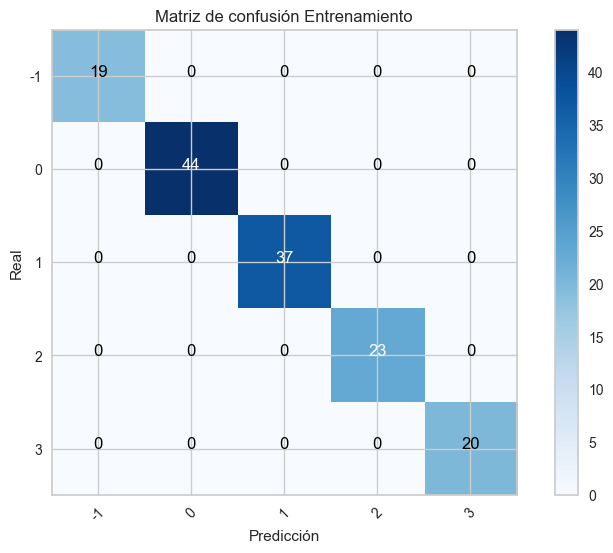

Reporte Prueba
              precision    recall  f1-score   support

          -1       0.62      0.83      0.71         6
           0       0.68      0.74      0.71        23
           1       0.77      0.59      0.67        17
           2       0.71      0.56      0.63         9
           3       0.67      0.86      0.75         7

    accuracy                           0.69        62
   macro avg       0.69      0.71      0.69        62
weighted avg       0.70      0.69      0.69        62



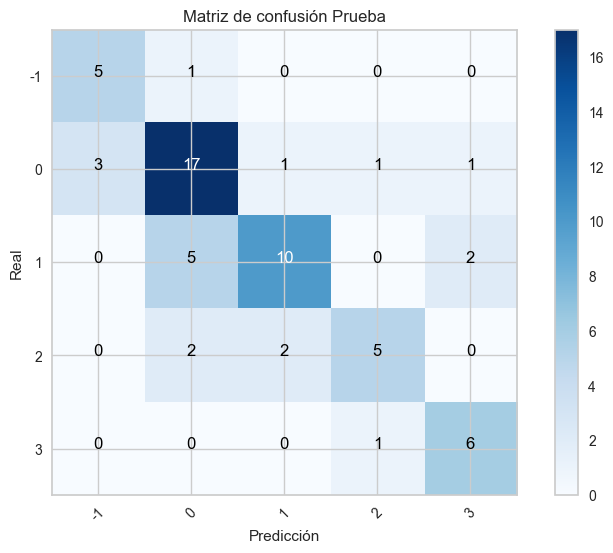

In [ ]:
report_and_conf_matrix(xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.3,
                               max_depth=7,
                               n_estimators=1000,
                               subsample=1),
                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

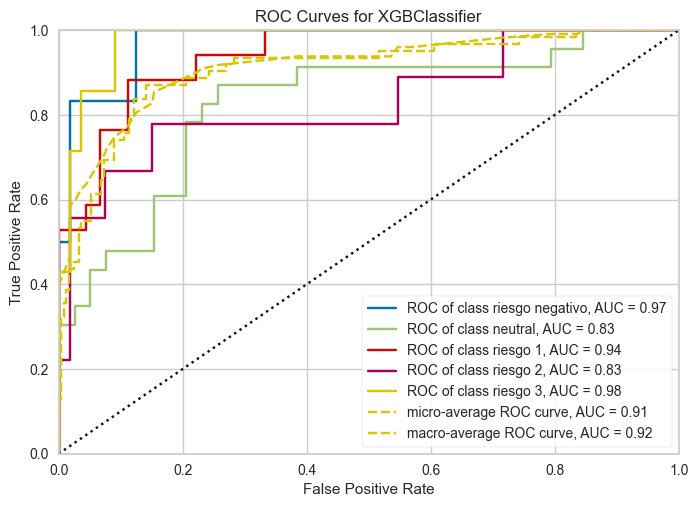

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={0: 'riesgo negativo', 1: 'neutral', 2: 'riesgo 1',
                3: 'riesgo 2', 4: 'riesgo 3'},
       estimator=XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               earl...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.3,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=7, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=1000, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi:softprob', ...))

In [ ]:
plot_ROC_curve_xgb(xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.3,
                               max_depth=7,
                               n_estimators=1000,
                               subsample=1),
                X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

Conjunto de datos con PCA y feature selection

In [ ]:
# Tiempo aproximado: 9m

params = {'learning_rate': [0.03,0.3],
                  'subsample'    : [1, 0.5, 0.2],
                  'n_estimators' : [100,500,1000],
                  'max_depth'    : [None,5,7]    
            }

X_t = SelectKBest(score_func=f_classif,k=27).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

tuning_model=GridSearchCV(xgb.XGBClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_t,y_train['pca_rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.380 total time=   0.2s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.607 total time=   0.2s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.645 total time=   0.2s
[CV 4/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.426 total time=   0.2s
[CV 5/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.813 total time=   0.2s
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.559 total time=   0.3s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.606 total time=   0.2s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.593 total time=   0.1s
[CV 4/5] END learning_rate=0.03, max

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=1234, ...),
             param_grid={'learning_rate': [0.03, 0.3],
                         'max_depth': [None, 5, 7],
                         'n_estimators': [100, 500, 1000],
                         'subsample': [1, 0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score), verbose=3)

In [ ]:
tuning_model.best_params_

{'learning_rate': 0.03, 'max_depth': 7, 'n_estimators': 1000, 'subsample': 1}

In [ ]:
pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=27),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=7,
                               n_estimators=1000,
                               subsample=1))

model,metrics = classification_metrics(pipeline_xgb,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open('models/XGBoostClassifierPCARemFS.pkl','wb'))
pickle.dump(metrics, open('metrics/XGBoostClassifierPCARemFSMetrics.pkl','wb'))

Training Accuracy = 1.0
Test Accuracy = 0.6612903225806451
Training Kappa = 1.0
Test Kappa = 0.5501036627505183
Training Precision = [0. 1. 1. 1. 1.]
Test Precision = [0.   0.5  0.62 0.77 0.83]
Training recall = [0. 1. 1. 1. 1.]
Test recall = [0.   0.83 0.65 0.59 0.56]


Reporte Entrenamiento
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00        19
           0       1.00      1.00      1.00        44
           1       1.00      1.00      1.00        37
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        20

    accuracy                           1.00       143
   macro avg       1.00      1.00      1.00       143
weighted avg       1.00      1.00      1.00       143



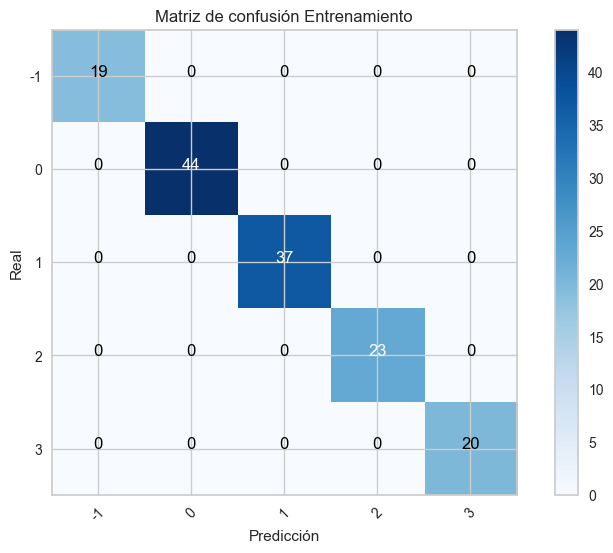

Reporte Prueba
              precision    recall  f1-score   support

          -1       0.50      0.83      0.62         6
           0       0.62      0.65      0.64        23
           1       0.77      0.59      0.67        17
           2       0.83      0.56      0.67         9
           3       0.67      0.86      0.75         7

    accuracy                           0.66        62
   macro avg       0.68      0.70      0.67        62
weighted avg       0.69      0.66      0.66        62



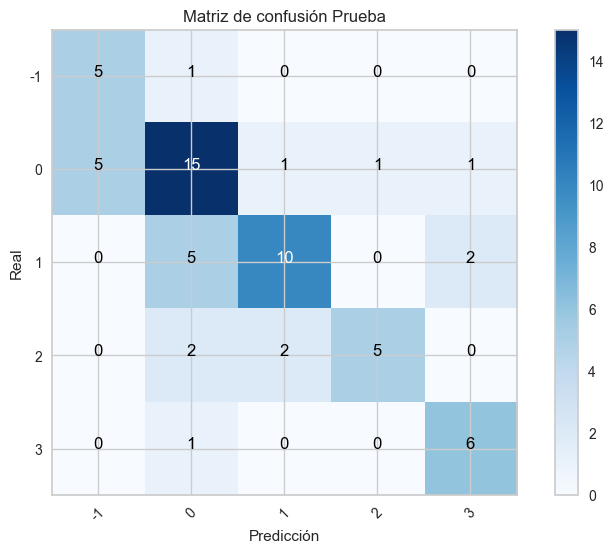

In [ ]:
pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=27),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=7,
                               n_estimators=1000,
                               subsample=1))

report_and_conf_matrix(pipeline_xgb,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

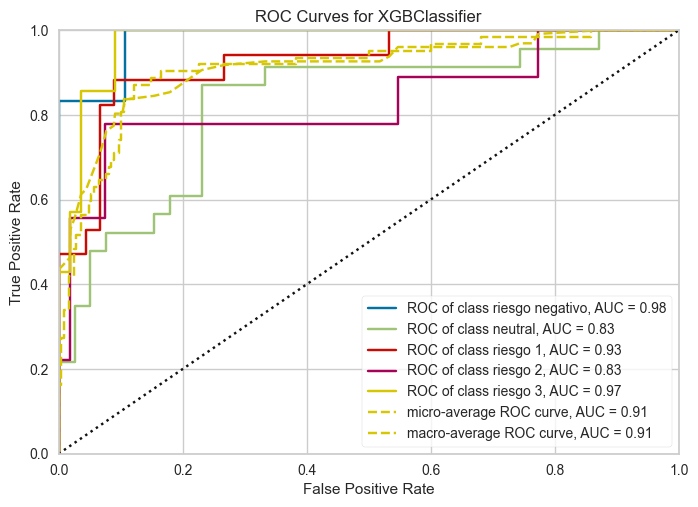

ROCAUC(ax=<AxesSubplot: title={'center': 'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={0: 'riesgo negativo', 1: 'neutral', 2: 'riesgo 1',
                3: 'riesgo 2', 4: 'riesgo 3'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=27)),
                                 ('xgbclassifier',
                                  XGBClassifier(base_score=None, booster=None,
                                                callbacks=None,
                                                colsample_byleve...
                                                grow_policy=None,
                                                importance_type=None,
                                                interaction_constraints=None,
                                                learning_rate=0.03,
                                                max_bin=None,
                                                max_cat_threshold=None,
                                                max_cat_to_onehot=None,
                                                max_delta_step=None,
                                                max_depth=7, max_leaves=None,
                                                min_child_weight=None,
                                                missing=nan,
                                                monotone_constraints=None,
                                                multi_strategy=None,
                                                n_estimators=1000, n_jobs=None,
                                                num_parallel_tree=None,
                                                objective='multi:softprob', ...))]))

In [ ]:
pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=27),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=7,
                               n_estimators=1000,
                               subsample=1))

plot_ROC_curve_xgb(pipeline_xgb,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

### 8. Comparación de los distintos modelos

Cargamos las métricas de los modelos previamente guardados 

In [ ]:
metrics = list()
names = list()
metrics.append(pickle.load(open('metrics/logisticRegressionRemMetrics.pkl','rb')))
names.append('logisticRegressionRemMetrics')
metrics.append(pickle.load(open('metrics/logisticRegressionRemFSMetrics.pkl','rb')))
names.append('logisticRegressionRemFSMetrics')
metrics.append(pickle.load(open('metrics/logisticRegressionPCARemMetrics.pkl','rb')))
names.append('logisticRegressionPCARemMetrics')
metrics.append(pickle.load(open('metrics/logisticRegressionPCARemFSMetrics.pkl','rb')))
names.append('logisticRegressionPCARemFSMetrics')
metrics.append(pickle.load(open('metrics/KnnClassifierRemMetrics.pkl','rb')))
names.append('KnnClassifierRemMetrics')
metrics.append(pickle.load(open('metrics/KnnClassifierPCARemMetrics.pkl','rb')))
names.append('KnnClassifiePCARemMetrics')
metrics.append(pickle.load(open('metrics/NBClassifierRemMetrics.pkl','rb')))
names.append('NBClassifierRemMetrics')
metrics.append(pickle.load(open('metrics/NBClassifierRemFSMetrics.pkl','rb')))
names.append('NBClassifierRemFSMetrics')
metrics.append(pickle.load(open('metrics/NBClassifierPCARemMetrics.pkl','rb')))
names.append('NBClassifierPCARemMetrics')
metrics.append(pickle.load(open('metrics/NBClassifierPCARemFSMetrics.pkl','rb')))
names.append('NBClassifierPCARemFSMetrics')
metrics.append(pickle.load(open('metrics/DecisionTreeClassifierRemMetrics.pkl','rb')))
names.append('DecisionTreeClassifierRemMetrics')
metrics.append(pickle.load(open('metrics/DecisionTreeClassifierRemFSMetrics.pkl','rb')))
names.append('DecisionTreeClassifierRemFSMetrics')
metrics.append(pickle.load(open('metrics/DecisionTreeClassifierPCARemMetrics.pkl','rb')))
names.append('DecisionTreeClassifierPCARemMetrics')
metrics.append(pickle.load(open('metrics/DecisionTreeClassifierPCARemFSMetrics.pkl','rb')))
names.append('DecisionTreeClassifierPCARemFSMetrics')
metrics.append(pickle.load(open('metrics/RandomForestClassifierRemMetrics.pkl','rb')))
names.append('RandomForestClassifierRemMetrics')
metrics.append(pickle.load(open('metrics/RandomForestClassifierRemFSMetrics.pkl','rb')))
names.append('RandomForestClassifierRemFSMetrics')
metrics.append(pickle.load(open('metrics/RandomForestClassifierPCARemMetrics.pkl','rb')))
names.append('RandomForestClassifierPCARemMetrics')
metrics.append(pickle.load(open('metrics/RandomForestClassifierPCARemFSMetrics.pkl','rb')))
names.append('RandomForestClassifierPCARemFSMetrics')
metrics.append(pickle.load(open('metrics/GradientBoostingClassifierRemMetrics.pkl','rb')))
names.append('GradientBoostingClassifierRemMetrics')
metrics.append(pickle.load(open('metrics/GradientBoostingClassifierRemFSMetrics.pkl','rb')))
names.append('GradientBoostingClassifierRemFSMetrics')
metrics.append(pickle.load(open('metrics/GradientBoostingClassifierPCARemMetrics.pkl','rb')))
names.append('GradientBoostingClassifierPCARemMetrics')
metrics.append(pickle.load(open('metrics/GradientBoostingClassifierPCARemFSMetrics.pkl','rb')))
names.append('GradientBoostingClassifierPCARemFSMetrics')
metrics.append(pickle.load(open('metrics/XGBoostClassifierRemMetrics.pkl','rb')))
names.append('XGBoostClassifierRemMetrics')
metrics.append(pickle.load(open('metrics/XGBoostClassifierRemFSMetrics.pkl','rb')))
names.append('XGBoostClassifierRemFSMetrics')
metrics.append(pickle.load(open('metrics/XGBoostClassifierPCARemMetrics.pkl','rb')))
names.append('XGBoostClassifierPCARemMetrics')
metrics.append(pickle.load(open('metrics/XGBoostClassifierPCARemFSMetrics.pkl','rb')))
names.append('XGBoostClassifierPCARemFSMetrics')

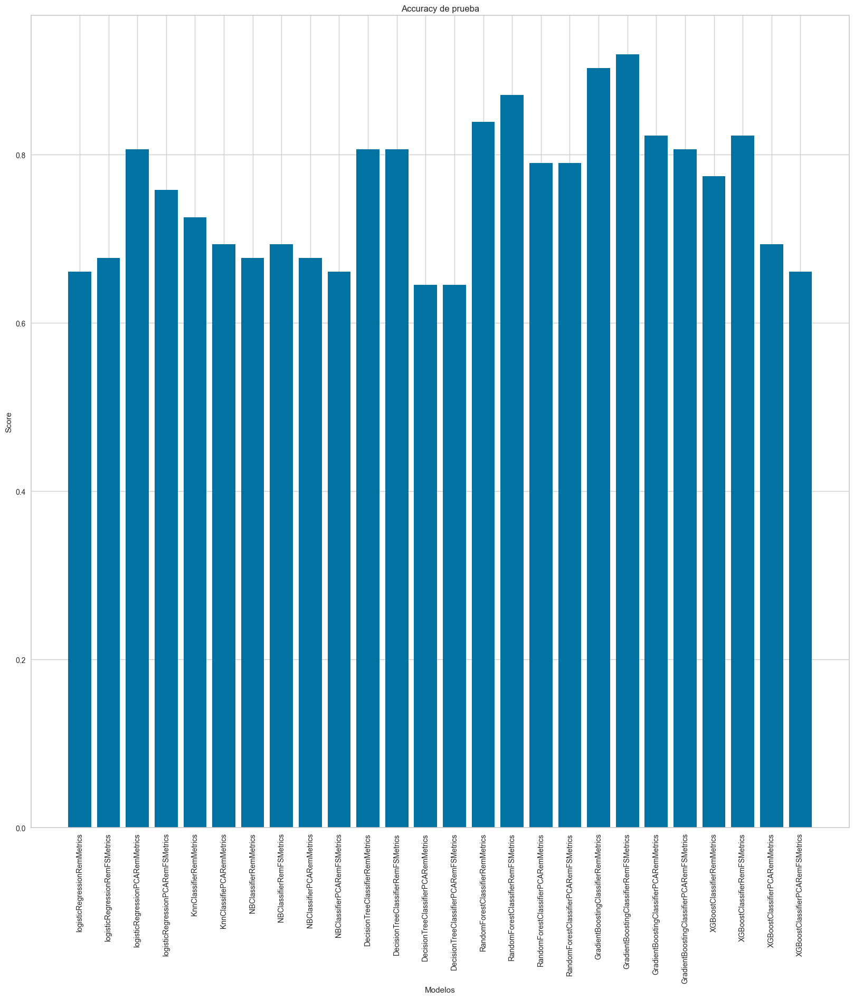

In [ ]:
# Diagrama de barras para observar el modelo más importante de acuerdo al Accuracy de prueba

fig, ax = plt.subplots()
fig.set_size_inches((20,20))
ax.bar(names, [i['Test Accuracy'] for i in metrics])
ax.set(title='Accuracy de prueba',xlabel='Modelos',ylabel='Score')
plt.xticks(rotation='vertical')
plt.show()

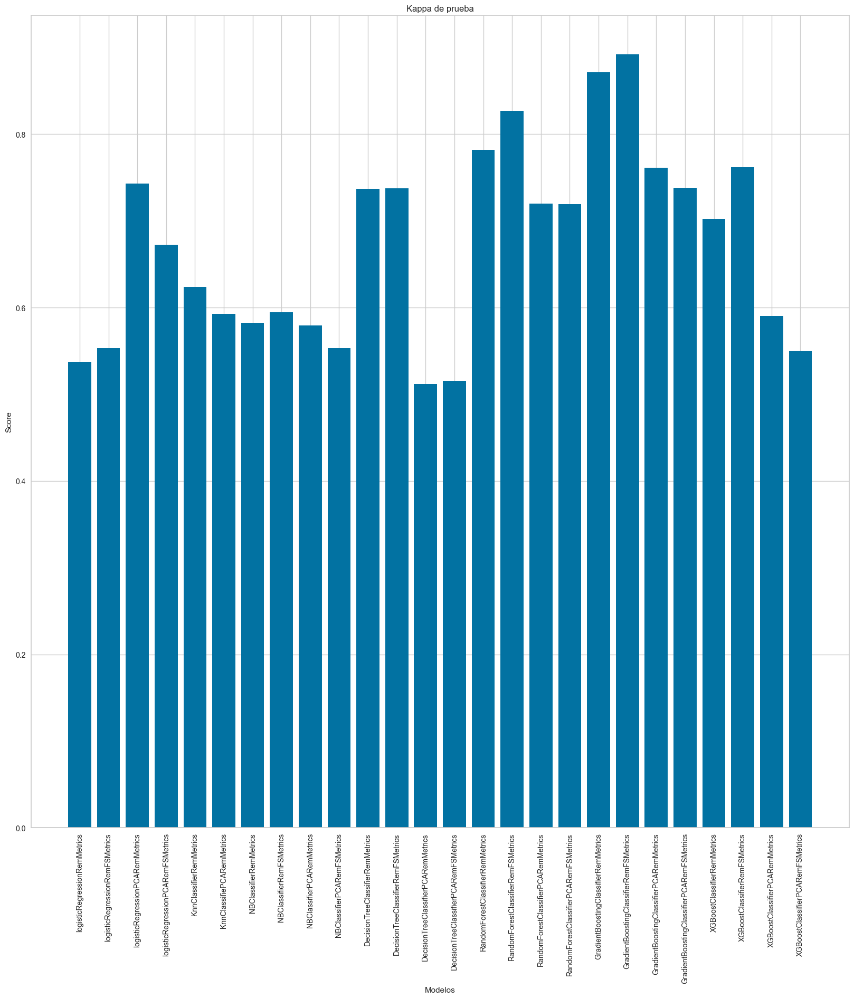

In [ ]:
# Diagrama de barras para observar el modelo más importante de acuerdo al Kappa de prueba

fig, ax = plt.subplots()
fig.set_size_inches((20,20))
ax.bar(names, [i['Test Kappa'] for i in metrics])
ax.set(title='Kappa de prueba',xlabel='Modelos',ylabel='Score')
plt.xticks(rotation='vertical')
plt.show()

In [ ]:
# Se organizan los modelos de acuerdo a su Accuracy de prueba

models = [(names[i],metrics[i]) for i in range(len(names))]
models = sorted(models,key=lambda x:x[1]['Test Accuracy'],reverse=True)
ranking = pd.DataFrame(columns=['Model','Test Accuracy'])
for model in models:
    ranking = pd.concat([ranking, pd.DataFrame([{'Model':model[0],'Test Accuracy':model[1]['Test Accuracy']}])],ignore_index=True)
ranking

,Model,Test Accuracy
0,GradientBoostingClassifierRemFSMetrics,0.919355
1,GradientBoostingClassifierRemMetrics,0.903226
2,RandomForestClassifierRemFSMetrics,0.870968
3,RandomForestClassifierRemMetrics,0.838710
4,GradientBoostingClassifierPCARemMetrics,0.822581
5,XGBoostClassifierRemFSMetrics,0.822581
6,logisticRegressionPCARemMetrics,0.806452
7,DecisionTreeClassifierRemMetrics,0.806452
8,DecisionTreeClassifierRemFSMetrics,0.806452
9,GradientBoostingClassifierPCARemFSMetrics,0.806452


In [ ]:
# Se organizan los modelos de acuerdo a su Kappa de prueba

models = [(names[i],metrics[i]) for i in range(len(names))]
models = sorted(models,key=lambda x:x[1]['Test Kappa'],reverse=True)
ranking = pd.DataFrame(columns=['Model','Test Kappa'])
for model in models:
    ranking = pd.concat([ranking, pd.DataFrame([{'Model':model[0],'Test Kappa':model[1]['Test Kappa']}])],ignore_index=True)
ranking

,Model,Test Kappa
0,GradientBoostingClassifierRemFSMetrics,0.892211
1,GradientBoostingClassifierRemMetrics,0.871280
2,RandomForestClassifierRemFSMetrics,0.826816
3,RandomForestClassifierRemMetrics,0.781767
4,XGBoostClassifierRemFSMetrics,0.762204
5,GradientBoostingClassifierPCARemMetrics,0.761372
6,logisticRegressionPCARemMetrics,0.742828
7,GradientBoostingClassifierPCARemFSMetrics,0.738397
8,DecisionTreeClassifierRemFSMetrics,0.737566
9,DecisionTreeClassifierRemMetrics,0.736823
